# Machine learning to assess the risk of inferring demographics from browser attributes

(“Homogeneity attacks”)

#### Research question:
Beyond uniquely identifying users, can fingerprinting strategies be used to infer demographics?

Consider the case where users sharing a fingerprint are highly likely to be in a demographic group at risk of targeting. While the individual users might not be identified, an advertiser can still target the demographic, which might be a protected category.
- E.g. consider 2016 voter suppression campaigns that targeted Black voters ([Cambridge Analytica scandal](https://www.washingtonpost.com/technology/2020/09/28/trump-2016-cambridge-analytica-suppression/))
- Note [Google prohibits targeting ads based on race or ethnicity](https://support.google.com/adspolicy/answer/143465?hl=en)



In [ ]:
from IPython.display import display
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from google.colab import drive

drive_path = '/content/drive/' # don't change this or try to combine with fpath
drive.mount(drive_path)#, force_remount=True)
drive_fpath = '/content/drive/MyDrive/fingerprinting-data-analysis'


# This file is available via github but there are bandwidth limits on git LFS
# so I also copied it to this drive.
survey_and_browser_attrs_fpath = drive_fpath + '/survey-and-browser-attributes-data.txt'
# survey_and_browser_attrs_fpath = 'https://media.githubusercontent.com/media/aberke/fingerprinting-study/master/data/survey-and-browser-attributes-data.csv'

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


## Set up the data


### Browser attributes data

We replace NaN values with the empty string so that these are handled similarly and so that empty values are captured by calls to `value_counts` (NaN values are not).

We keep only the columns for participant demographic and browser attributes that we wish to study.

We only use browser attributes we consider stable for fingerprinting.

In [ ]:
demos_cols = [
    'Q-demos-age', 'Q-demos-gender', 'Q-demos-hispanic', 'Q-demos-race', 'Q-demos-income',
]
stable_ba_names = [
    'User agent', 'Languages', # Can be collected passively via HTTP headers
    'Timezone', 'Screen resolution',
    'Color depth', 'Platform', 'Touch points',
    'Hardware concurrency', 'Device memory',
    'WebGL Vendor', 'WebGL Unmasked Vendor',
    'WebGL Renderer', 'WebGL Unmasked Renderer',
]

In [ ]:
# Replace nan values with the empty string
sba_df = pd.read_csv(
    survey_and_browser_attrs_fpath, usecols=['ResponseId']+demos_cols+stable_ba_names
).set_index('ResponseId').fillna('')
# Rename some columns
sba_df = sba_df.rename(columns={
    'Q-demos-age': 'Age',
    'Q-demos-gender': 'Gender',
    'Q-demos-hispanic': 'Hispanic',
    'Q-demos-race': 'Race',
    'Q-demos-income': 'Income',
})
N = len(sba_df)
print('N=%s'%N)
# sba_df.head(3)

N=8400


In [ ]:
# We apply some transformations to the demographics in order to make the data easier to analyze.
# map race to shorter names and aggregate other and mixed to 'Other or mixed'
race_names_map = {
    'White or Caucasian': 'White',
    'Black or African American': 'Black',
    'Asian': 'Asian'
    # All others we map to 'Other or mixed'
    # 'Native Hawaiian or Other Pacific Islander': no participants in our dataset
    # 'American Indian/Native American or Alaska Native': too few participants in our dataset
}
def map_race(r):
    if r in race_names_map:
        return race_names_map[r]
    return 'Other or mixed'

# Create new race column -- drop old one
sba_df['Race'] = sba_df['Race'].apply(map_race)
sba_df['Race'].value_counts()

White             5911
Black              938
Asian              842
Other or mixed     709
Name: Race, dtype: int64

In [ ]:
# Make reduced versions of Age and Income demographics, mapping 6 categories to 3
sba_df['Age'] = sba_df['Age'].map({
    '18 - 24 years': '18 - 34 years',
    '25 - 34 years': '18 - 34 years',
    '35 - 44 years': '35 - 54 years',
    '45 - 54 years': '35 - 54 years',
    '55 - 64 years': '55 or older',
    '65 or older': '55 or older',
})
sba_df['Income'] = sba_df['Income'].map({
    'Less than $25,000': 'Less than $50,000',
    '$25,000 - $49,999': 'Less than $50,000',
    '$50,000 - $74,999': '$50,000 - $99,999',
    '$75,000 - $99,999': '$50,000 - $99,999',
    '$100,000 - $149,999': '$100,000 or more',
    '$150,000 or more': '$100,000 or more',
    'Prefer not to say': 'Prefer not to say'
})
print('Reduced:')
print('Age')
display(sba_df['Age'].value_counts().sort_index())
print('Income')
display(sba_df['Income'].value_counts().sort_index())

Reduced:
Age


18 - 34 years    4161
35 - 54 years    3182
55 or older      1057
Name: Age, dtype: int64

Income


$100,000 or more     2362
$50,000 - $99,999    2959
Less than $50,000    2939
Prefer not to say     140
Name: Income, dtype: int64

In [ ]:
# Helper for analysis below
# Income group: Sorted and exclude 'Prefer not to say'
income_groups = ['Less than $50,000', '$50,000 - $99,999', '$100,000 or more']

In [ ]:
Ds = {
    'Gender': ['Male','Female'],
    'Age': sorted(sba_df['Age'].unique()),
    'Hispanic': ['Yes', 'No'],
    'Race': ['White','Black','Asian','Other or mixed'],
    'Income': income_groups,
}
# for each D, get sample level prevalence mapping of p(D) {d:p(d)}
p_Ds = {D_name: {d: len(sba_df[sba_df[D_name]==d])/N for d in D} for (D_name, D) in Ds.items()}
print(p_Ds)
Ds

{'Gender': {'Male': 0.5032142857142857, 'Female': 0.475}, 'Age': {'18 - 34 years': 0.4953571428571429, '35 - 54 years': 0.3788095238095238, '55 or older': 0.12583333333333332}, 'Hispanic': {'Yes': 0.10988095238095238, 'No': 0.8901190476190476}, 'Race': {'White': 0.7036904761904762, 'Black': 0.11166666666666666, 'Asian': 0.10023809523809524, 'Other or mixed': 0.0844047619047619}, 'Income': {'Less than $50,000': 0.3498809523809524, '$50,000 - $99,999': 0.3522619047619048, '$100,000 or more': 0.2811904761904762}}


{'Gender': ['Male', 'Female'],
 'Age': ['18 - 34 years', '35 - 54 years', '55 or older'],
 'Hispanic': ['Yes', 'No'],
 'Race': ['White', 'Black', 'Asian', 'Other or mixed'],
 'Income': ['Less than $50,000', '$50,000 - $99,999', '$100,000 or more']}

### Classifier

In [ ]:
from sklearn.metrics import accuracy_score, auc, precision_score, recall_score
from sklearn.metrics import confusion_matrix,  ConfusionMatrixDisplay
from sklearn.metrics import RocCurveDisplay, roc_auc_score
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split

### Set up the data

In [ ]:
from sklearn.preprocessing import OneHotEncoder


def col_name_combiner(attribute_name, c):
  return str(attribute_name) + ':' + str(c)


def get_one_hot_encoded_df(df=sba_df, attribute_names=stable_ba_names, k=100):
  encoded_df = None
  for attribute_name in attribute_names:
    val_counts = df[attribute_name].value_counts()
    categories = val_counts[val_counts >= k].index.astype(str).tolist()
    # only encode values for the given categories, otherwise return a feature vector of all 0's (i.e. ignore)
    encoder = OneHotEncoder(categories=[categories], handle_unknown='ignore')
    encoded = encoder.fit_transform(df[attribute_name].astype(str).to_numpy().reshape(-1, 1)).toarray()
    edf = pd.DataFrame(encoded, columns=[col_name_combiner(attribute_name, c) for c in categories]).set_index(df[attribute_name].index)
    encoded_df = edf if (encoded_df is None) else encoded_df.merge(edf, right_index=True, left_index=True)
  return encoded_df

In [ ]:
features_list = stable_ba_names

def get_X(df=sba_df, k=100):
  X = get_one_hot_encoded_df(df, features_list, k=k)
  print('k=%s' % k)
  print('X shape:', X.shape) # 85 columns when k=100
  return X

def setup_demos_data(X, Ds=Ds):
  """
  Returns a dictionary that sets up the data for grid search for each of the demos
  Make a dictionary with structure:
  {
    <Demo name>: {
      'y': [(boolean) all y values]
      'train_test_split': (X_train, X_test, y_train, y_test)
    }
  }
  Note this does not put the D category in the demo name (e.g. Hispanic:Yes is just 'Yes')
  """
  demos_data = {demo: {'y': sba_df.loc[X.index][D].apply(lambda d: 1 if d==demo else 0)} for D in Ds.keys() for demo in Ds[D]}
  for demo, demo_dict in demos_data.items():
    demo_y = demo_dict['y']
    demos_data[demo]['train_test_split'] = train_test_split(X, demo_y, test_size=0.2, stratify=demo_y, random_state=1)
  return demos_data

X = get_X(k=100)
display(X.head(3))
demos_data = setup_demos_data(X)
print(list(demos_data.keys()))

k=100
X shape: (8400, 85)


,"User agent:Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/120.0.0.0 Safari/537.36","User agent:Mozilla/5.0 (Linux; Android 10; K) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/120.0.0.0 Mobile Safari/537.36","User agent:Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/120.0.0.0 Safari/537.36","User agent:Mozilla/5.0 (iPhone; CPU iPhone OS 17_1_2 like Mac OS X) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/17.1.2 Mobile/15E148 Safari/604.1","User agent:Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/120.0.0.0 Safari/537.36 Edg/120.0.0.0",User agent:Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:120.0) Gecko/20100101 Firefox/120.0,User agent:Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:121.0) Gecko/20100101 Firefox/121.0,"User agent:Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/119.0.0.0 Safari/537.36","User agent:Mozilla/5.0 (X11; CrOS x86_64 14541.0.0) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/119.0.0.0 Safari/537.36","User agent:Mozilla/5.0 (iPhone; CPU iPhone OS 17_1 like Mac OS X) AppleWebKit/605.1.15 (KHTML, like Gecko) CriOS/120.0.6099.119 Mobile/15E148 Safari/604.1",...,"WebGL Renderer:ANGLE (Intel, Intel(R) HD Graphics Direct3D11 vs_5_0 ps_5_0)",WebGL Unmasked Renderer:Apple GPU,"WebGL Unmasked Renderer:ANGLE (Google, Vulkan 1.3.0 (SwiftShader Device (Subzero) (0x0000C0DE)), SwiftShader driver)","WebGL Unmasked Renderer:ANGLE (Intel, Intel(R) Iris(R) Xe Graphics (0x00009A49) Direct3D11 vs_5_0 ps_5_0, D3D11)","WebGL Unmasked Renderer:ANGLE (Apple, ANGLE Metal Renderer: Apple M1, Unspecified Version)","WebGL Unmasked Renderer:ANGLE (NVIDIA, NVIDIA GeForce GTX 980 Direct3D11 vs_5_0 ps_5_0)","WebGL Unmasked Renderer:ANGLE (Intel, Intel(R) HD Graphics 400 Direct3D11 vs_5_0 ps_5_0)","WebGL Unmasked Renderer:ANGLE (Intel, Intel(R) HD Graphics Direct3D11 vs_5_0 ps_5_0)","WebGL Unmasked Renderer:ANGLE (Intel, Intel(R) UHD Graphics 620 (0x00005917) Direct3D11 vs_5_0 ps_5_0, D3D11)","WebGL Unmasked Renderer:ANGLE (Qualcomm, Adreno (TM) 740, OpenGL ES 3.2)"
ResponseId,,,,,,,,,,,,,,,,,,,,,
R_107DpGEXCf0M8mM,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
R_108GtMMONtiVpcZ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
R_1090e2cXjsXnTzl,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


['Male', 'Female', '18 - 34 years', '35 - 54 years', '55 or older', 'Yes', 'No', 'White', 'Black', 'Asian', 'Other or mixed', 'Less than $50,000', '$50,000 - $99,999', '$100,000 or more']


The following hyperparameters were determined via a grid search process
- k=100
- batch_size = 1024
- hidden_layer_sizes = (32, 8, 2)
- activation = 'identity' # Yes better than relu
- alpha = default (0.0001) # This is the L2 regularization parameter. Increasing alpha made no improvements.

In [ ]:
# Here are the best parameters that work well across the different demographic groups
batch_size = 1024
hidden_layer_sizes = (32, 8, 2)
# identity much better than relu: relu doesn't converge and end up with AUC 0.5, end train loss way different than test loss
activation = 'identity'

def get_trained_demo_model_results(demos_data, verbose=True, batch_size=batch_size, hidden_layer_sizes=hidden_layer_sizes, activation=activation):
  demo_model_results_dict = {}
  for i, (demo, demo_dict) in enumerate(demos_data.items()):
    (X_train, X_test, y_train, y_test) = demo_dict['train_test_split']
    if verbose:
      print(demo)
      print('training with %s samples; test with %s samples' % (len(X_train), len(X_test)))
    clf = MLPClassifier(random_state=0, activation=activation, hidden_layer_sizes=hidden_layer_sizes, batch_size=batch_size)
    clf.fit(X_train, y_train)
    y_score = clf.predict_proba(X_test)[:,1]
    auc = roc_auc_score(y_test, y_score)
    demo_model_results_dict[demo] = {
        'AUROC': auc,
        'clf': clf,
    }
    if verbose:
      print('AUROC: %0.4f' % auc)
      fig, ax = plt.subplots(1,1,figsize=(3,3))
      p = RocCurveDisplay.from_predictions(
          y_test,
          y_score,
          color="darkorange",
          ax=ax
      )
      _ = p.ax_.set(
          xlabel="False Positive Rate",
          ylabel="True Positive Rate",
          title="%s ROC curve" % demo,
      )
      plt.show()
  return demo_model_results_dict

Male
training with 6720 samples; test with 1680 samples
AUROC: 0.6629


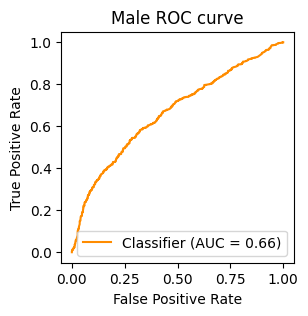

Female
training with 6720 samples; test with 1680 samples
AUROC: 0.6788


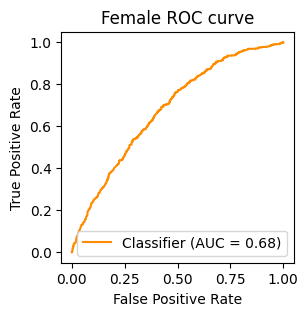

18 - 34 years
training with 6720 samples; test with 1680 samples
AUROC: 0.6394


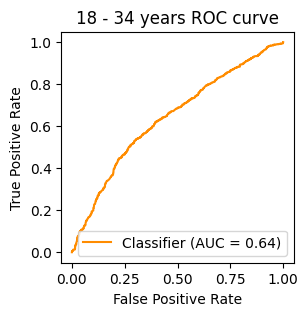

35 - 54 years
training with 6720 samples; test with 1680 samples
AUROC: 0.5470


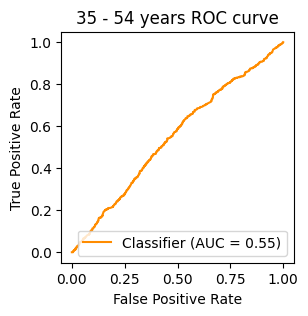

55 or older
training with 6720 samples; test with 1680 samples
AUROC: 0.6441


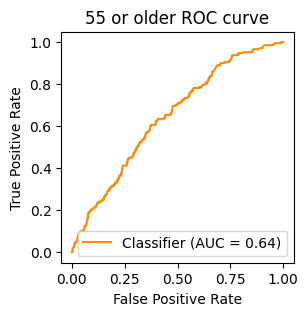

Yes
training with 6720 samples; test with 1680 samples
AUROC: 0.6003


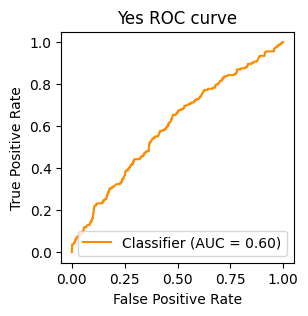

No
training with 6720 samples; test with 1680 samples
AUROC: 0.6178


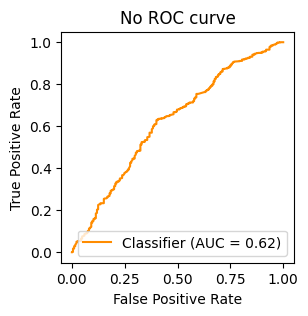

White
training with 6720 samples; test with 1680 samples
AUROC: 0.5720


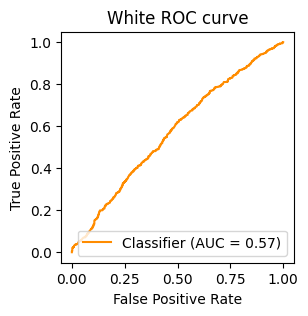

Black
training with 6720 samples; test with 1680 samples
AUROC: 0.6766


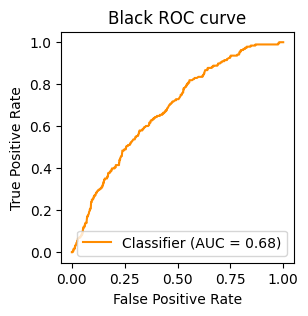

Asian
training with 6720 samples; test with 1680 samples
AUROC: 0.6978


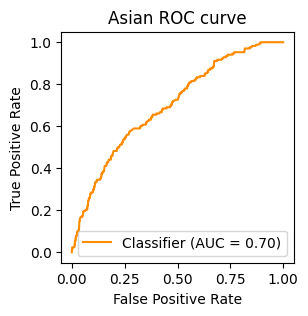

Other or mixed
training with 6720 samples; test with 1680 samples
AUROC: 0.5834


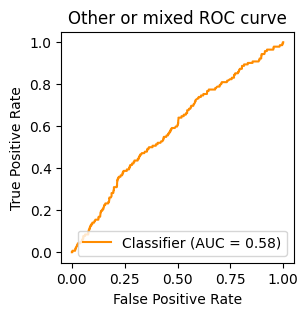

Less than $50,000
training with 6720 samples; test with 1680 samples
AUROC: 0.6045


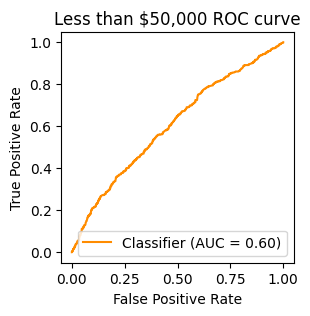

$50,000 - $99,999
training with 6720 samples; test with 1680 samples
AUROC: 0.5157


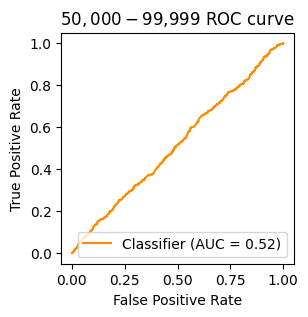

$100,000 or more
training with 6720 samples; test with 1680 samples
AUROC: 0.6170


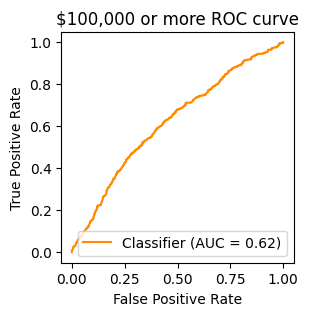

In [ ]:
demo_model_results_dict = get_trained_demo_model_results(demos_data)

In [ ]:
# show a table with the AUROC scores
auroc_df = pd.DataFrame({
    'AUROC': [demo_dict['AUROC'] for demo_dict in demo_model_results_dict.values()]
}, index=list(demo_model_results_dict.keys())).round(3)
auroc_df

,AUROC
Male,0.663
Female,0.679
18 - 34 years,0.639
35 - 54 years,0.547
55 or older,0.644
Yes,0.600
No,0.618
White,0.572
Black,0.677
Asian,0.698


### Inspect loss

In [ ]:
from sklearn.metrics import log_loss

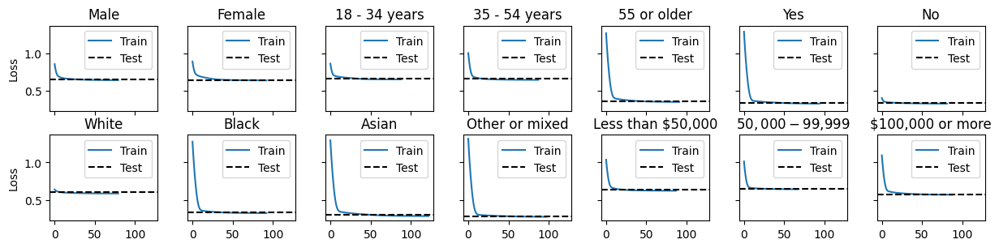

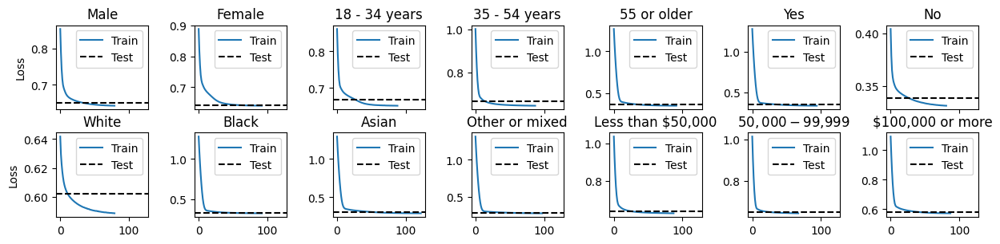

In [ ]:
cols = int(len(demos_data)/2)
fig, axes = plt.subplots(2, cols, figsize=(1.75*cols, 3), sharex=True, sharey=True)
plt.tight_layout()

for i, (demo, demo_dict) in enumerate(demo_model_results_dict.items()):
  ax = axes.flatten()[i]
  if i in [0, cols]: ax.set_ylabel('Loss')
  ax.set_title(demo)
  clf = demo_dict['clf']
  ax.plot(clf.loss_curve_, label='Train')
  (_X_train, X_test, _y_train, y_test) = demos_data[demo]['train_test_split']
  y_score = clf.predict_proba(X_test)[:,1]
  test_loss = log_loss(y_test, y_score)
  ax.axhline(y=test_loss, color='black', linestyle='--', label='Test')
  ax.legend()
plt.show()

# Show the plots again, without the same y-axis scale
fig, axes = plt.subplots(2, cols, figsize=(1.75*cols, 3), sharex=True)#, sharey=True)
plt.tight_layout()
for i, (demo, demo_dict) in enumerate(demo_model_results_dict.items()):
  ax = axes.flatten()[i]
  if i in [0, cols]: ax.set_ylabel('Loss')
  ax.set_title(demo)
  clf = demo_dict['clf']
  ax.plot(clf.loss_curve_, label='Train')
  (_X_train, X_test, _y_train, y_test) = demos_data[demo]['train_test_split']
  y_score = clf.predict_proba(X_test)[:,1]
  test_loss = log_loss(y_test, y_score)
  ax.axhline(y=test_loss, color='black', linestyle='--', label='Test')
  ax.legend()

### Overall what are better ways to present interpretable results?

Precision / Recall curves

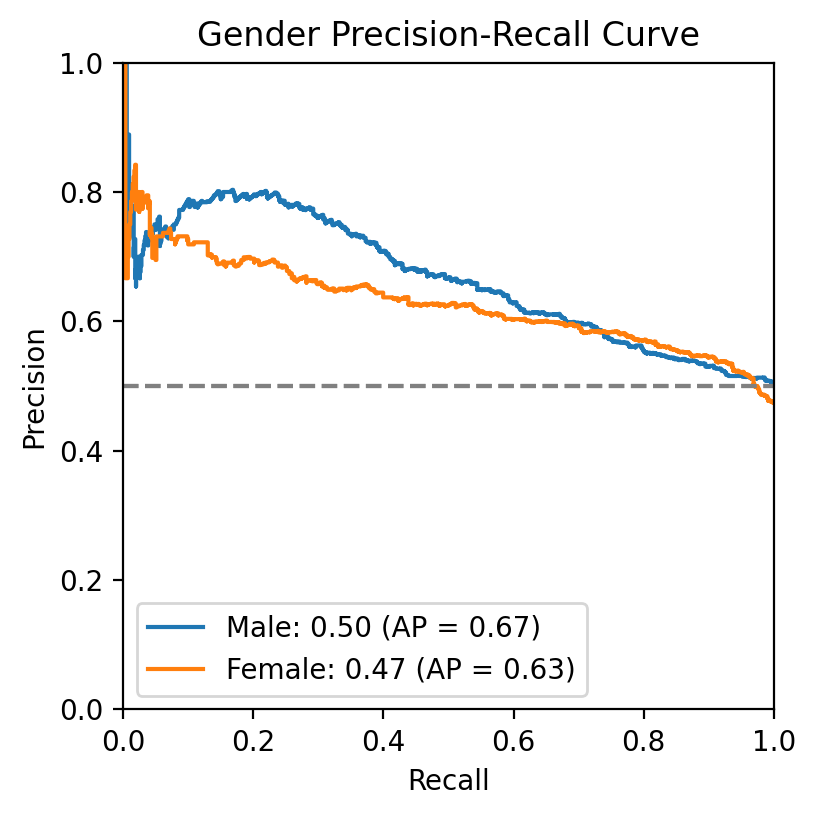

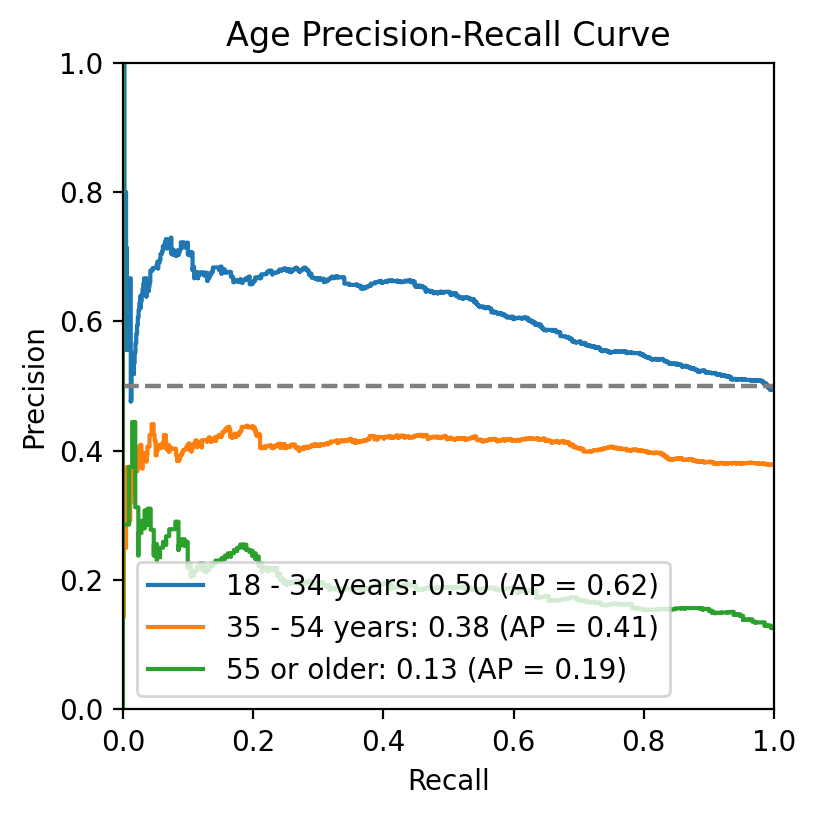

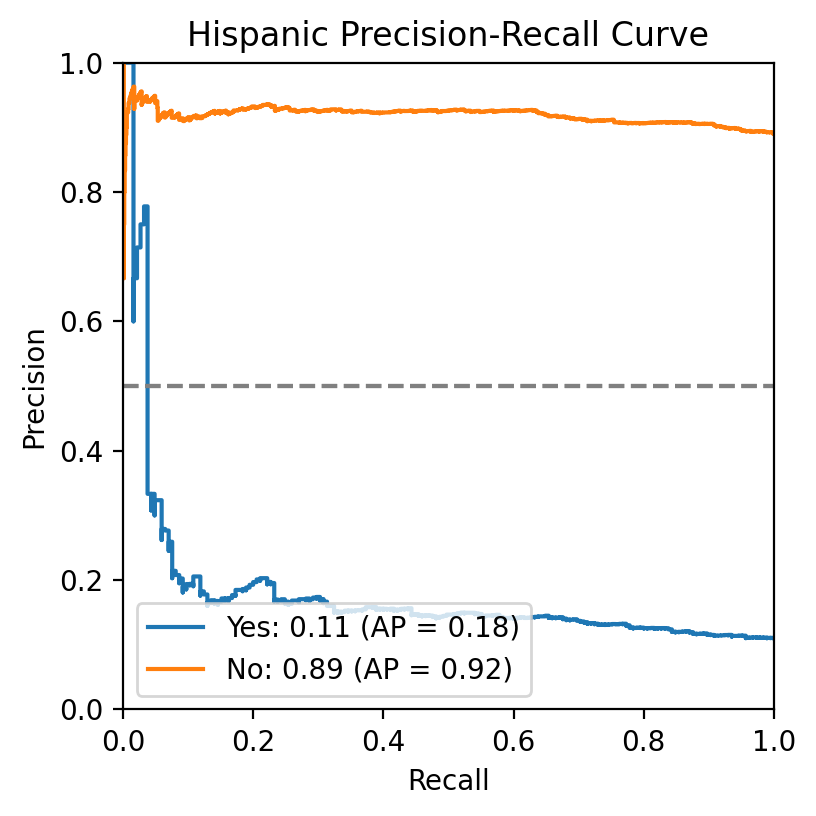

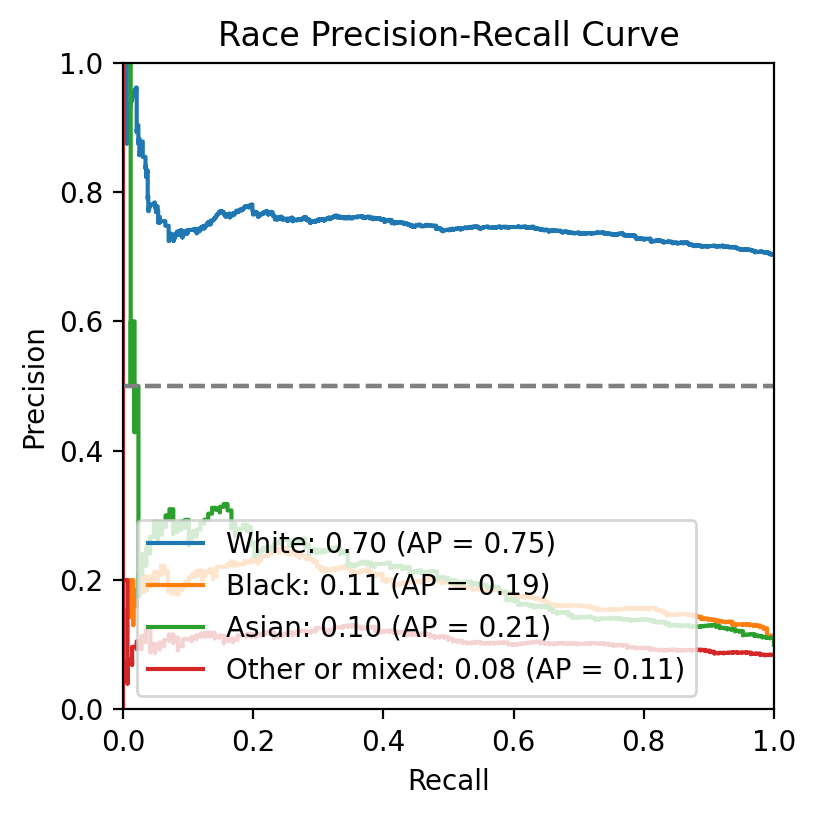

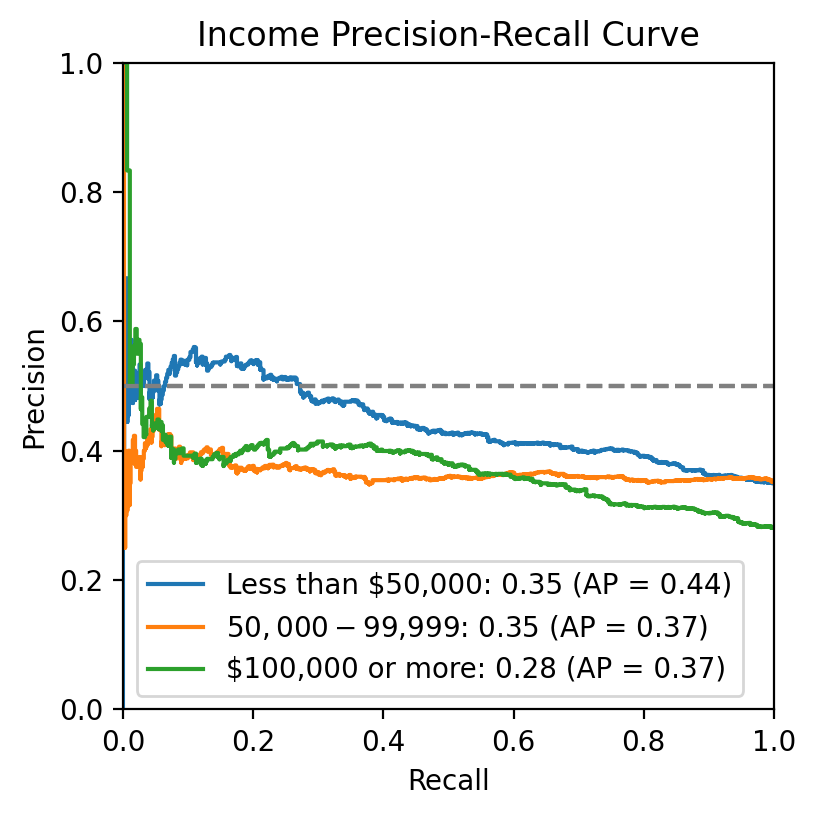

In [ ]:
"""
Reminder
demos data: {demo: { .., 'train_test_split': (X_train, X_test, y_train, y_test) }}
demo_model_results_dict: {demo: { 'AUROC': auc, 'clf': clf }}
"""
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import precision_recall_curve

for D_name, demo_list in Ds.items():
  fig, ax = plt.subplots(1,1,figsize=(4.2,4.2), dpi=200)
  for demo in demo_list:

    (_, X_test, _, y_test) = demos_data[demo]['train_test_split']
    clf = demo_model_results_dict[demo]['clf']

    y_score = clf.predict_proba(X_test)[:,1]

    display = PrecisionRecallDisplay.from_predictions(
        y_test, y_score, name="%s: %0.2f" % (demo, p_Ds[D_name][demo]), ax=ax,
    )
    ax.set_title("%s Precision-Recall Curve" % D_name)
    ax.set_xlabel('Recall')
    ax.set_xlim(0,1)
    ax.set_ylabel('Precision')
    ax.set_ylim(0, 1)
    ax.axhline(y=0.5, color='gray', linestyle='--')

Question: How do these results compare to when k=50?

Answer: Mostly worse for k=50 vs k=100 (likely due to overly trained models)

In [ ]:
X_k50 = get_X(k=50)
display(X_k50.head(3))
demos_data_k50 = setup_demos_data(X_k50)
demo_model_results_dict_k50 = get_trained_demo_model_results(demos_data_k50, verbose=False)
print('k=50')
pd.DataFrame({
    'AUROC': [demo_dict['AUROC'] for demo_dict in demo_model_results_dict_k50.values()]
}, index=list(demo_model_results_dict_k50.keys())).round(3)

k=50
X shape: (8400, 135)


,"User agent:Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/120.0.0.0 Safari/537.36","User agent:Mozilla/5.0 (Linux; Android 10; K) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/120.0.0.0 Mobile Safari/537.36","User agent:Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/120.0.0.0 Safari/537.36","User agent:Mozilla/5.0 (iPhone; CPU iPhone OS 17_1_2 like Mac OS X) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/17.1.2 Mobile/15E148 Safari/604.1","User agent:Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/120.0.0.0 Safari/537.36 Edg/120.0.0.0",User agent:Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:120.0) Gecko/20100101 Firefox/120.0,User agent:Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:121.0) Gecko/20100101 Firefox/121.0,"User agent:Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/119.0.0.0 Safari/537.36","User agent:Mozilla/5.0 (X11; CrOS x86_64 14541.0.0) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/119.0.0.0 Safari/537.36","User agent:Mozilla/5.0 (iPhone; CPU iPhone OS 17_1 like Mac OS X) AppleWebKit/605.1.15 (KHTML, like Gecko) CriOS/120.0.6099.119 Mobile/15E148 Safari/604.1",...,"WebGL Unmasked Renderer:ANGLE (Intel, Intel(R) Iris(R) Xe Graphics (0x000046A8) Direct3D11 vs_5_0 ps_5_0, D3D11)","WebGL Unmasked Renderer:ANGLE (Qualcomm, Adreno (TM) 619, OpenGL ES 3.2)","WebGL Unmasked Renderer:ANGLE (Intel Open Source Technology Center, Mesa DRI Intel(R) UHD Graphics 600 (GLK 2), OpenGL ES 3.2)","WebGL Unmasked Renderer:ANGLE (Apple, ANGLE Metal Renderer: Apple M2, Unspecified Version)","WebGL Unmasked Renderer:ANGLE (AMD, AMD Radeon(TM) Graphics (0x00001638) Direct3D11 vs_5_0 ps_5_0, D3D11)","WebGL Unmasked Renderer:ANGLE (ARM, Mali-G57 MC2, OpenGL ES 3.2)","WebGL Unmasked Renderer:ANGLE (AMD, AMD Radeon(TM) Graphics (0x000015D8) Direct3D11 vs_5_0 ps_5_0, D3D11)","WebGL Unmasked Renderer:ANGLE (Qualcomm, Adreno (TM) 650, OpenGL ES 3.2)",WebGL Unmasked Renderer:Mesa DRI Intel(R) HD Graphics 400 (BSW),"WebGL Unmasked Renderer:ANGLE (Qualcomm, Adreno (TM) 640, OpenGL ES 3.2)"
ResponseId,,,,,,,,,,,,,,,,,,,,,
R_107DpGEXCf0M8mM,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
R_108GtMMONtiVpcZ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
R_1090e2cXjsXnTzl,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


k=50


,AUROC
Male,0.658
Female,0.674
18 - 34 years,0.637
35 - 54 years,0.544
55 or older,0.627
Yes,0.594
No,0.623
White,0.580
Black,0.669
Asian,0.700


Idea: What if there was less data available? How does AUROC change?

If there is a steady increase that does not plateau, might we make conjectures about results with more data?

Explore this by:
- taking random subsamples of the data for fractions {0.2, 0.5, 0.6, ..., 1.0}
- take 80/20 train test split
- train and test the model on this smaller subsample
- report test AUROC

Note the data has a different shape for each subsample size, with fewer columns for smaller subsamples when we keep k. In order to handle this, the following repeats this process for varying k.

Make a table:

```
demo, AUROC@50, ...AUROC@100
```

Plot results.

Result: Surprising.

AUROC varies and is not improved with more vs less data.


--------------------
Subsample with 0.2 of data

k=1
X shape: (1680, 896)
Male
training with 1344 samples; test with 336 samples
AUROC: 0.5797


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


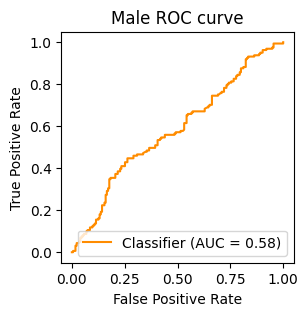

Female
training with 1344 samples; test with 336 samples
AUROC: 0.5352


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


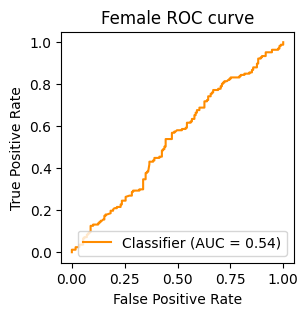

18 - 34 years
training with 1344 samples; test with 336 samples


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


AUROC: 0.5603


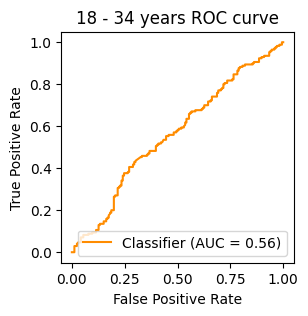

35 - 54 years
training with 1344 samples; test with 336 samples
AUROC: 0.5419


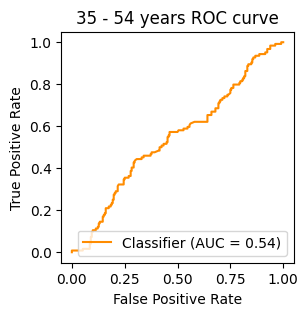

55 or older
training with 1344 samples; test with 336 samples
AUROC: 0.5459


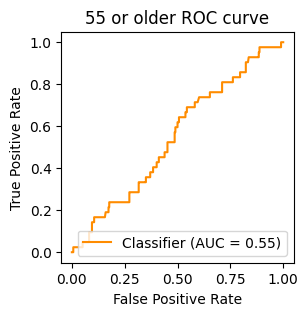

Yes
training with 1344 samples; test with 336 samples
AUROC: 0.6394


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


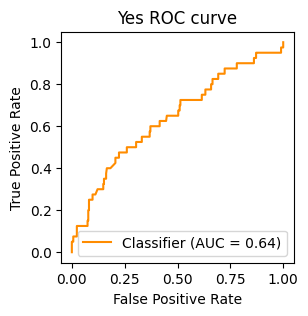

No
training with 1344 samples; test with 336 samples
AUROC: 0.6048


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


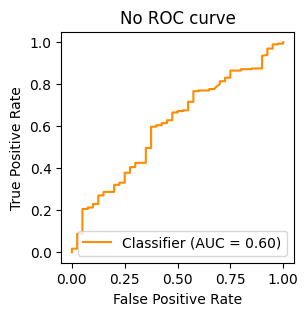

White
training with 1344 samples; test with 336 samples
AUROC: 0.5773


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


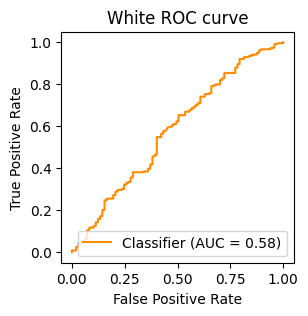

Black
training with 1344 samples; test with 336 samples
AUROC: 0.6675


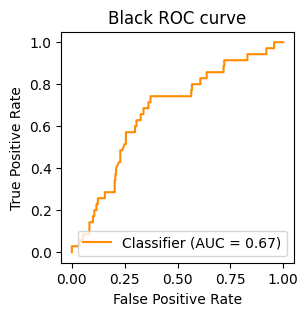

Asian
training with 1344 samples; test with 336 samples
AUROC: 0.6030


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


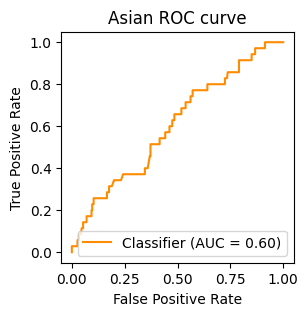

Other or mixed
training with 1344 samples; test with 336 samples


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


AUROC: 0.5176


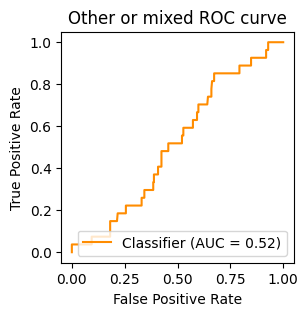

Less than $50,000
training with 1344 samples; test with 336 samples
AUROC: 0.5703


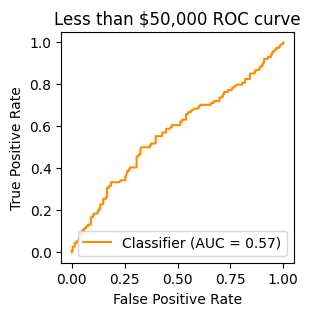

$50,000 - $99,999
training with 1344 samples; test with 336 samples
AUROC: 0.5284


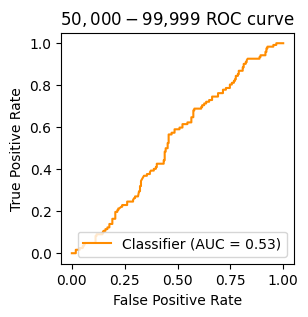

$100,000 or more
training with 1344 samples; test with 336 samples
AUROC: 0.5851


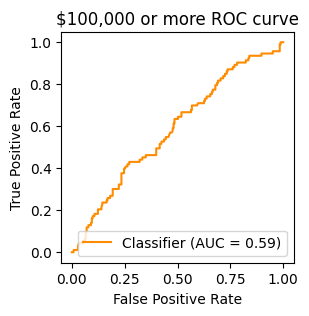


--------------------
Subsample with 0.3 of data

k=1
X shape: (2520, 1133)
Male
training with 2016 samples; test with 504 samples
AUROC: 0.6354


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


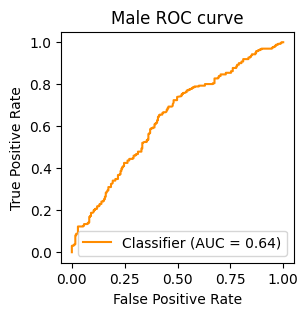

Female
training with 2016 samples; test with 504 samples
AUROC: 0.6374


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


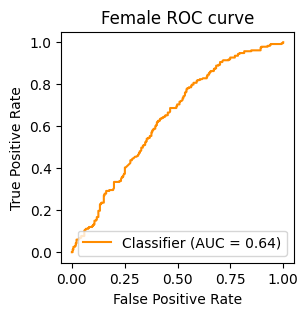

18 - 34 years
training with 2016 samples; test with 504 samples
AUROC: 0.6128


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


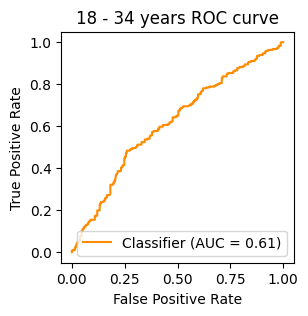

35 - 54 years
training with 2016 samples; test with 504 samples


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


AUROC: 0.4939


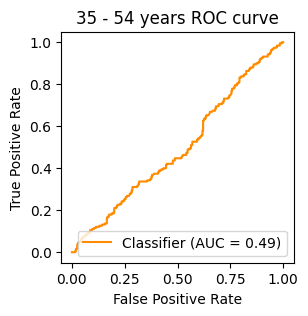

55 or older
training with 2016 samples; test with 504 samples
AUROC: 0.5419


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


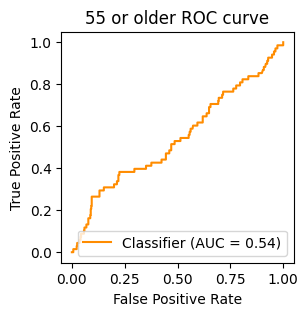

Yes
training with 2016 samples; test with 504 samples
AUROC: 0.5949


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


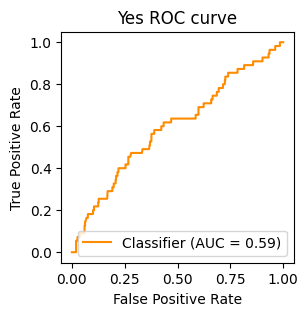

No
training with 2016 samples; test with 504 samples
AUROC: 0.5285


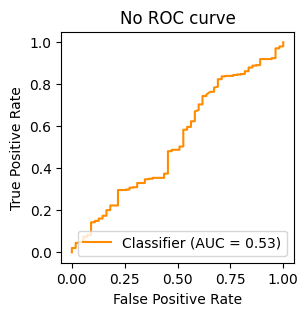

White
training with 2016 samples; test with 504 samples
AUROC: 0.5594


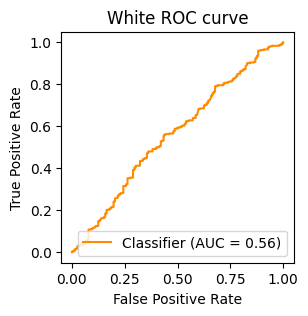

Black
training with 2016 samples; test with 504 samples


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


AUROC: 0.5401


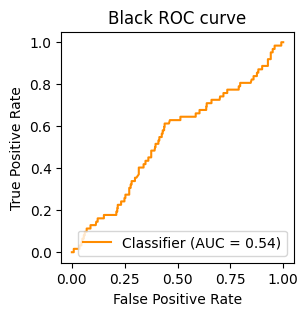

Asian
training with 2016 samples; test with 504 samples


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


AUROC: 0.6638


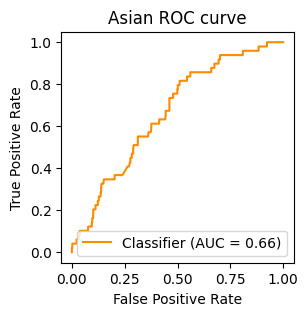

Other or mixed
training with 2016 samples; test with 504 samples


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


AUROC: 0.5417


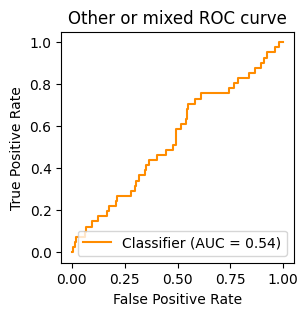

Less than $50,000
training with 2016 samples; test with 504 samples
AUROC: 0.5683


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


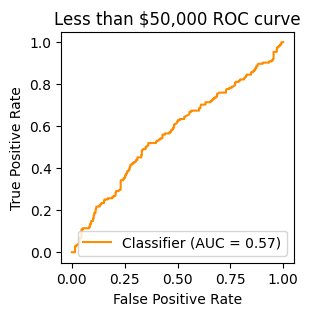

$50,000 - $99,999
training with 2016 samples; test with 504 samples


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


AUROC: 0.4833


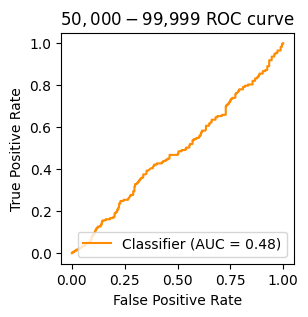

$100,000 or more
training with 2016 samples; test with 504 samples
AUROC: 0.5448


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


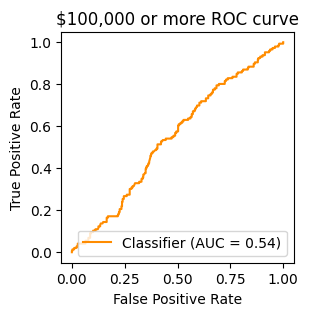


--------------------
Subsample with 0.4 of data

k=1
X shape: (3360, 1313)
Male
training with 2688 samples; test with 672 samples
AUROC: 0.6029


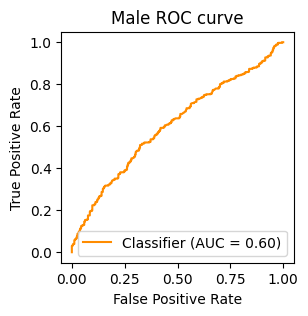

Female
training with 2688 samples; test with 672 samples
AUROC: 0.6233


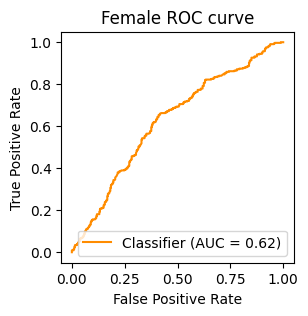

18 - 34 years
training with 2688 samples; test with 672 samples
AUROC: 0.6059


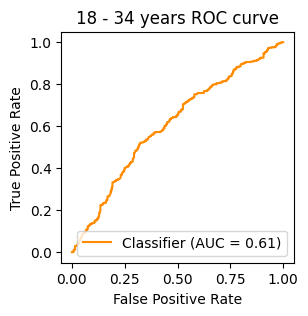

35 - 54 years
training with 2688 samples; test with 672 samples
AUROC: 0.5235


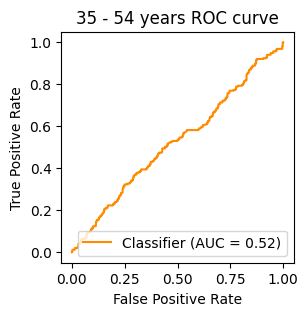

55 or older
training with 2688 samples; test with 672 samples
AUROC: 0.5566


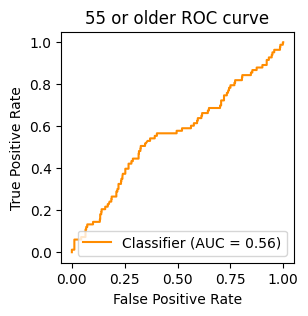

Yes
training with 2688 samples; test with 672 samples
AUROC: 0.6037


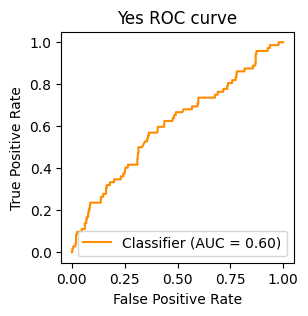

No
training with 2688 samples; test with 672 samples
AUROC: 0.5544


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


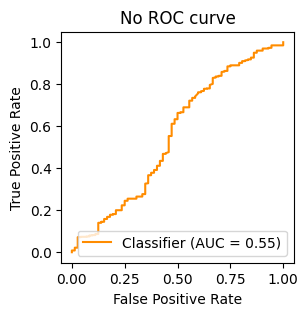

White
training with 2688 samples; test with 672 samples
AUROC: 0.5366


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


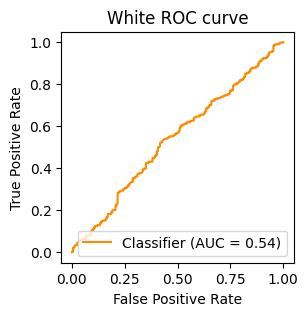

Black
training with 2688 samples; test with 672 samples
AUROC: 0.6344


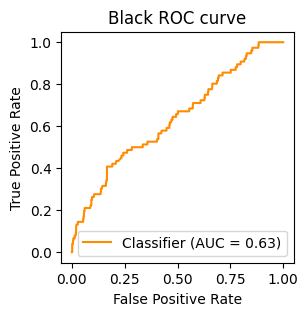

Asian
training with 2688 samples; test with 672 samples
AUROC: 0.5380


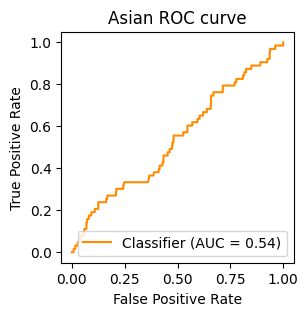

Other or mixed
training with 2688 samples; test with 672 samples
AUROC: 0.5545


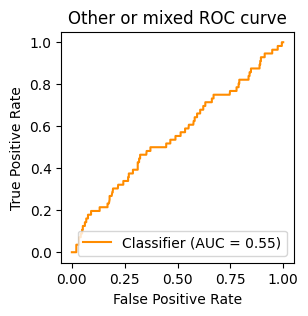

Less than $50,000
training with 2688 samples; test with 672 samples
AUROC: 0.5446


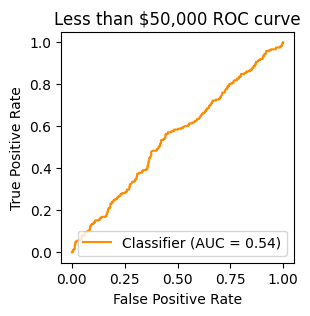

$50,000 - $99,999
training with 2688 samples; test with 672 samples
AUROC: 0.4942


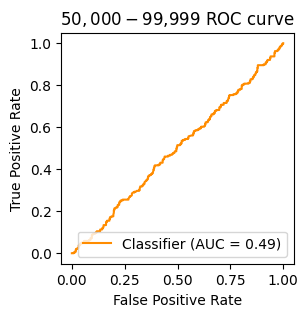

$100,000 or more
training with 2688 samples; test with 672 samples
AUROC: 0.5889


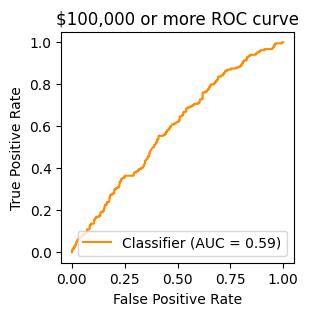


--------------------
Subsample with 0.5 of data

k=1
X shape: (4200, 1446)
Male
training with 3360 samples; test with 840 samples
AUROC: 0.6462


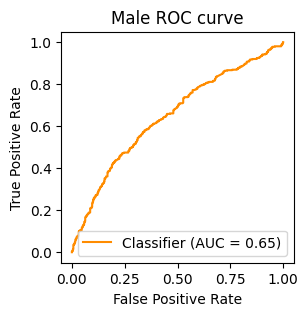

Female
training with 3360 samples; test with 840 samples
AUROC: 0.6274


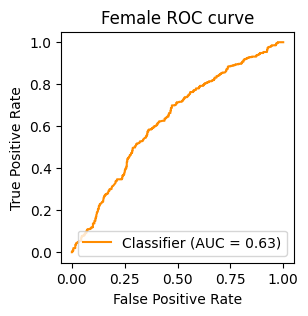

18 - 34 years
training with 3360 samples; test with 840 samples
AUROC: 0.6065


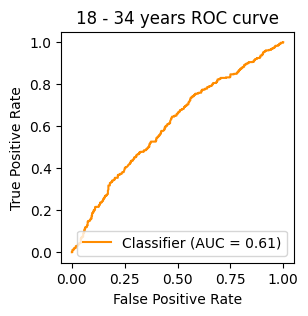

35 - 54 years
training with 3360 samples; test with 840 samples
AUROC: 0.5119


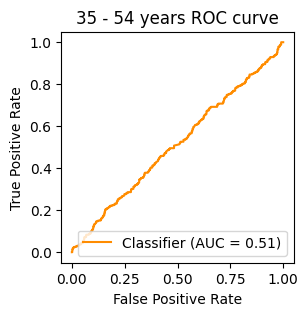

55 or older
training with 3360 samples; test with 840 samples
AUROC: 0.5890


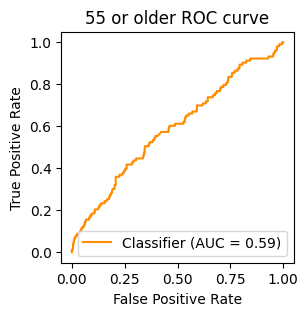

Yes
training with 3360 samples; test with 840 samples
AUROC: 0.6205


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


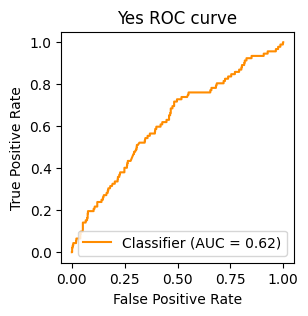

No
training with 3360 samples; test with 840 samples
AUROC: 0.5720


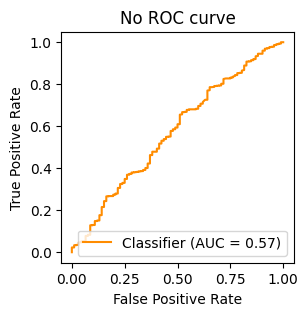

White
training with 3360 samples; test with 840 samples
AUROC: 0.5604


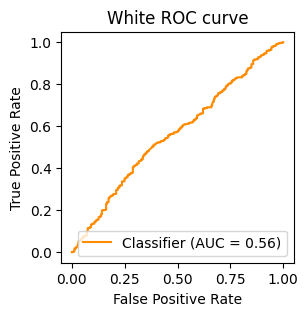

Black
training with 3360 samples; test with 840 samples
AUROC: 0.5896


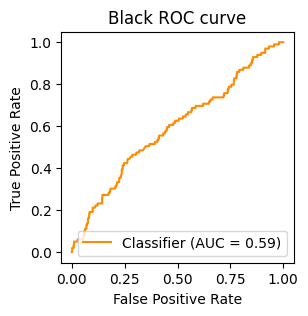

Asian
training with 3360 samples; test with 840 samples
AUROC: 0.5752


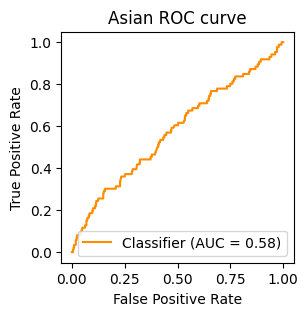

Other or mixed
training with 3360 samples; test with 840 samples


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


AUROC: 0.5752


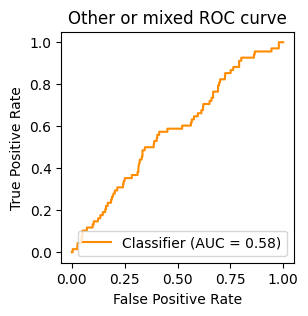

Less than $50,000
training with 3360 samples; test with 840 samples
AUROC: 0.5443


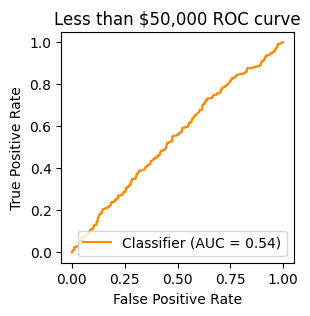

$50,000 - $99,999
training with 3360 samples; test with 840 samples
AUROC: 0.5092


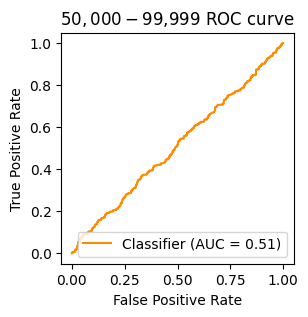

$100,000 or more
training with 3360 samples; test with 840 samples
AUROC: 0.5733


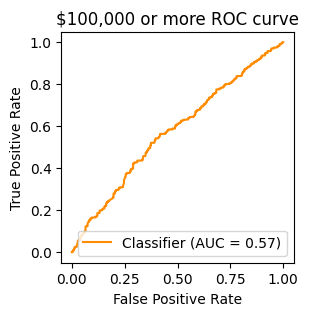


--------------------
Subsample with 0.6 of data

k=1
X shape: (5040, 1590)
Male
training with 4032 samples; test with 1008 samples
AUROC: 0.6135


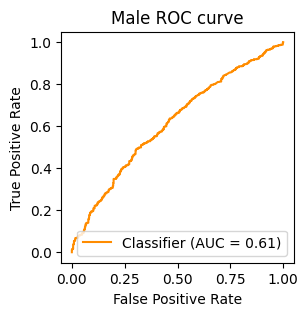

Female
training with 4032 samples; test with 1008 samples
AUROC: 0.5962


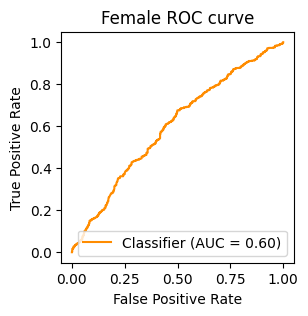

18 - 34 years
training with 4032 samples; test with 1008 samples
AUROC: 0.6089


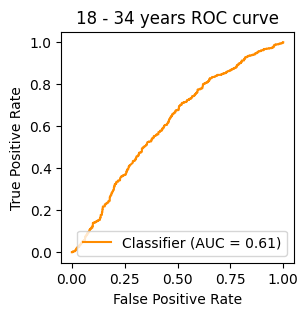

35 - 54 years
training with 4032 samples; test with 1008 samples
AUROC: 0.5129


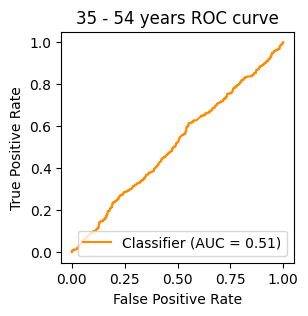

55 or older
training with 4032 samples; test with 1008 samples
AUROC: 0.6082


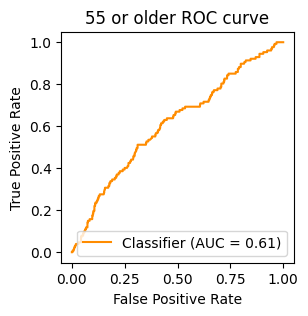

Yes
training with 4032 samples; test with 1008 samples
AUROC: 0.5785


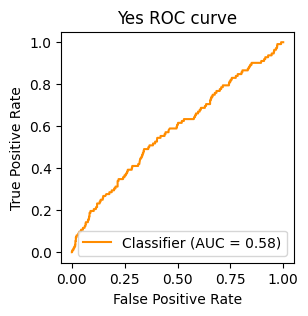

No
training with 4032 samples; test with 1008 samples
AUROC: 0.5997


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


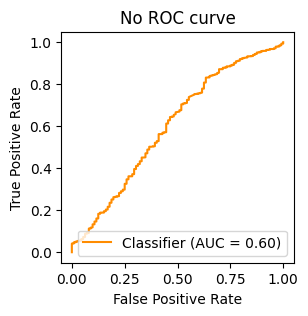

White
training with 4032 samples; test with 1008 samples
AUROC: 0.5539


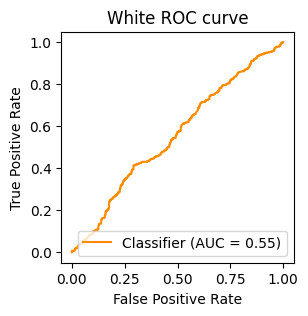

Black
training with 4032 samples; test with 1008 samples
AUROC: 0.5884


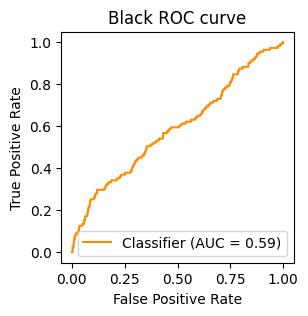

Asian
training with 4032 samples; test with 1008 samples
AUROC: 0.6371


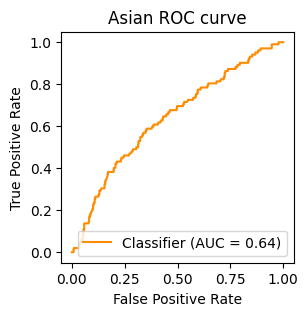

Other or mixed
training with 4032 samples; test with 1008 samples
AUROC: 0.4995


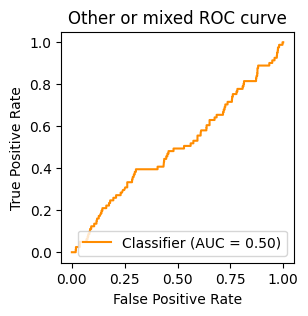

Less than $50,000
training with 4032 samples; test with 1008 samples
AUROC: 0.5510


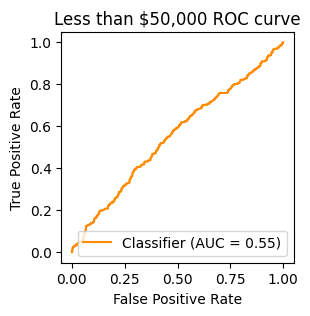

$50,000 - $99,999
training with 4032 samples; test with 1008 samples
AUROC: 0.4899


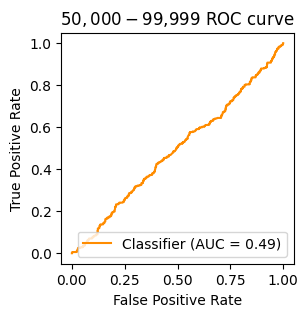

$100,000 or more
training with 4032 samples; test with 1008 samples
AUROC: 0.5546


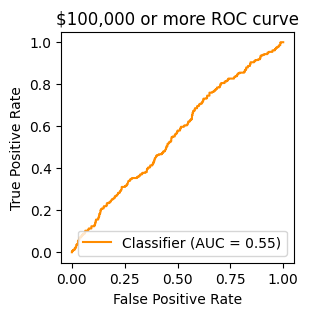


--------------------
Subsample with 0.7 of data

k=1
X shape: (5880, 1713)
Male
training with 4704 samples; test with 1176 samples
AUROC: 0.6223


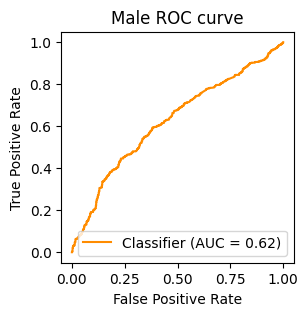

Female
training with 4704 samples; test with 1176 samples
AUROC: 0.6044


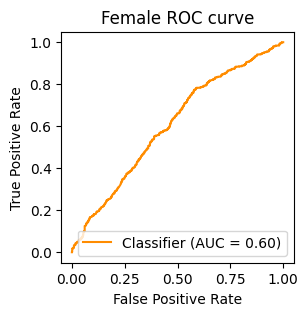

18 - 34 years
training with 4704 samples; test with 1176 samples
AUROC: 0.6229


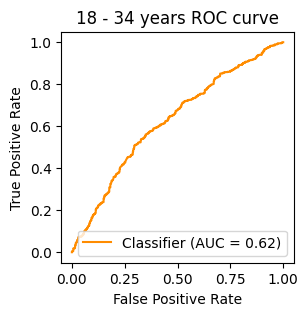

35 - 54 years
training with 4704 samples; test with 1176 samples
AUROC: 0.5641


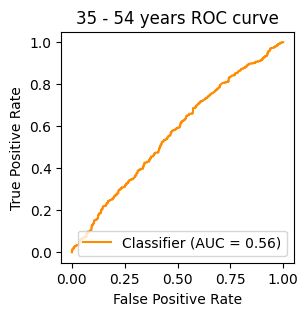

55 or older
training with 4704 samples; test with 1176 samples
AUROC: 0.6240


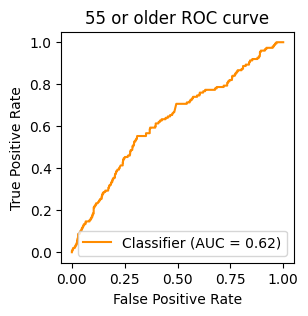

Yes
training with 4704 samples; test with 1176 samples
AUROC: 0.5599


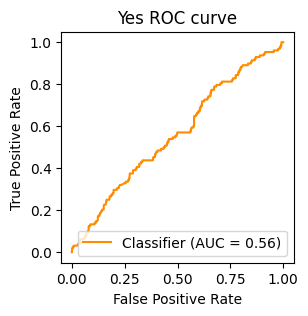

No
training with 4704 samples; test with 1176 samples
AUROC: 0.5951


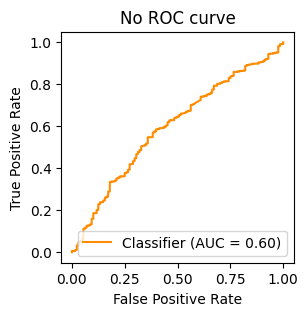

White
training with 4704 samples; test with 1176 samples
AUROC: 0.5549


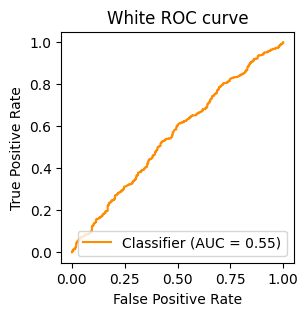

Black
training with 4704 samples; test with 1176 samples
AUROC: 0.6176


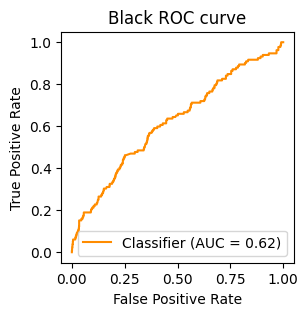

Asian
training with 4704 samples; test with 1176 samples
AUROC: 0.6361


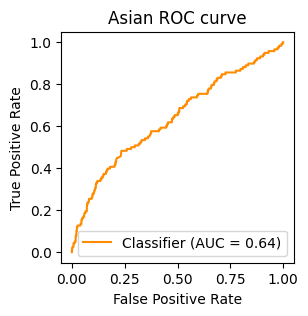

Other or mixed
training with 4704 samples; test with 1176 samples
AUROC: 0.5246


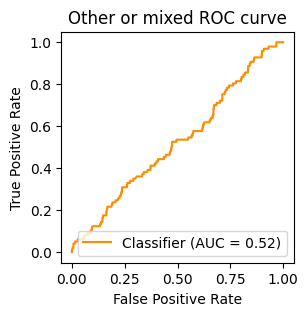

Less than $50,000
training with 4704 samples; test with 1176 samples
AUROC: 0.5775


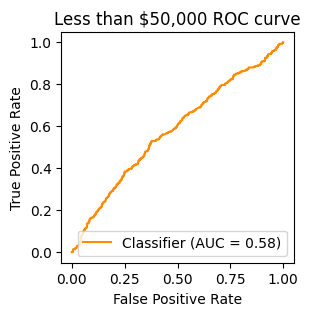

$50,000 - $99,999
training with 4704 samples; test with 1176 samples
AUROC: 0.4784


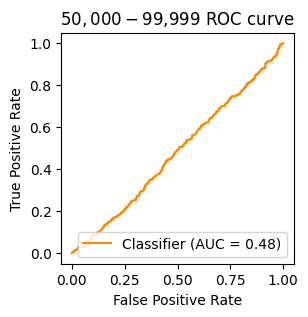

$100,000 or more
training with 4704 samples; test with 1176 samples
AUROC: 0.5741


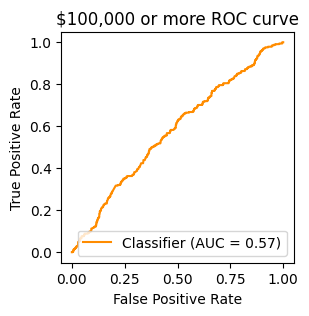


--------------------
Subsample with 0.8 of data

k=1
X shape: (6720, 1883)
Male
training with 5376 samples; test with 1344 samples
AUROC: 0.6379


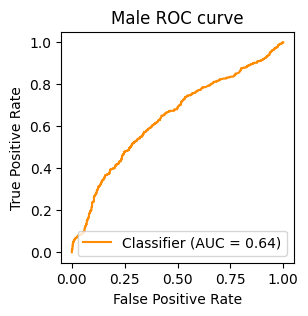

Female
training with 5376 samples; test with 1344 samples
AUROC: 0.6353


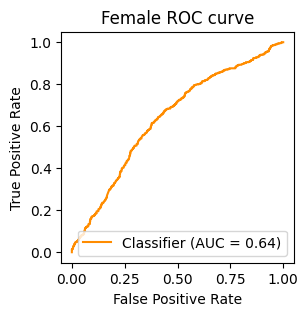

18 - 34 years
training with 5376 samples; test with 1344 samples
AUROC: 0.6080


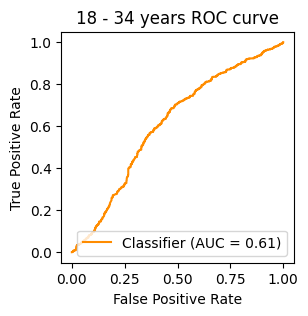

35 - 54 years
training with 5376 samples; test with 1344 samples
AUROC: 0.5226


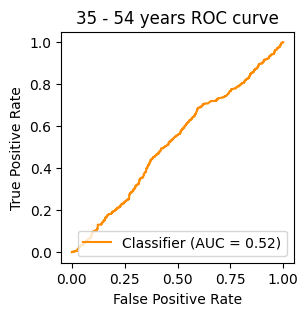

55 or older
training with 5376 samples; test with 1344 samples
AUROC: 0.6137


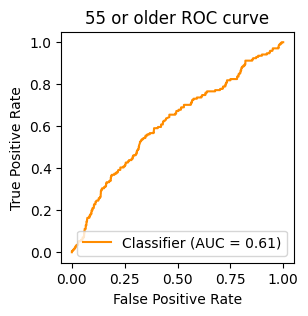

Yes
training with 5376 samples; test with 1344 samples
AUROC: 0.6323


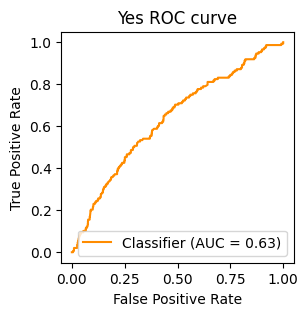

No
training with 5376 samples; test with 1344 samples
AUROC: 0.5752


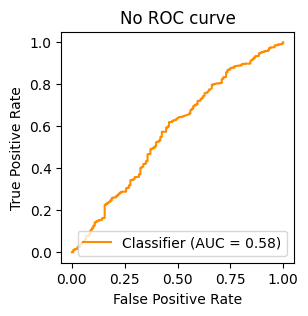

White
training with 5376 samples; test with 1344 samples
AUROC: 0.5519


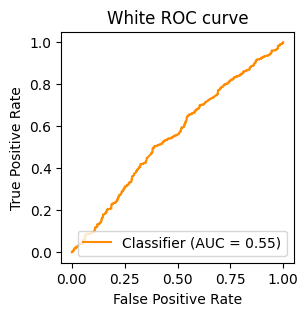

Black
training with 5376 samples; test with 1344 samples
AUROC: 0.6213


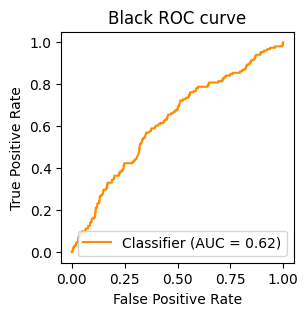

Asian
training with 5376 samples; test with 1344 samples
AUROC: 0.6958


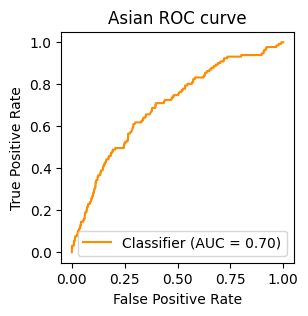

Other or mixed
training with 5376 samples; test with 1344 samples
AUROC: 0.5274


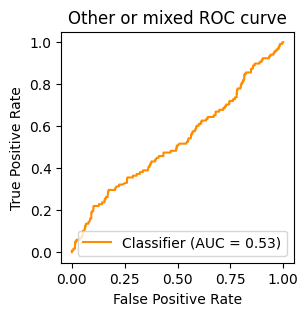

Less than $50,000
training with 5376 samples; test with 1344 samples
AUROC: 0.5547


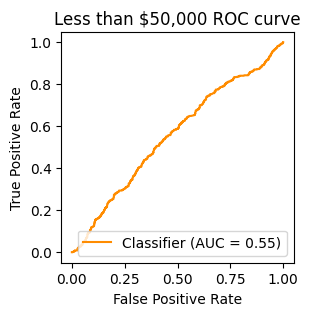

$50,000 - $99,999
training with 5376 samples; test with 1344 samples
AUROC: 0.4800


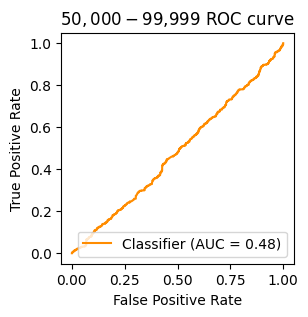

$100,000 or more
training with 5376 samples; test with 1344 samples
AUROC: 0.5761


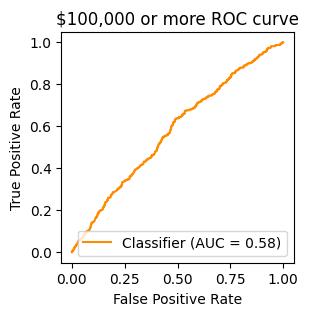


--------------------
Subsample with 0.9 of data

k=1
X shape: (7560, 1981)
Male
training with 6048 samples; test with 1512 samples
AUROC: 0.6408


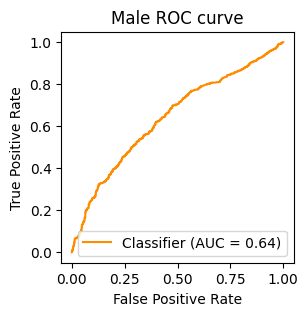

Female
training with 6048 samples; test with 1512 samples
AUROC: 0.6429


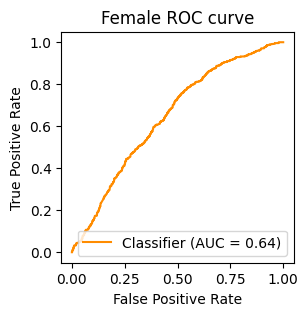

18 - 34 years
training with 6048 samples; test with 1512 samples
AUROC: 0.6184


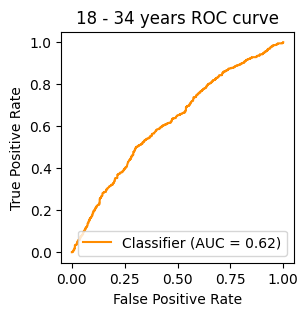

35 - 54 years
training with 6048 samples; test with 1512 samples
AUROC: 0.5217


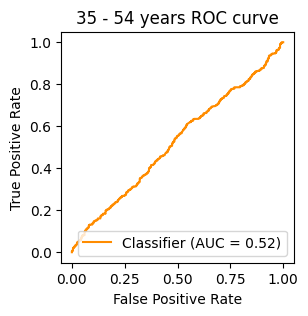

55 or older
training with 6048 samples; test with 1512 samples
AUROC: 0.6424


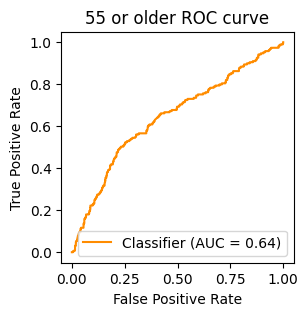

Yes
training with 6048 samples; test with 1512 samples
AUROC: 0.5844


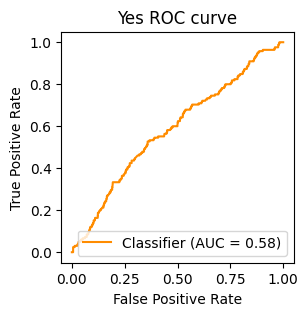

No
training with 6048 samples; test with 1512 samples
AUROC: 0.5743


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


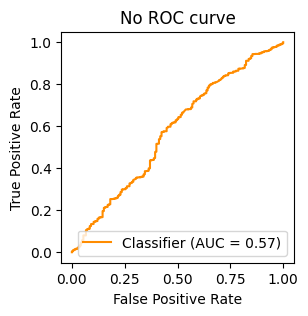

White
training with 6048 samples; test with 1512 samples
AUROC: 0.5746


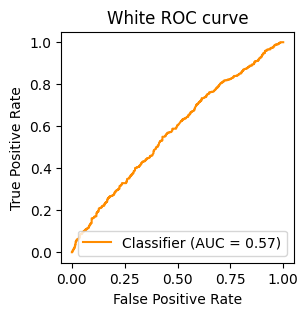

Black
training with 6048 samples; test with 1512 samples
AUROC: 0.6372


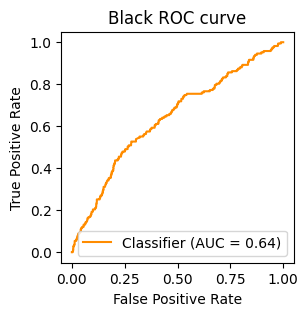

Asian
training with 6048 samples; test with 1512 samples
AUROC: 0.6581


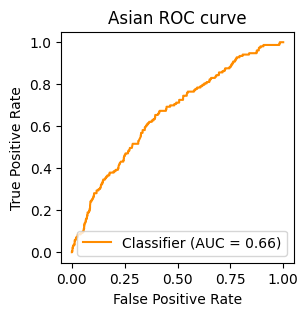

Other or mixed
training with 6048 samples; test with 1512 samples
AUROC: 0.5562


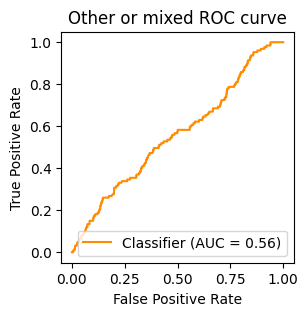

Less than $50,000
training with 6048 samples; test with 1512 samples
AUROC: 0.5486


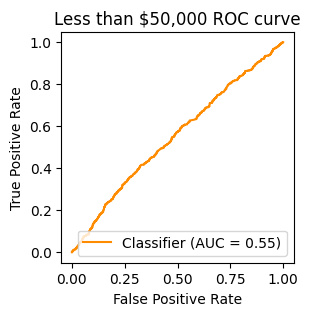

$50,000 - $99,999
training with 6048 samples; test with 1512 samples
AUROC: 0.5139


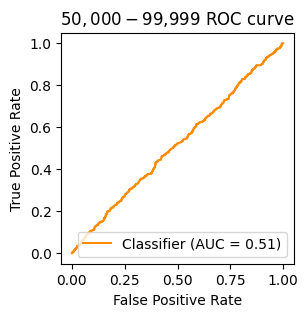

$100,000 or more
training with 6048 samples; test with 1512 samples
AUROC: 0.5657


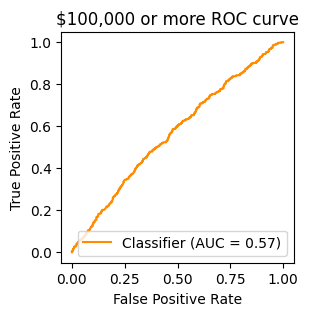


--------------------
Subsample with 1.0 of data

k=1
X shape: (8400, 2105)
Male
training with 6720 samples; test with 1680 samples
AUROC: 0.6166


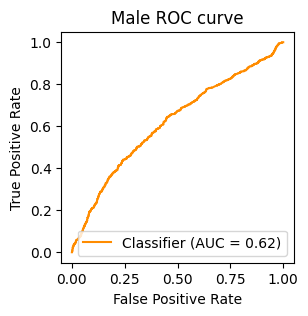

Female
training with 6720 samples; test with 1680 samples
AUROC: 0.6348


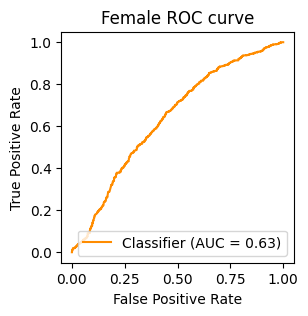

18 - 34 years
training with 6720 samples; test with 1680 samples
AUROC: 0.6275


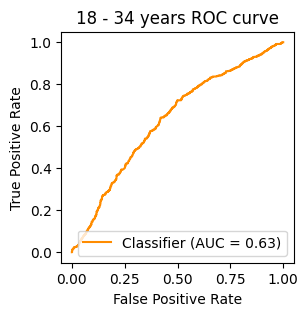

35 - 54 years
training with 6720 samples; test with 1680 samples
AUROC: 0.5411


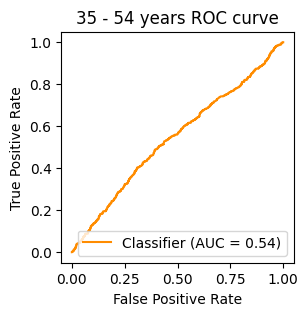

55 or older
training with 6720 samples; test with 1680 samples
AUROC: 0.5917


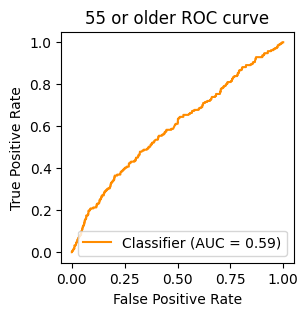

Yes
training with 6720 samples; test with 1680 samples
AUROC: 0.5926


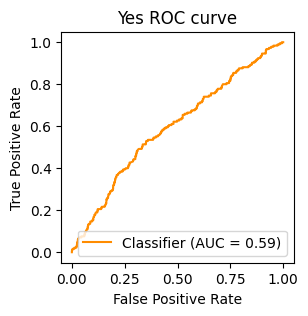

No
training with 6720 samples; test with 1680 samples
AUROC: 0.5791


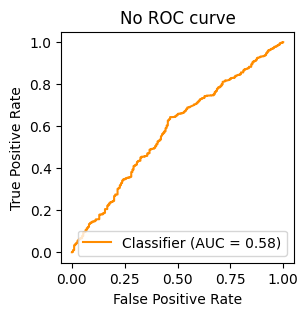

White
training with 6720 samples; test with 1680 samples
AUROC: 0.5665


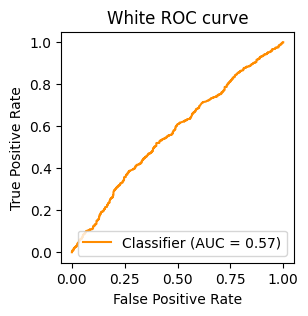

Black
training with 6720 samples; test with 1680 samples
AUROC: 0.6183


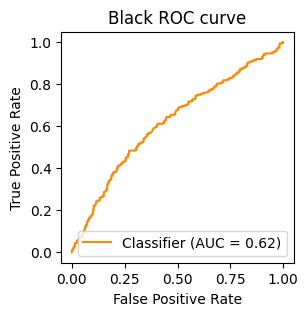

Asian
training with 6720 samples; test with 1680 samples
AUROC: 0.6244


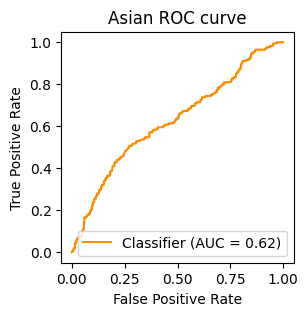

Other or mixed
training with 6720 samples; test with 1680 samples
AUROC: 0.5271


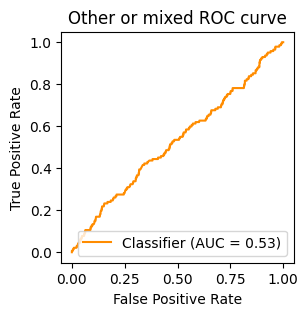

Less than $50,000
training with 6720 samples; test with 1680 samples
AUROC: 0.5700


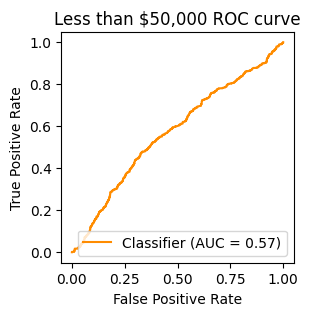

$50,000 - $99,999
training with 6720 samples; test with 1680 samples
AUROC: 0.4946


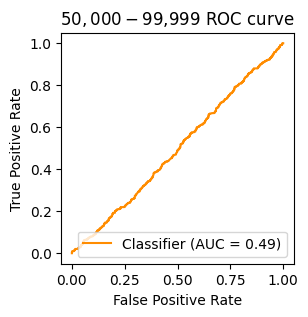

$100,000 or more
training with 6720 samples; test with 1680 samples
AUROC: 0.6177


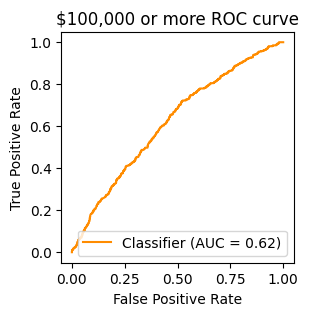


--------------------
Subsample with 0.2 of data

k=50
X shape: (1680, 52)
Male
training with 1344 samples; test with 336 samples
AUROC: 0.6709


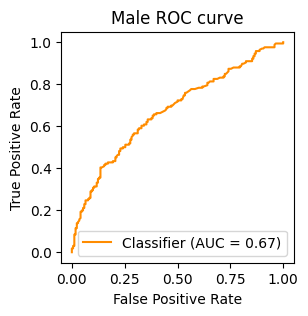

Female
training with 1344 samples; test with 336 samples
AUROC: 0.6378


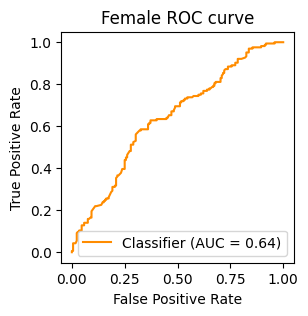

18 - 34 years
training with 1344 samples; test with 336 samples
AUROC: 0.6162


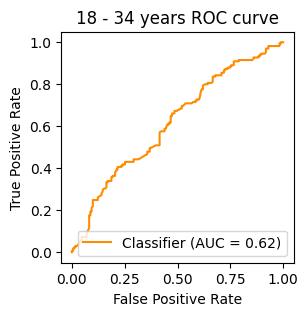

35 - 54 years
training with 1344 samples; test with 336 samples
AUROC: 0.5736


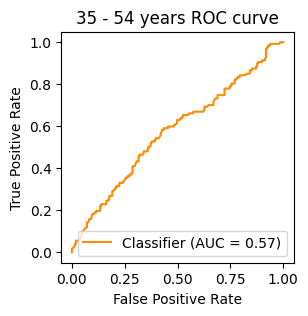

55 or older
training with 1344 samples; test with 336 samples
AUROC: 0.5930


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


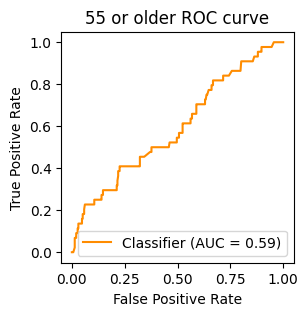

Yes
training with 1344 samples; test with 336 samples
AUROC: 0.5140


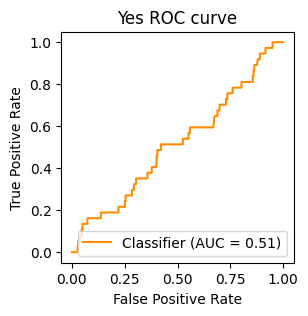

No
training with 1344 samples; test with 336 samples
AUROC: 0.6121


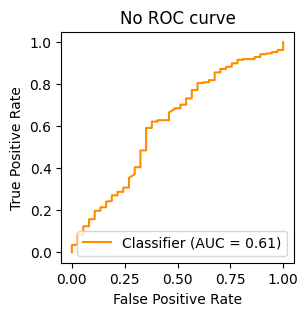

White
training with 1344 samples; test with 336 samples
AUROC: 0.5462


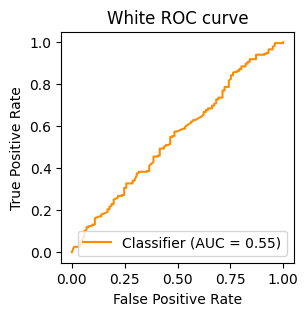

Black
training with 1344 samples; test with 336 samples
AUROC: 0.5545


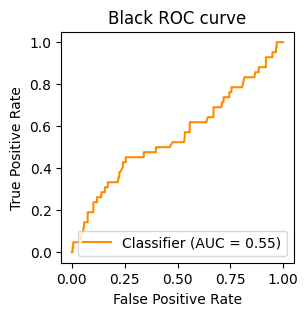

Asian
training with 1344 samples; test with 336 samples
AUROC: 0.6656


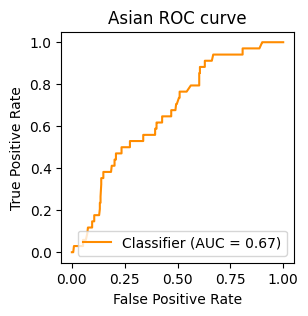

Other or mixed
training with 1344 samples; test with 336 samples
AUROC: 0.5482


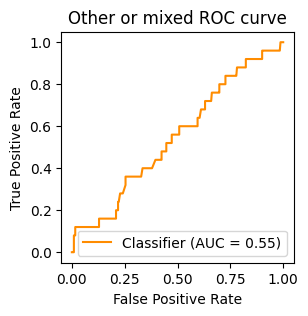

Less than $50,000
training with 1344 samples; test with 336 samples
AUROC: 0.5843


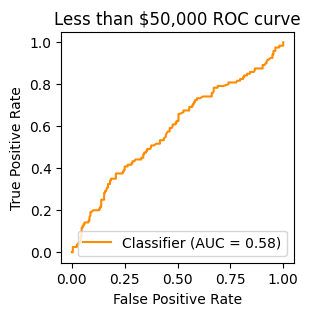

$50,000 - $99,999
training with 1344 samples; test with 336 samples
AUROC: 0.5133


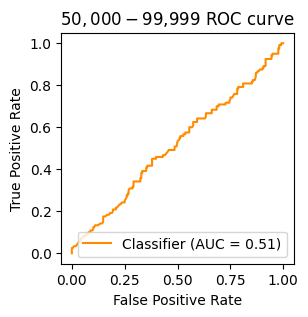

$100,000 or more
training with 1344 samples; test with 336 samples
AUROC: 0.5953


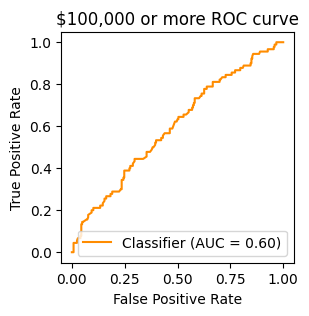


--------------------
Subsample with 0.3 of data

k=50
X shape: (2520, 63)
Male
training with 2016 samples; test with 504 samples
AUROC: 0.6625


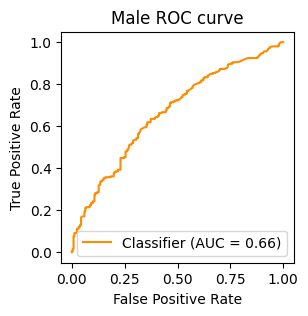

Female
training with 2016 samples; test with 504 samples
AUROC: 0.6760


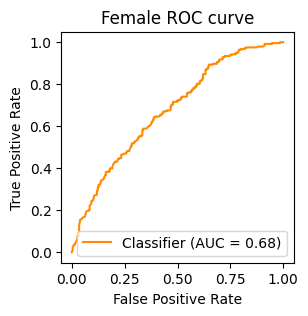

18 - 34 years
training with 2016 samples; test with 504 samples
AUROC: 0.6632


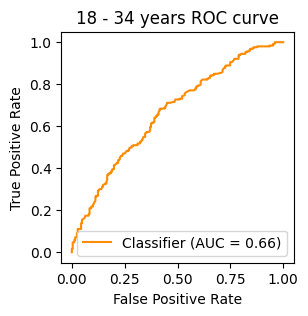

35 - 54 years
training with 2016 samples; test with 504 samples
AUROC: 0.5413


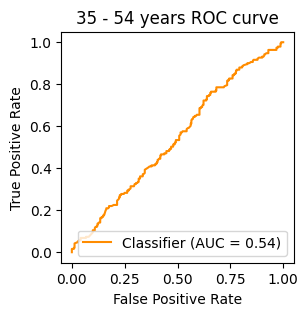

55 or older
training with 2016 samples; test with 504 samples
AUROC: 0.6695


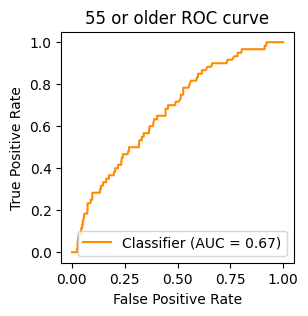

Yes
training with 2016 samples; test with 504 samples
AUROC: 0.5371


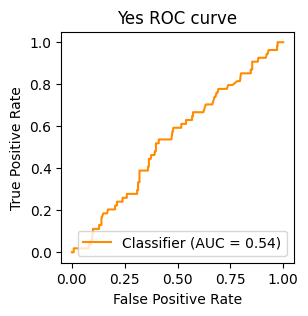

No
training with 2016 samples; test with 504 samples
AUROC: 0.5674


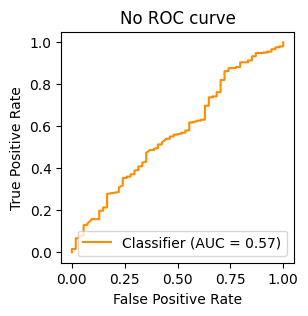

White
training with 2016 samples; test with 504 samples
AUROC: 0.5265


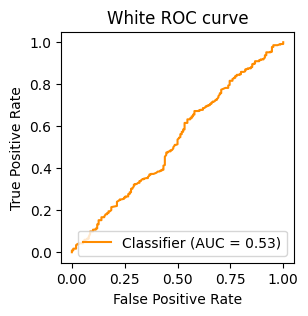

Black
training with 2016 samples; test with 504 samples
AUROC: 0.6167


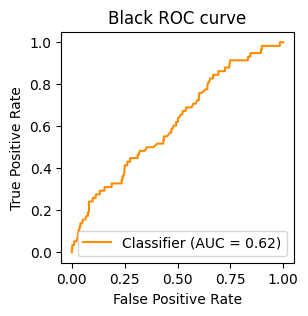

Asian
training with 2016 samples; test with 504 samples
AUROC: 0.6891


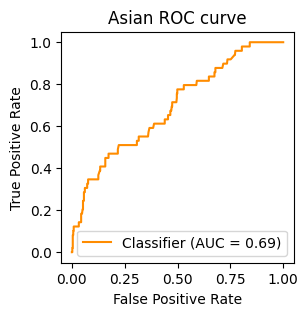

Other or mixed
training with 2016 samples; test with 504 samples
AUROC: 0.4702


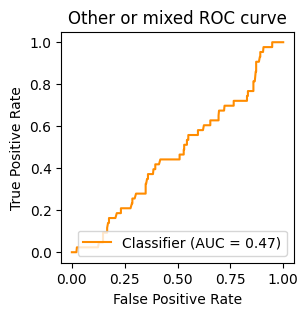

Less than $50,000
training with 2016 samples; test with 504 samples
AUROC: 0.5973


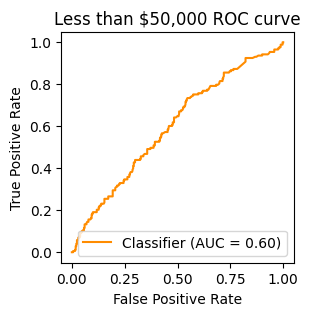

$50,000 - $99,999
training with 2016 samples; test with 504 samples
AUROC: 0.4899


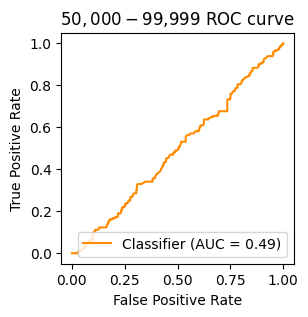

$100,000 or more
training with 2016 samples; test with 504 samples
AUROC: 0.5788


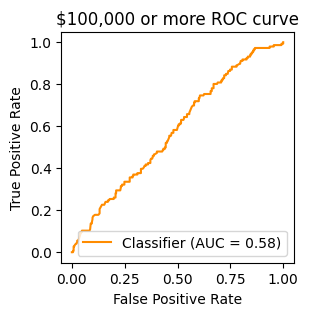


--------------------
Subsample with 0.4 of data

k=50
X shape: (3360, 72)
Male
training with 2688 samples; test with 672 samples
AUROC: 0.6601


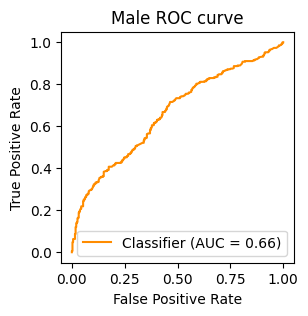

Female
training with 2688 samples; test with 672 samples
AUROC: 0.6623


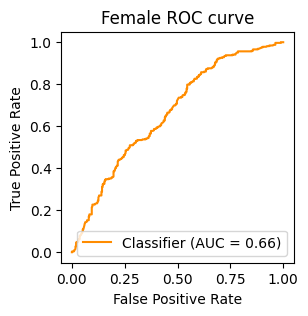

18 - 34 years
training with 2688 samples; test with 672 samples
AUROC: 0.6391


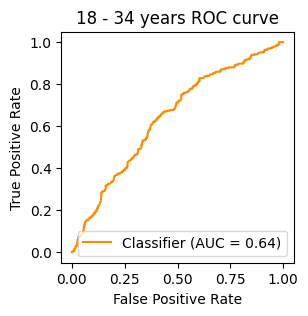

35 - 54 years
training with 2688 samples; test with 672 samples
AUROC: 0.5733


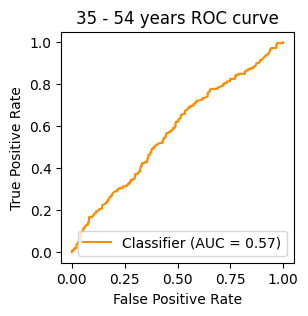

55 or older
training with 2688 samples; test with 672 samples
AUROC: 0.6778


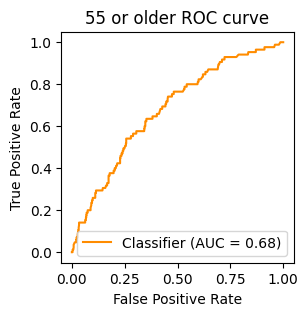

Yes
training with 2688 samples; test with 672 samples
AUROC: 0.6672


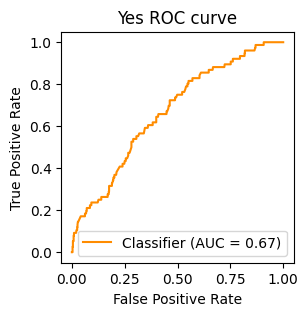

No
training with 2688 samples; test with 672 samples
AUROC: 0.6445


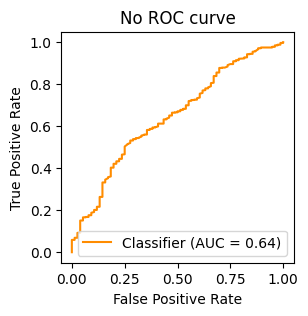

White
training with 2688 samples; test with 672 samples
AUROC: 0.5483


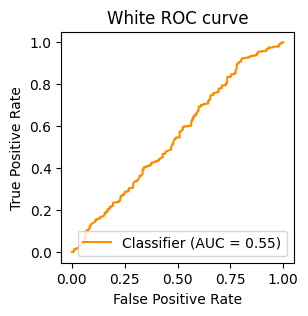

Black
training with 2688 samples; test with 672 samples
AUROC: 0.5392


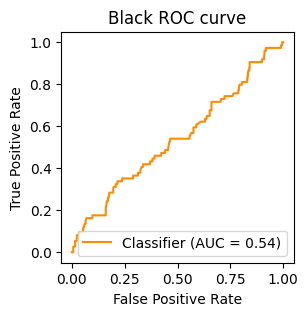

Asian
training with 2688 samples; test with 672 samples
AUROC: 0.7075


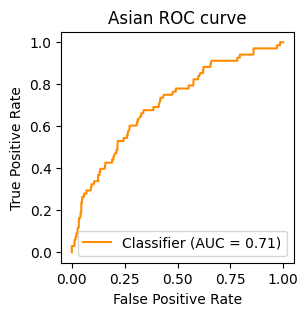

Other or mixed
training with 2688 samples; test with 672 samples
AUROC: 0.5678


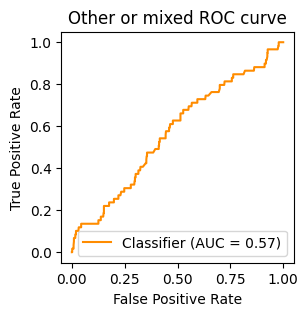

Less than $50,000
training with 2688 samples; test with 672 samples
AUROC: 0.5659


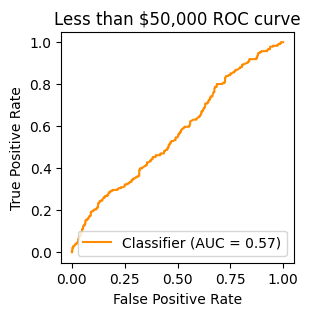

$50,000 - $99,999
training with 2688 samples; test with 672 samples
AUROC: 0.5186


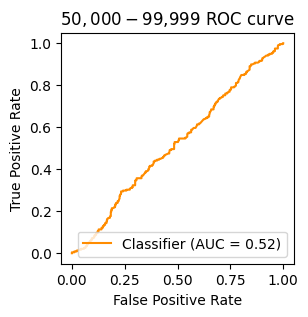

$100,000 or more
training with 2688 samples; test with 672 samples
AUROC: 0.5610


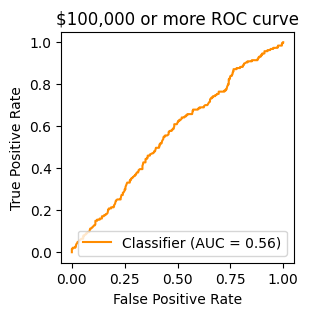


--------------------
Subsample with 0.5 of data

k=50
X shape: (4200, 85)
Male
training with 3360 samples; test with 840 samples
AUROC: 0.6521


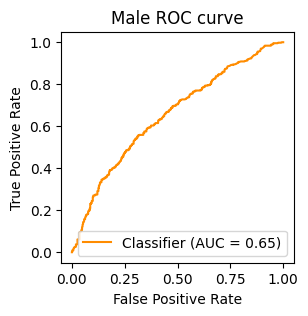

Female
training with 3360 samples; test with 840 samples
AUROC: 0.6591


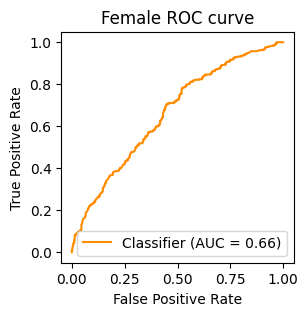

18 - 34 years
training with 3360 samples; test with 840 samples
AUROC: 0.6700


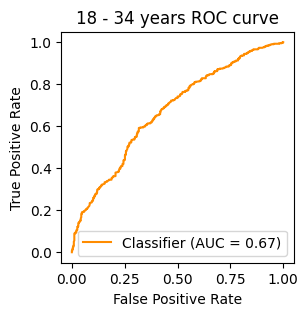

35 - 54 years
training with 3360 samples; test with 840 samples
AUROC: 0.5992


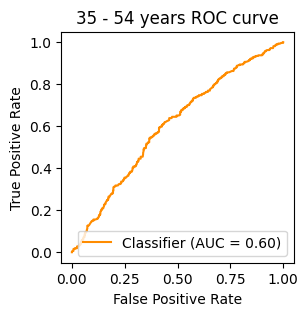

55 or older
training with 3360 samples; test with 840 samples
AUROC: 0.6216


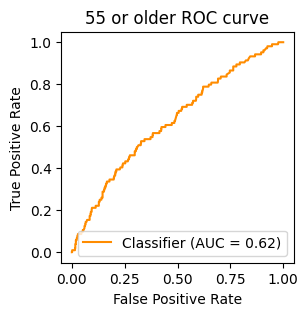

Yes
training with 3360 samples; test with 840 samples
AUROC: 0.6065


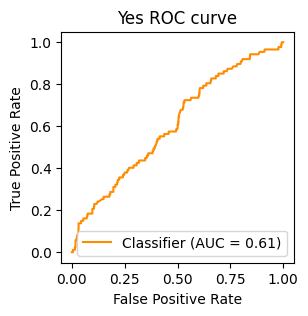

No
training with 3360 samples; test with 840 samples
AUROC: 0.5770


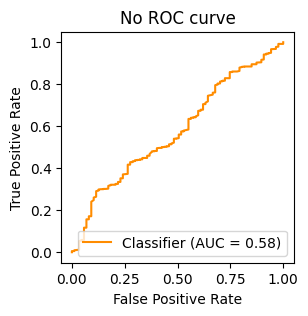

White
training with 3360 samples; test with 840 samples
AUROC: 0.5838


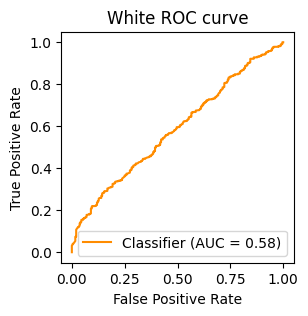

Black
training with 3360 samples; test with 840 samples
AUROC: 0.5998


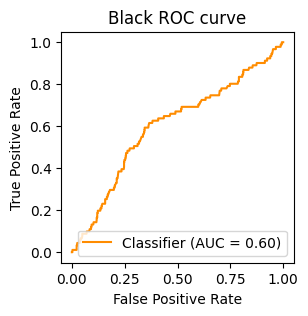

Asian
training with 3360 samples; test with 840 samples
AUROC: 0.6184


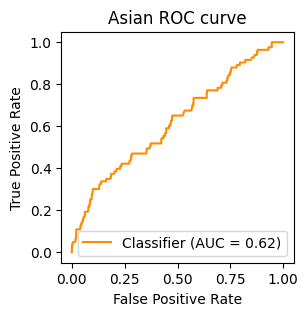

Other or mixed
training with 3360 samples; test with 840 samples
AUROC: 0.6649


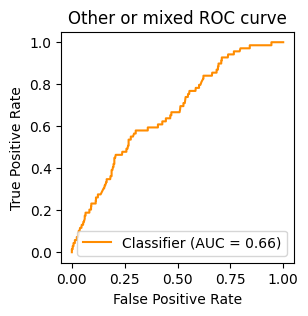

Less than $50,000
training with 3360 samples; test with 840 samples
AUROC: 0.6222


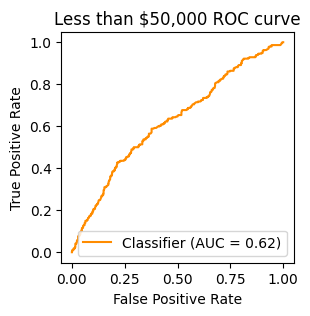

$50,000 - $99,999
training with 3360 samples; test with 840 samples
AUROC: 0.5353


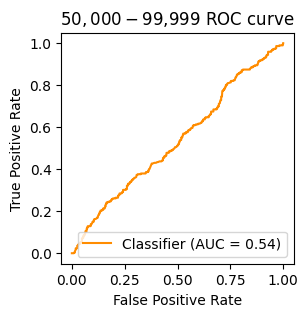

$100,000 or more
training with 3360 samples; test with 840 samples
AUROC: 0.6381


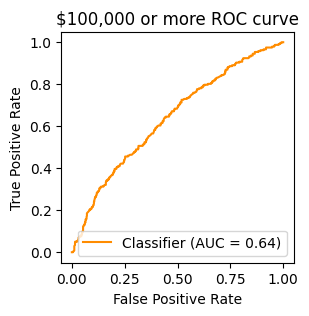


--------------------
Subsample with 0.6 of data

k=50
X shape: (5040, 96)
Male
training with 4032 samples; test with 1008 samples
AUROC: 0.6529


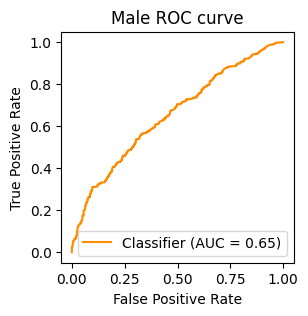

Female
training with 4032 samples; test with 1008 samples
AUROC: 0.6666


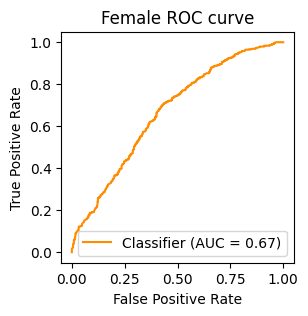

18 - 34 years
training with 4032 samples; test with 1008 samples
AUROC: 0.6346


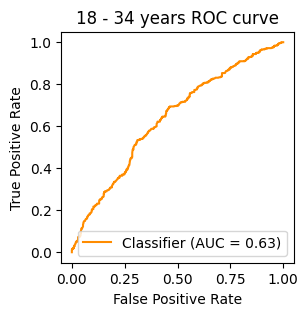

35 - 54 years
training with 4032 samples; test with 1008 samples
AUROC: 0.5465


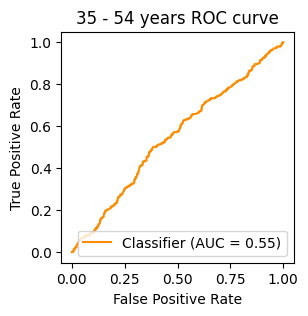

55 or older
training with 4032 samples; test with 1008 samples
AUROC: 0.6496


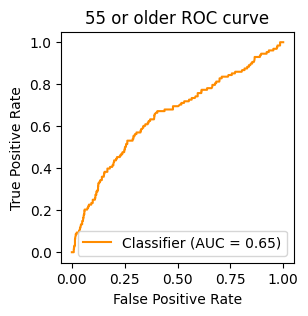

Yes
training with 4032 samples; test with 1008 samples
AUROC: 0.6326


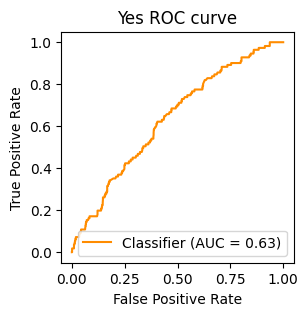

No
training with 4032 samples; test with 1008 samples
AUROC: 0.5859


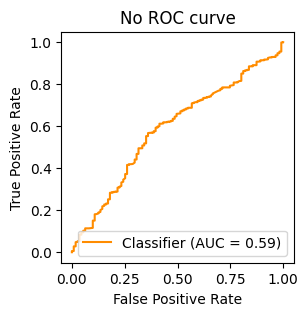

White
training with 4032 samples; test with 1008 samples
AUROC: 0.5751


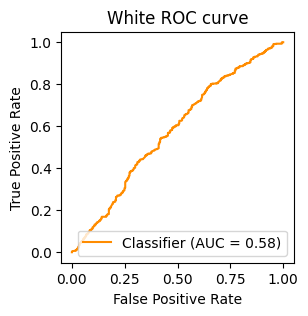

Black
training with 4032 samples; test with 1008 samples
AUROC: 0.6497


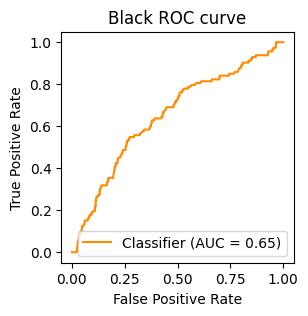

Asian
training with 4032 samples; test with 1008 samples
AUROC: 0.7048


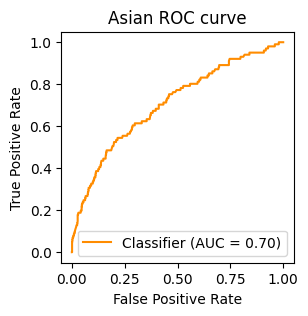

Other or mixed
training with 4032 samples; test with 1008 samples
AUROC: 0.5462


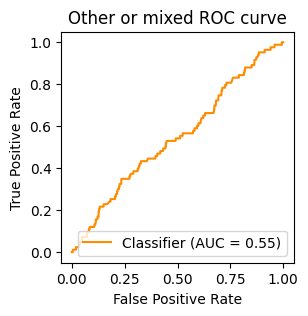

Less than $50,000
training with 4032 samples; test with 1008 samples
AUROC: 0.5789


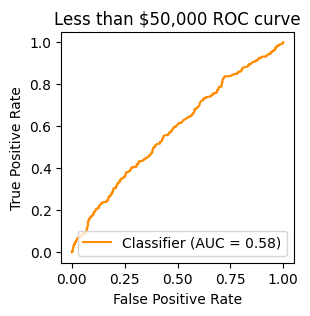

$50,000 - $99,999
training with 4032 samples; test with 1008 samples
AUROC: 0.5198


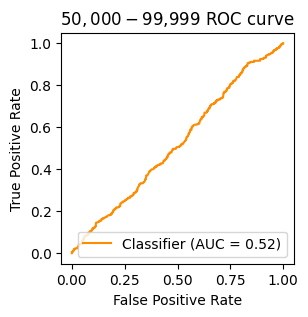

$100,000 or more
training with 4032 samples; test with 1008 samples
AUROC: 0.5812


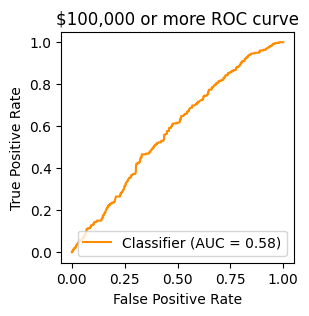


--------------------
Subsample with 0.7 of data

k=50
X shape: (5880, 105)
Male
training with 4704 samples; test with 1176 samples
AUROC: 0.6642


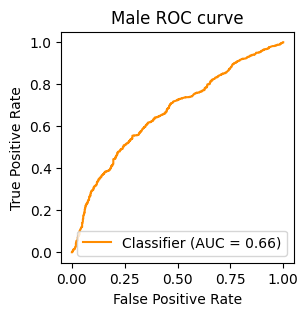

Female
training with 4704 samples; test with 1176 samples
AUROC: 0.6523


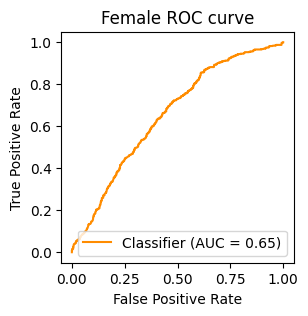

18 - 34 years
training with 4704 samples; test with 1176 samples
AUROC: 0.6406


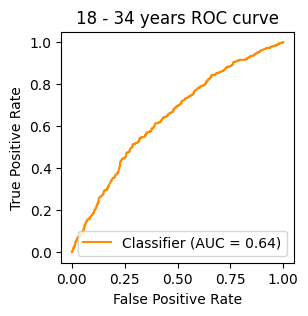

35 - 54 years
training with 4704 samples; test with 1176 samples
AUROC: 0.5733


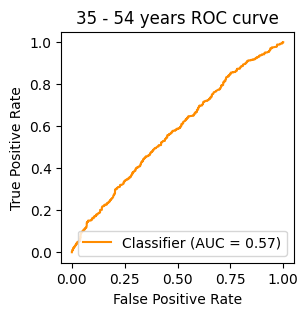

55 or older
training with 4704 samples; test with 1176 samples
AUROC: 0.6959


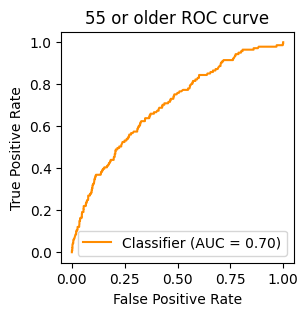

Yes
training with 4704 samples; test with 1176 samples
AUROC: 0.6092


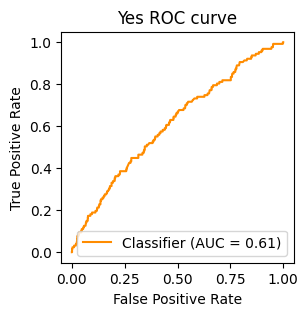

No
training with 4704 samples; test with 1176 samples
AUROC: 0.6326


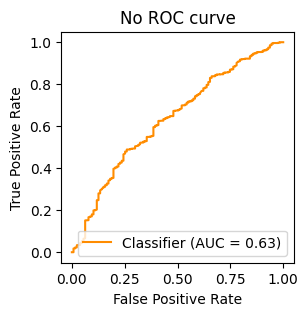

White
training with 4704 samples; test with 1176 samples
AUROC: 0.5726


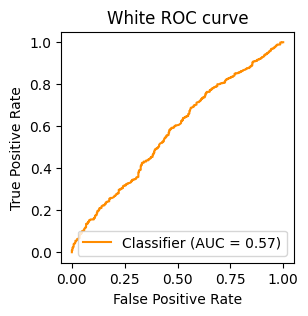

Black
training with 4704 samples; test with 1176 samples
AUROC: 0.6814


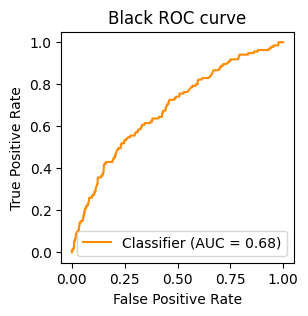

Asian
training with 4704 samples; test with 1176 samples
AUROC: 0.7339


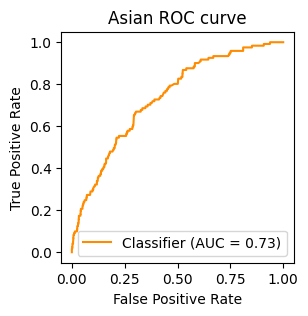

Other or mixed
training with 4704 samples; test with 1176 samples
AUROC: 0.5652


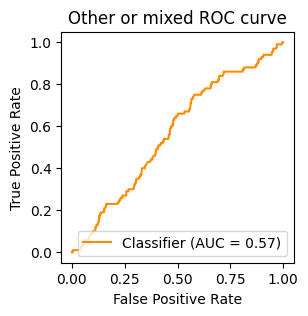

Less than $50,000
training with 4704 samples; test with 1176 samples
AUROC: 0.6234


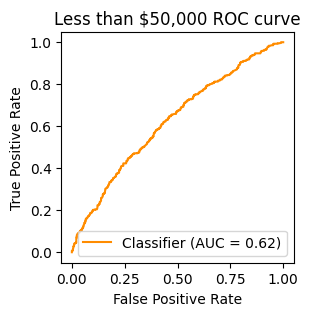

$50,000 - $99,999
training with 4704 samples; test with 1176 samples
AUROC: 0.4648


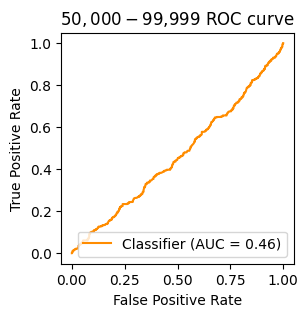

$100,000 or more
training with 4704 samples; test with 1176 samples
AUROC: 0.5952


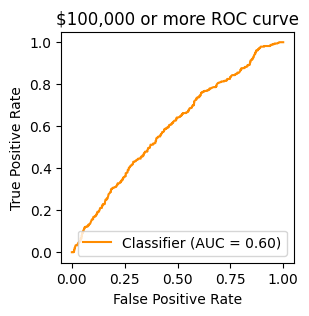


--------------------
Subsample with 0.8 of data

k=50
X shape: (6720, 112)
Male
training with 5376 samples; test with 1344 samples
AUROC: 0.6534


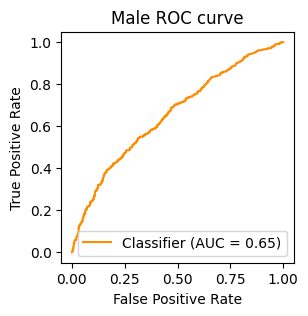

Female
training with 5376 samples; test with 1344 samples
AUROC: 0.6456


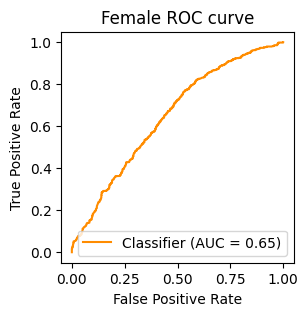

18 - 34 years
training with 5376 samples; test with 1344 samples
AUROC: 0.6260


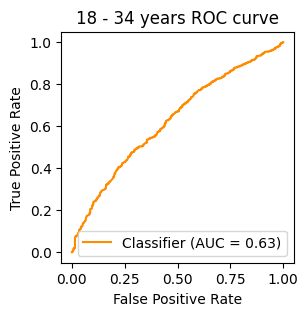

35 - 54 years
training with 5376 samples; test with 1344 samples
AUROC: 0.5819


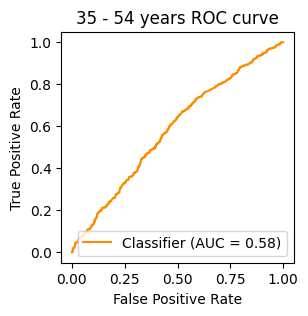

55 or older
training with 5376 samples; test with 1344 samples
AUROC: 0.6612


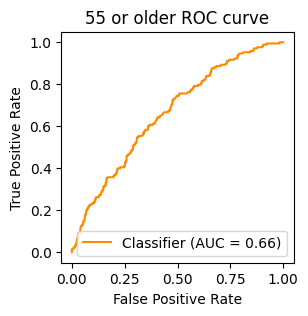

Yes
training with 5376 samples; test with 1344 samples
AUROC: 0.5927


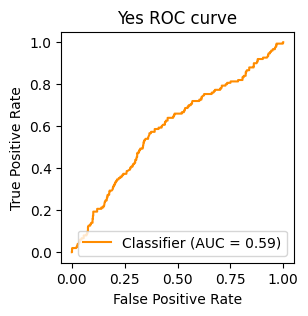

No
training with 5376 samples; test with 1344 samples
AUROC: 0.5747


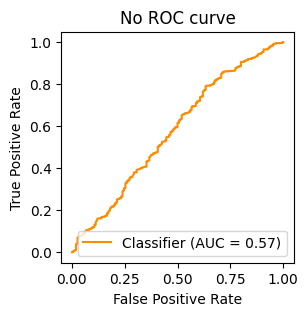

White
training with 5376 samples; test with 1344 samples
AUROC: 0.5778


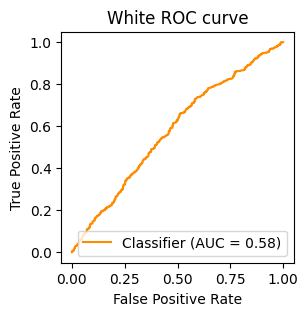

Black
training with 5376 samples; test with 1344 samples
AUROC: 0.6538


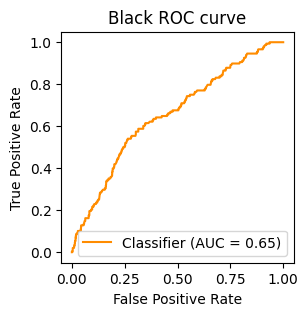

Asian
training with 5376 samples; test with 1344 samples
AUROC: 0.7139


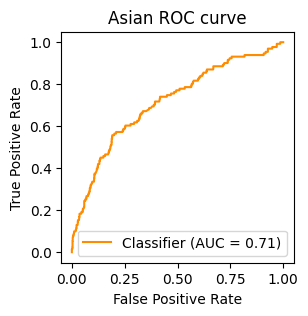

Other or mixed
training with 5376 samples; test with 1344 samples
AUROC: 0.6029


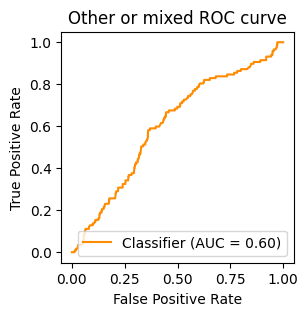

Less than $50,000
training with 5376 samples; test with 1344 samples
AUROC: 0.6034


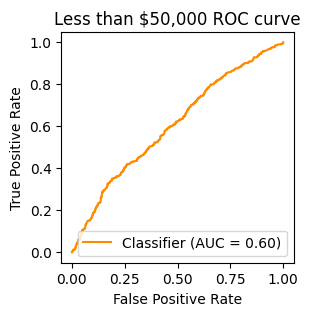

$50,000 - $99,999
training with 5376 samples; test with 1344 samples
AUROC: 0.4870


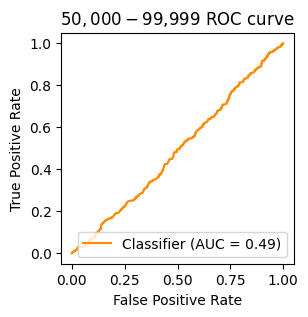

$100,000 or more
training with 5376 samples; test with 1344 samples
AUROC: 0.6099


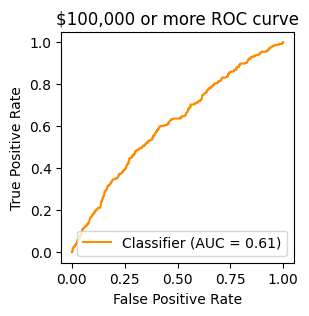


--------------------
Subsample with 0.9 of data

k=50
X shape: (7560, 121)
Male
training with 6048 samples; test with 1512 samples
AUROC: 0.6347


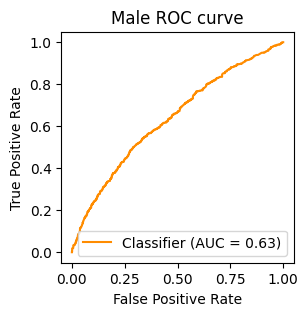

Female
training with 6048 samples; test with 1512 samples
AUROC: 0.6614


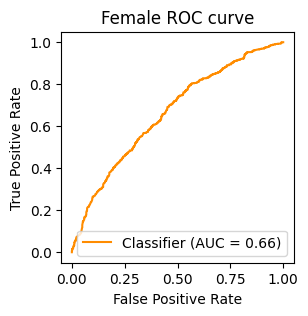

18 - 34 years
training with 6048 samples; test with 1512 samples
AUROC: 0.6302


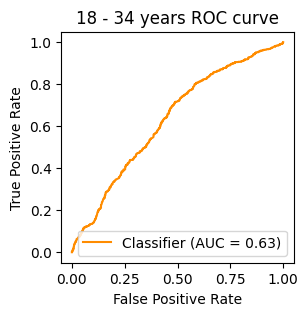

35 - 54 years
training with 6048 samples; test with 1512 samples
AUROC: 0.5923


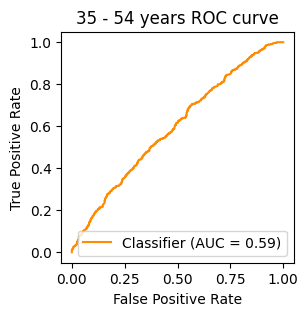

55 or older
training with 6048 samples; test with 1512 samples
AUROC: 0.6448


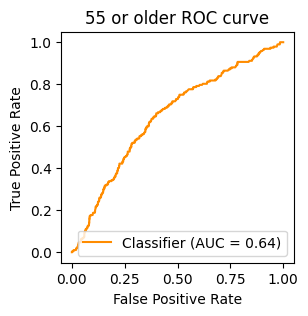

Yes
training with 6048 samples; test with 1512 samples
AUROC: 0.5665


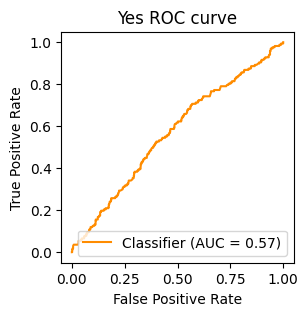

No
training with 6048 samples; test with 1512 samples
AUROC: 0.5986


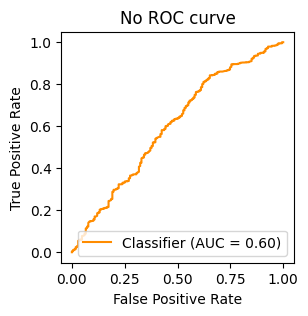

White
training with 6048 samples; test with 1512 samples
AUROC: 0.5598


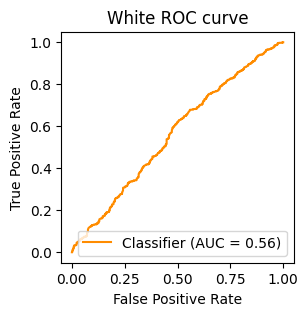

Black
training with 6048 samples; test with 1512 samples
AUROC: 0.6973


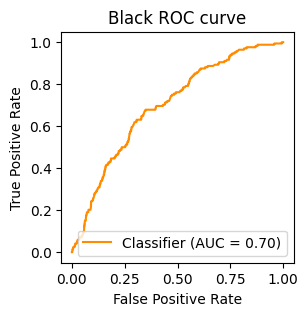

Asian
training with 6048 samples; test with 1512 samples
AUROC: 0.7027


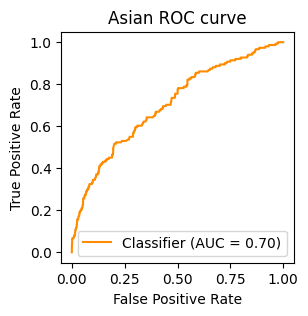

Other or mixed
training with 6048 samples; test with 1512 samples
AUROC: 0.5659


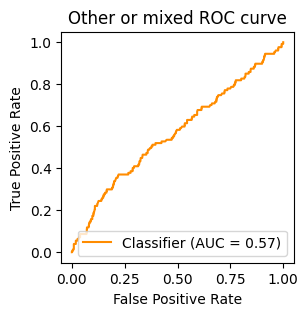

Less than $50,000
training with 6048 samples; test with 1512 samples
AUROC: 0.6209


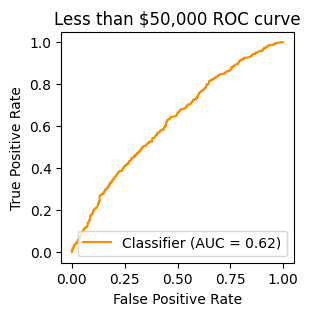

$50,000 - $99,999
training with 6048 samples; test with 1512 samples
AUROC: 0.5082


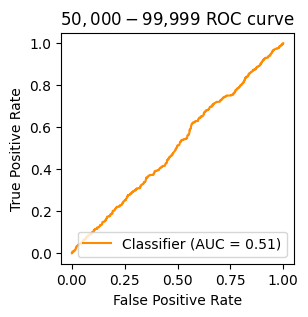

$100,000 or more
training with 6048 samples; test with 1512 samples
AUROC: 0.6147


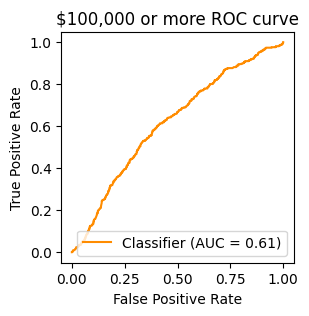


--------------------
Subsample with 1.0 of data

k=50
X shape: (8400, 135)
Male
training with 6720 samples; test with 1680 samples
AUROC: 0.6695


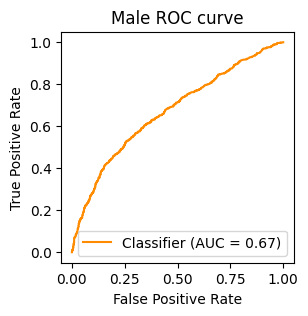

Female
training with 6720 samples; test with 1680 samples
AUROC: 0.6667


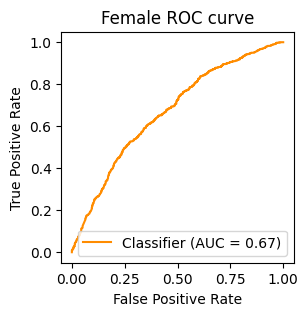

18 - 34 years
training with 6720 samples; test with 1680 samples
AUROC: 0.6452


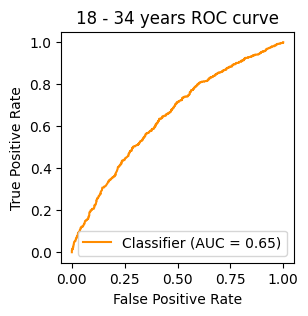

35 - 54 years
training with 6720 samples; test with 1680 samples
AUROC: 0.5687


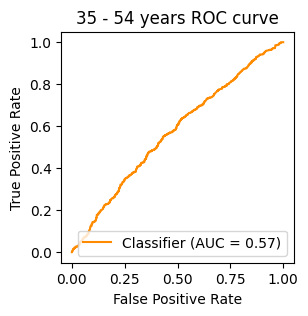

55 or older
training with 6720 samples; test with 1680 samples
AUROC: 0.6347


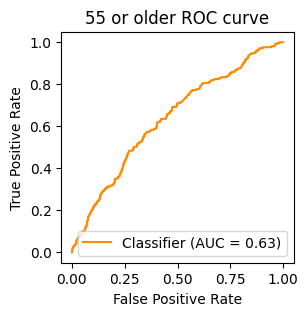

Yes
training with 6720 samples; test with 1680 samples
AUROC: 0.6071


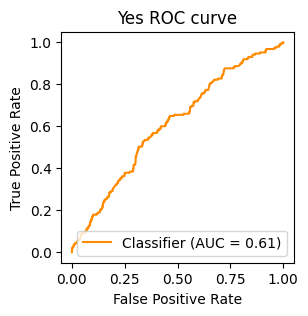

No
training with 6720 samples; test with 1680 samples
AUROC: 0.5979


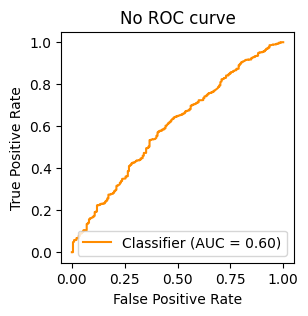

White
training with 6720 samples; test with 1680 samples
AUROC: 0.5671


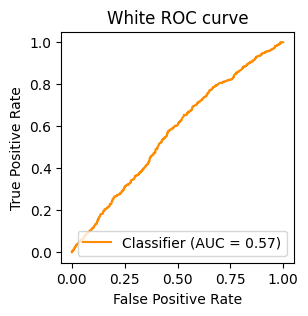

Black
training with 6720 samples; test with 1680 samples
AUROC: 0.6700


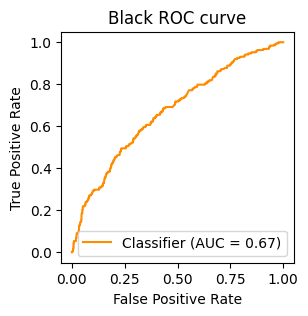

Asian
training with 6720 samples; test with 1680 samples
AUROC: 0.7142


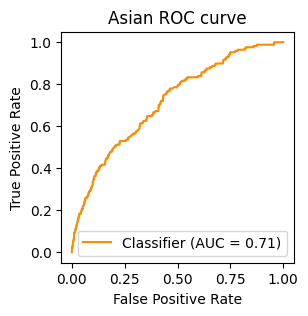

Other or mixed
training with 6720 samples; test with 1680 samples
AUROC: 0.5779


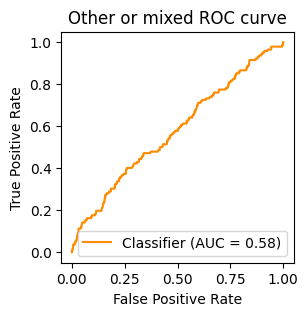

Less than $50,000
training with 6720 samples; test with 1680 samples
AUROC: 0.6114


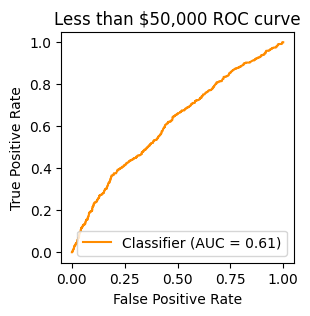

$50,000 - $99,999
training with 6720 samples; test with 1680 samples
AUROC: 0.5087


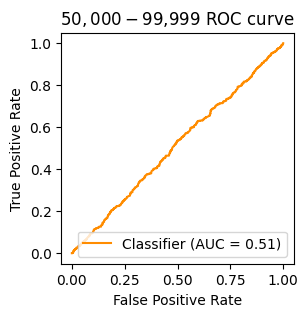

$100,000 or more
training with 6720 samples; test with 1680 samples
AUROC: 0.5880


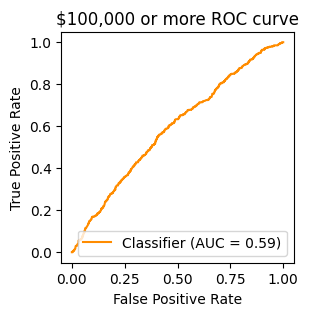


--------------------
Subsample with 0.2 of data

k=100
X shape: (1680, 39)
Male
training with 1344 samples; test with 336 samples
AUROC: 0.6715


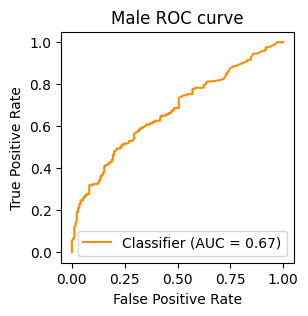

Female
training with 1344 samples; test with 336 samples
AUROC: 0.6534


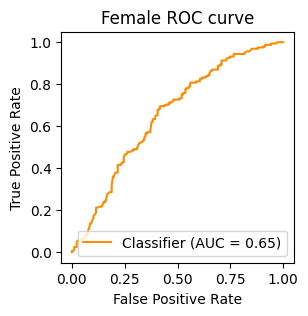

18 - 34 years
training with 1344 samples; test with 336 samples
AUROC: 0.6348


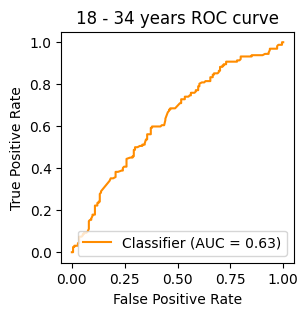

35 - 54 years
training with 1344 samples; test with 336 samples
AUROC: 0.5710


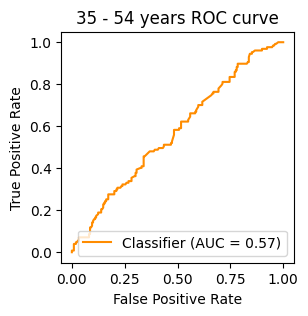

55 or older
training with 1344 samples; test with 336 samples
AUROC: 0.6387


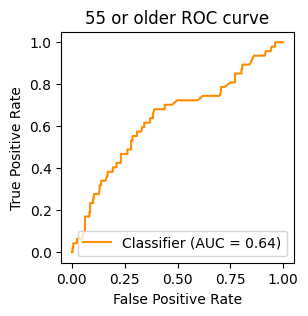

Yes
training with 1344 samples; test with 336 samples
AUROC: 0.5551


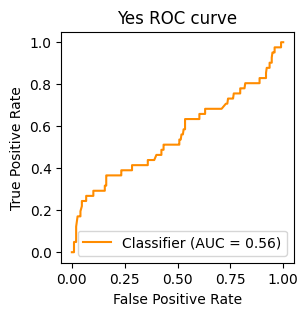

No
training with 1344 samples; test with 336 samples
AUROC: 0.5761


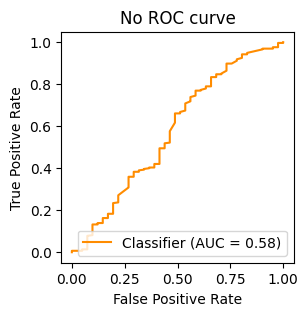

White
training with 1344 samples; test with 336 samples
AUROC: 0.5418


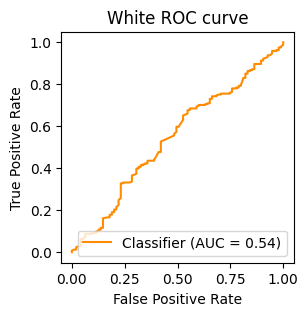

Black
training with 1344 samples; test with 336 samples
AUROC: 0.6627


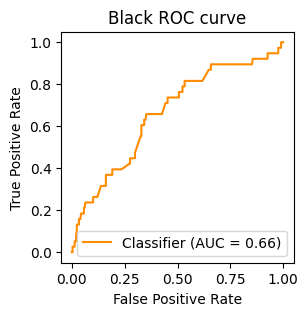

Asian
training with 1344 samples; test with 336 samples
AUROC: 0.6099


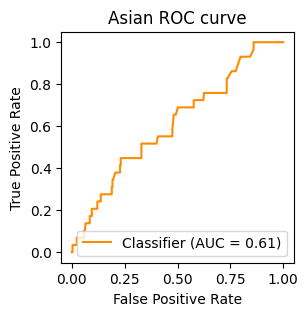

Other or mixed
training with 1344 samples; test with 336 samples
AUROC: 0.5790


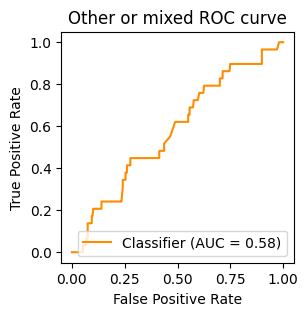

Less than $50,000
training with 1344 samples; test with 336 samples
AUROC: 0.5577


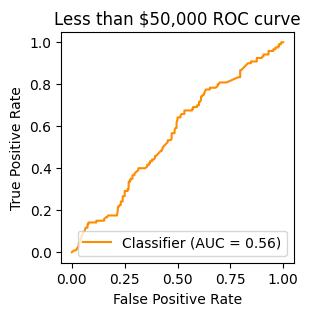

$50,000 - $99,999
training with 1344 samples; test with 336 samples
AUROC: 0.4964


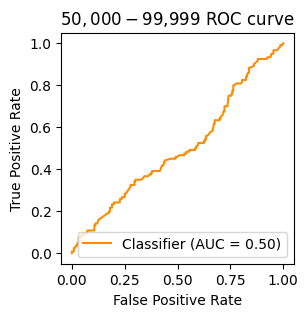

$100,000 or more
training with 1344 samples; test with 336 samples
AUROC: 0.5599


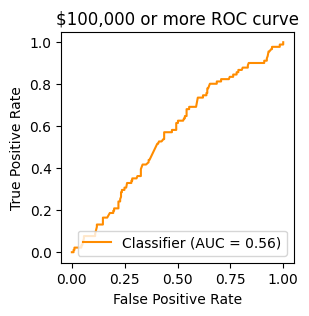


--------------------
Subsample with 0.3 of data

k=100
X shape: (2520, 47)
Male
training with 2016 samples; test with 504 samples
AUROC: 0.6497


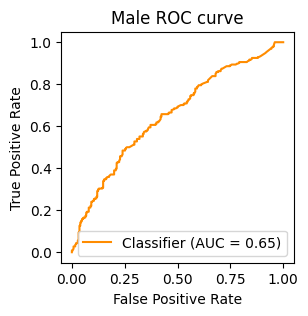

Female
training with 2016 samples; test with 504 samples
AUROC: 0.6892


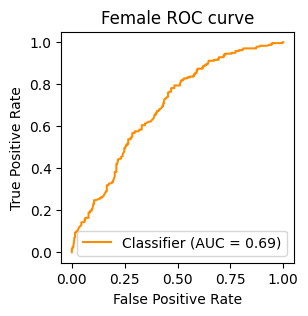

18 - 34 years
training with 2016 samples; test with 504 samples
AUROC: 0.6427


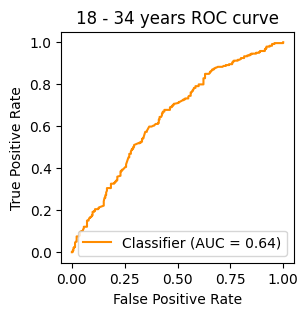

35 - 54 years
training with 2016 samples; test with 504 samples
AUROC: 0.5766


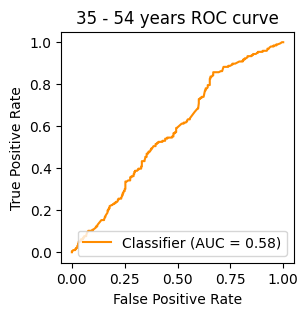

55 or older
training with 2016 samples; test with 504 samples
AUROC: 0.6544


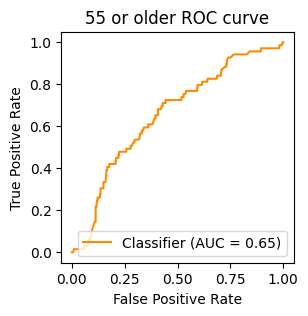

Yes
training with 2016 samples; test with 504 samples
AUROC: 0.6345


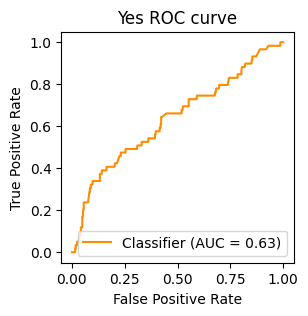

No
training with 2016 samples; test with 504 samples
AUROC: 0.5949


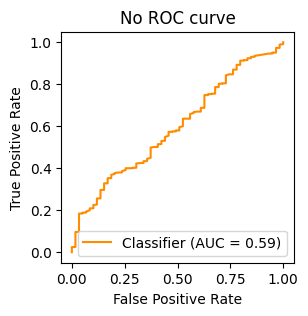

White
training with 2016 samples; test with 504 samples
AUROC: 0.5839


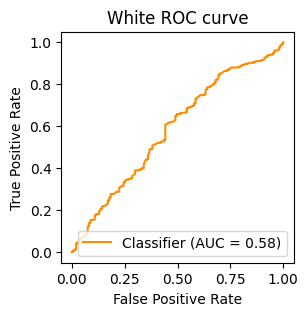

Black
training with 2016 samples; test with 504 samples
AUROC: 0.5862


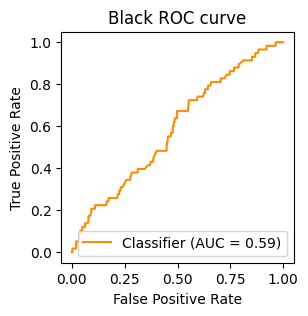

Asian
training with 2016 samples; test with 504 samples
AUROC: 0.6750


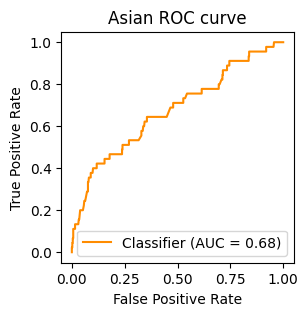

Other or mixed
training with 2016 samples; test with 504 samples
AUROC: 0.5243


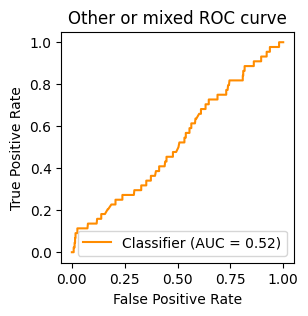

Less than $50,000
training with 2016 samples; test with 504 samples
AUROC: 0.6102


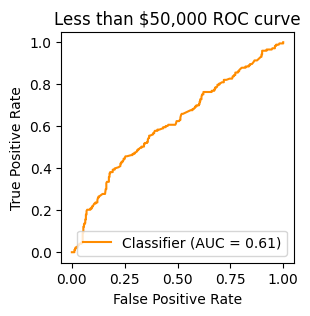

$50,000 - $99,999
training with 2016 samples; test with 504 samples
AUROC: 0.5032


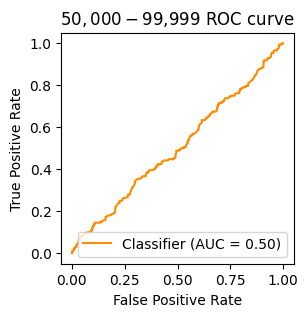

$100,000 or more
training with 2016 samples; test with 504 samples
AUROC: 0.6219


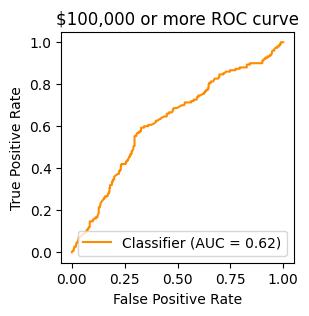


--------------------
Subsample with 0.4 of data

k=100
X shape: (3360, 53)
Male
training with 2688 samples; test with 672 samples
AUROC: 0.6628


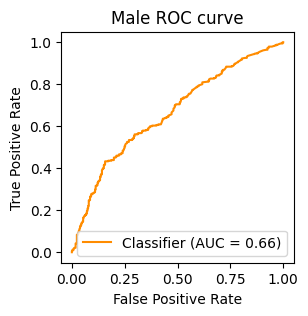

Female
training with 2688 samples; test with 672 samples
AUROC: 0.6366


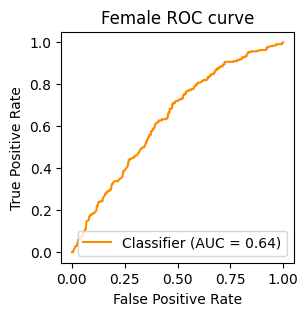

18 - 34 years
training with 2688 samples; test with 672 samples
AUROC: 0.6442


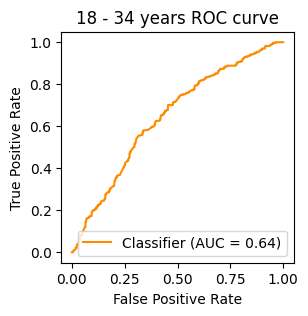

35 - 54 years
training with 2688 samples; test with 672 samples
AUROC: 0.5931


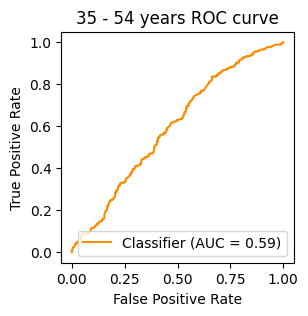

55 or older
training with 2688 samples; test with 672 samples
AUROC: 0.6526


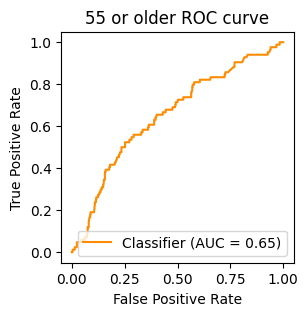

Yes
training with 2688 samples; test with 672 samples
AUROC: 0.5511


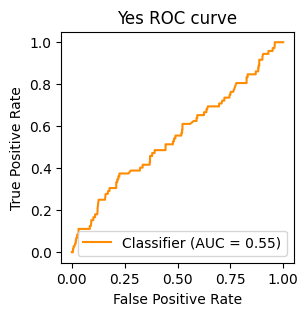

No
training with 2688 samples; test with 672 samples
AUROC: 0.6228


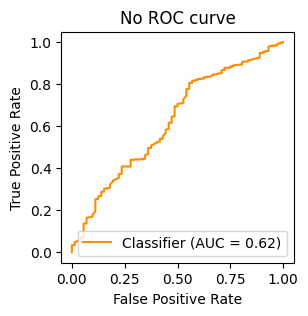

White
training with 2688 samples; test with 672 samples
AUROC: 0.5706


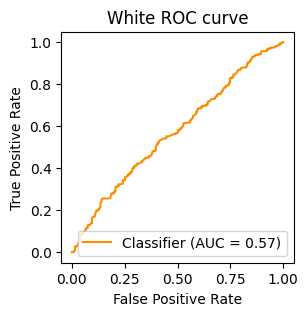

Black
training with 2688 samples; test with 672 samples
AUROC: 0.6407


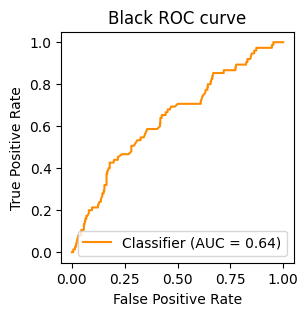

Asian
training with 2688 samples; test with 672 samples
AUROC: 0.6398


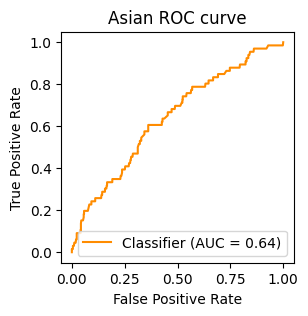

Other or mixed
training with 2688 samples; test with 672 samples
AUROC: 0.5625


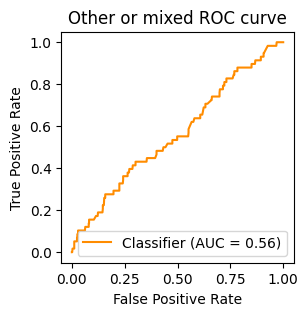

Less than $50,000
training with 2688 samples; test with 672 samples
AUROC: 0.6109


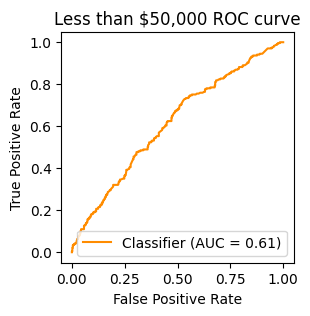

$50,000 - $99,999
training with 2688 samples; test with 672 samples
AUROC: 0.5288


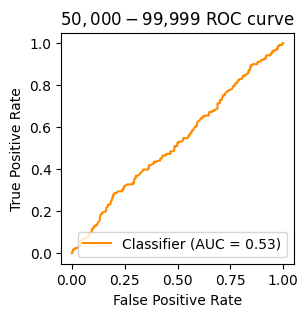

$100,000 or more
training with 2688 samples; test with 672 samples
AUROC: 0.5456


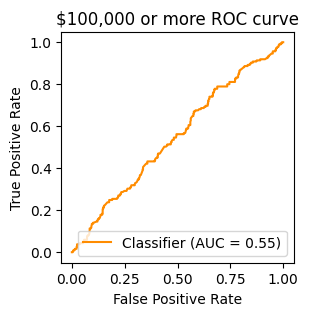


--------------------
Subsample with 0.5 of data

k=100
X shape: (4200, 58)
Male
training with 3360 samples; test with 840 samples
AUROC: 0.6628


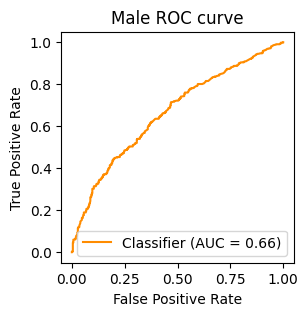

Female
training with 3360 samples; test with 840 samples
AUROC: 0.6830


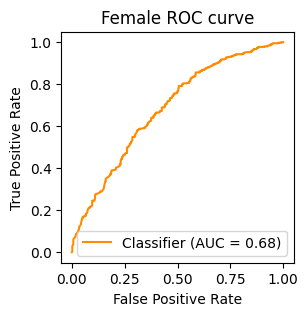

18 - 34 years
training with 3360 samples; test with 840 samples
AUROC: 0.6555


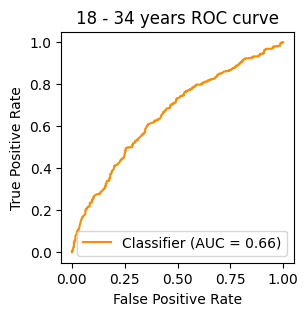

35 - 54 years
training with 3360 samples; test with 840 samples
AUROC: 0.6021


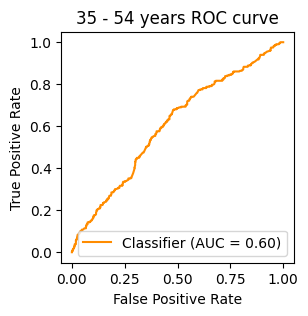

55 or older
training with 3360 samples; test with 840 samples
AUROC: 0.6561


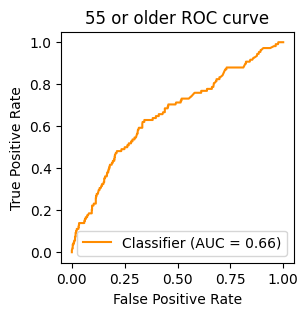

Yes
training with 3360 samples; test with 840 samples
AUROC: 0.5572


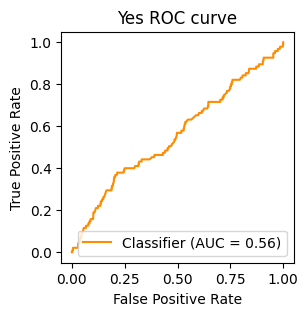

No
training with 3360 samples; test with 840 samples
AUROC: 0.5885


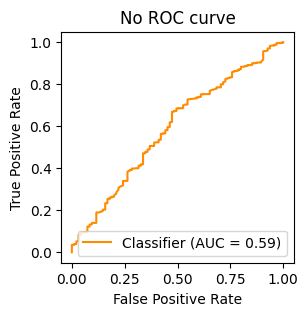

White
training with 3360 samples; test with 840 samples
AUROC: 0.5934


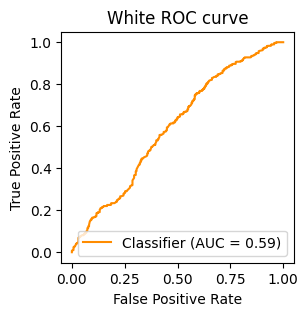

Black
training with 3360 samples; test with 840 samples
AUROC: 0.6345


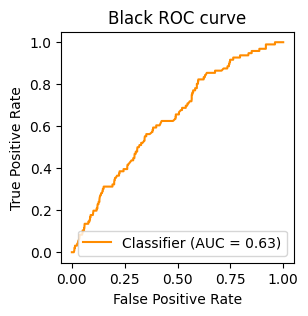

Asian
training with 3360 samples; test with 840 samples
AUROC: 0.7506


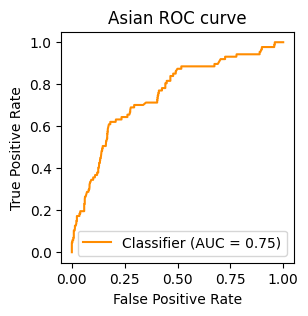

Other or mixed
training with 3360 samples; test with 840 samples
AUROC: 0.5835


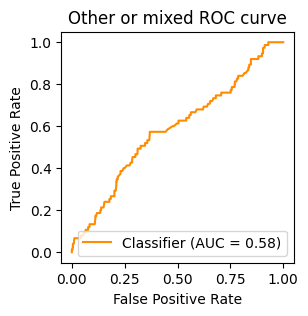

Less than $50,000
training with 3360 samples; test with 840 samples
AUROC: 0.5783


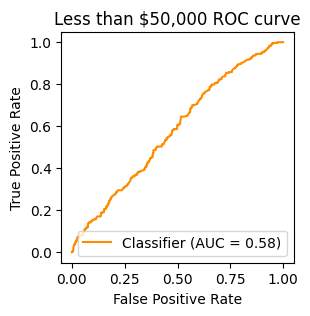

$50,000 - $99,999
training with 3360 samples; test with 840 samples
AUROC: 0.4878


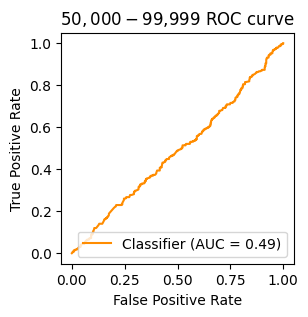

$100,000 or more
training with 3360 samples; test with 840 samples
AUROC: 0.5768


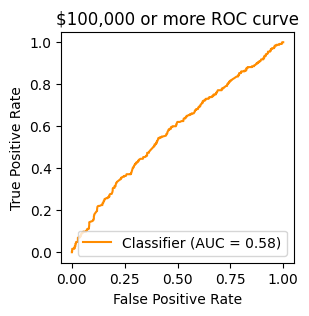


--------------------
Subsample with 0.6 of data

k=100
X shape: (5040, 60)
Male
training with 4032 samples; test with 1008 samples
AUROC: 0.6553


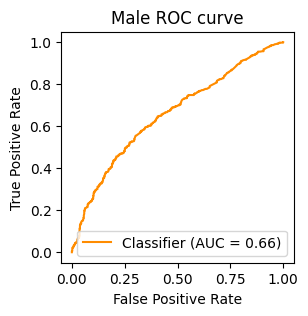

Female
training with 4032 samples; test with 1008 samples
AUROC: 0.6750


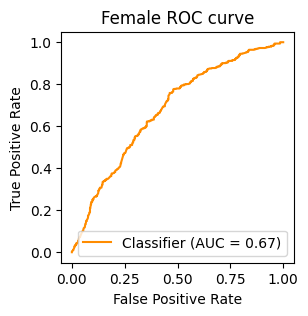

18 - 34 years
training with 4032 samples; test with 1008 samples
AUROC: 0.6475


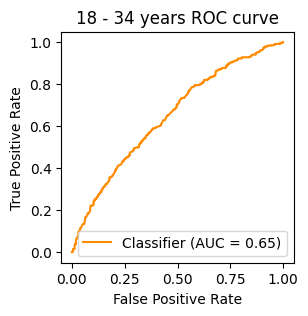

35 - 54 years
training with 4032 samples; test with 1008 samples
AUROC: 0.6028


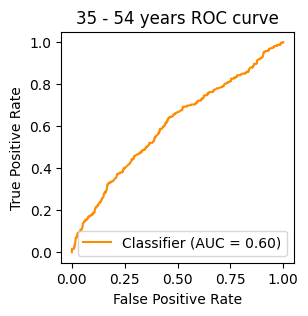

55 or older
training with 4032 samples; test with 1008 samples
AUROC: 0.6704


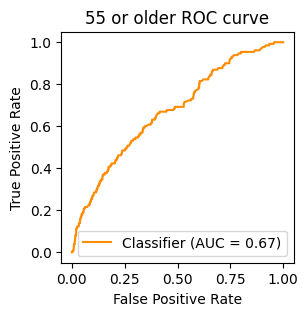

Yes
training with 4032 samples; test with 1008 samples
AUROC: 0.5665


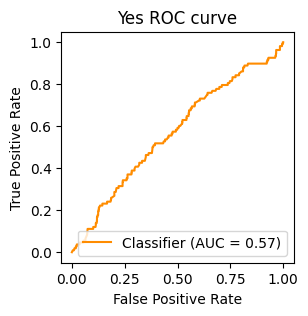

No
training with 4032 samples; test with 1008 samples
AUROC: 0.5611


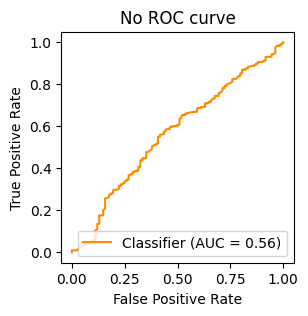

White
training with 4032 samples; test with 1008 samples
AUROC: 0.5694


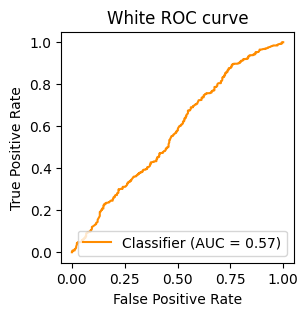

Black
training with 4032 samples; test with 1008 samples
AUROC: 0.6590


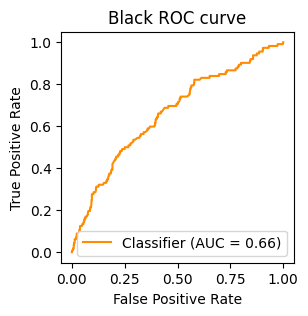

Asian
training with 4032 samples; test with 1008 samples
AUROC: 0.7186


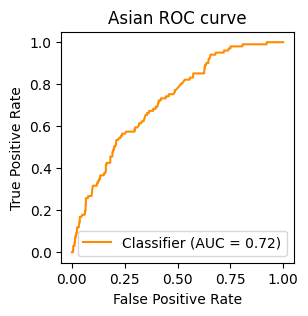

Other or mixed
training with 4032 samples; test with 1008 samples
AUROC: 0.5398


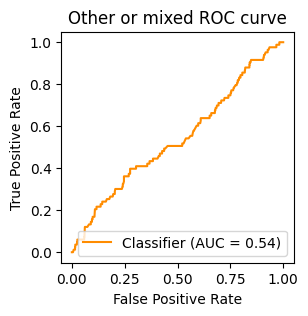

Less than $50,000
training with 4032 samples; test with 1008 samples
AUROC: 0.5924


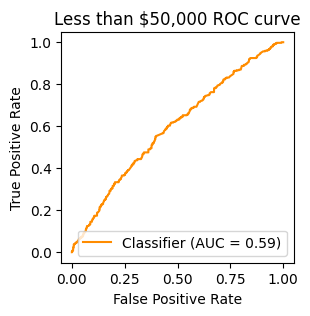

$50,000 - $99,999
training with 4032 samples; test with 1008 samples
AUROC: 0.5122


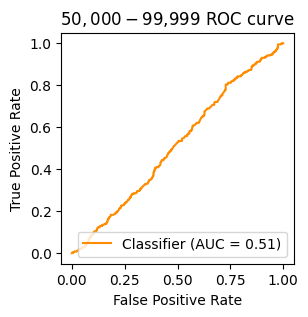

$100,000 or more
training with 4032 samples; test with 1008 samples
AUROC: 0.5870


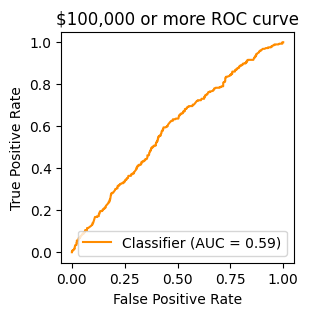


--------------------
Subsample with 0.7 of data

k=100
X shape: (5880, 65)
Male
training with 4704 samples; test with 1176 samples
AUROC: 0.6620


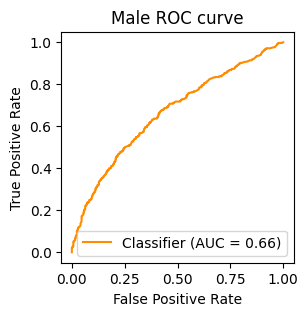

Female
training with 4704 samples; test with 1176 samples
AUROC: 0.6610


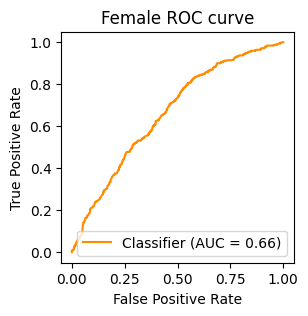

18 - 34 years
training with 4704 samples; test with 1176 samples
AUROC: 0.6511


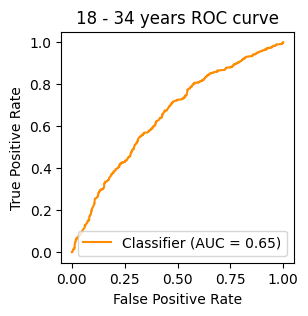

35 - 54 years
training with 4704 samples; test with 1176 samples
AUROC: 0.5874


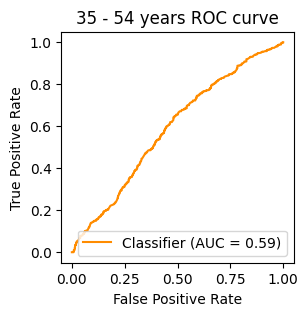

55 or older
training with 4704 samples; test with 1176 samples
AUROC: 0.6194


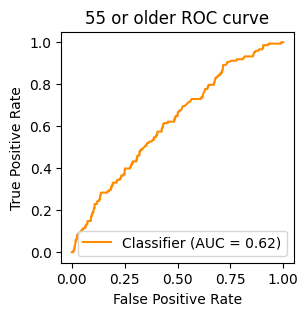

Yes
training with 4704 samples; test with 1176 samples
AUROC: 0.6163


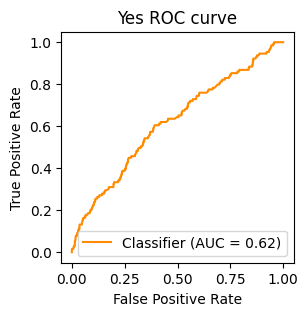

No
training with 4704 samples; test with 1176 samples
AUROC: 0.5976


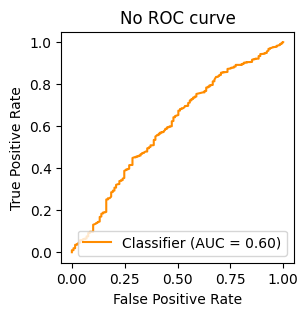

White
training with 4704 samples; test with 1176 samples
AUROC: 0.5775


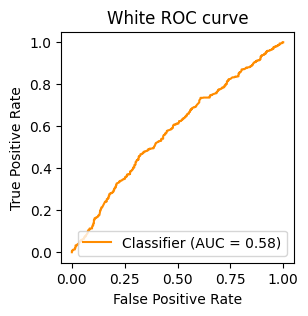

Black
training with 4704 samples; test with 1176 samples
AUROC: 0.6489


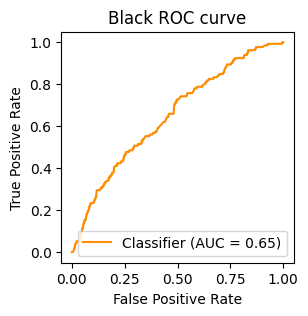

Asian
training with 4704 samples; test with 1176 samples
AUROC: 0.7181


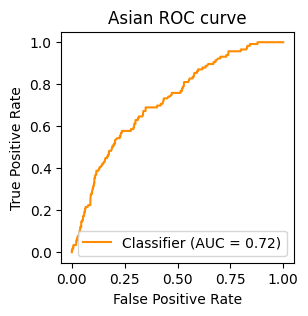

Other or mixed
training with 4704 samples; test with 1176 samples
AUROC: 0.5235


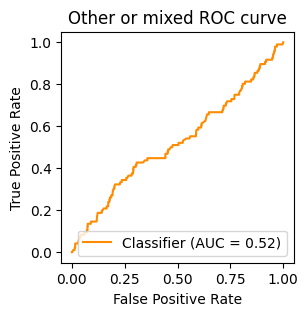

Less than $50,000
training with 4704 samples; test with 1176 samples
AUROC: 0.6316


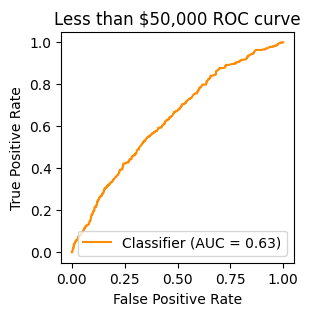

$50,000 - $99,999
training with 4704 samples; test with 1176 samples
AUROC: 0.5158


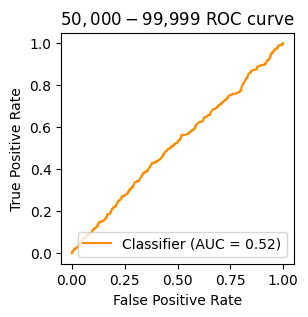

$100,000 or more
training with 4704 samples; test with 1176 samples
AUROC: 0.5942


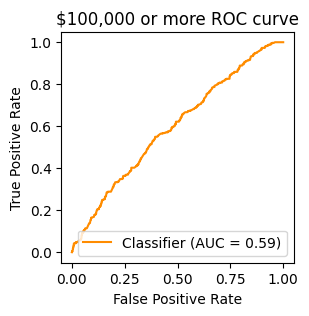


--------------------
Subsample with 0.8 of data

k=100
X shape: (6720, 77)
Male
training with 5376 samples; test with 1344 samples
AUROC: 0.6668


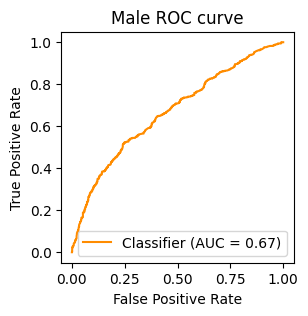

Female
training with 5376 samples; test with 1344 samples
AUROC: 0.6546


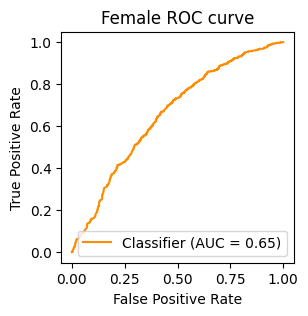

18 - 34 years
training with 5376 samples; test with 1344 samples
AUROC: 0.6397


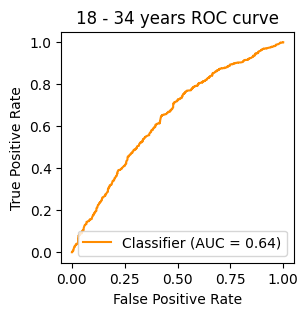

35 - 54 years
training with 5376 samples; test with 1344 samples
AUROC: 0.5757


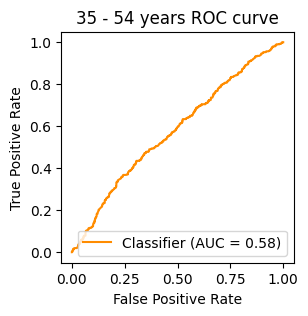

55 or older
training with 5376 samples; test with 1344 samples
AUROC: 0.6662


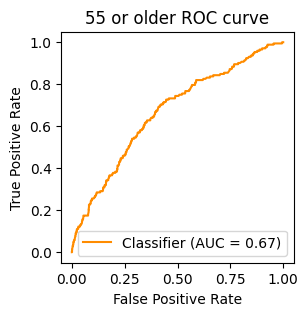

Yes
training with 5376 samples; test with 1344 samples
AUROC: 0.6283


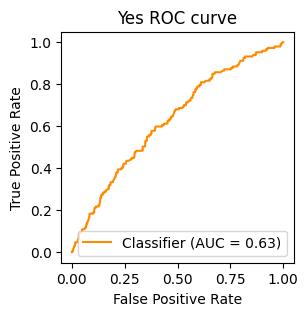

No
training with 5376 samples; test with 1344 samples
AUROC: 0.6029


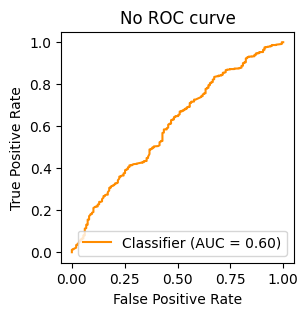

White
training with 5376 samples; test with 1344 samples
AUROC: 0.5777


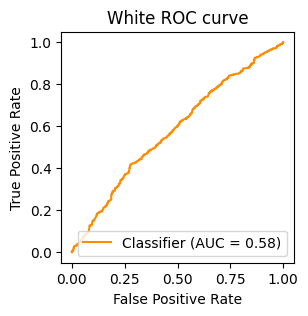

Black
training with 5376 samples; test with 1344 samples
AUROC: 0.6421


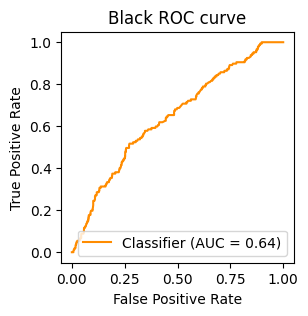

Asian
training with 5376 samples; test with 1344 samples
AUROC: 0.7066


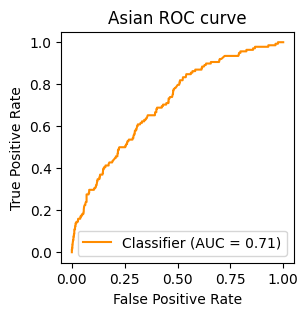

Other or mixed
training with 5376 samples; test with 1344 samples
AUROC: 0.5858


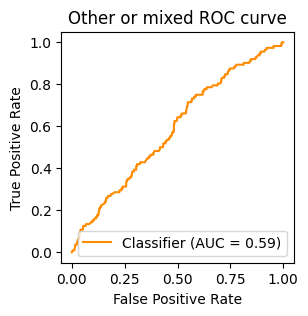

Less than $50,000
training with 5376 samples; test with 1344 samples
AUROC: 0.6040


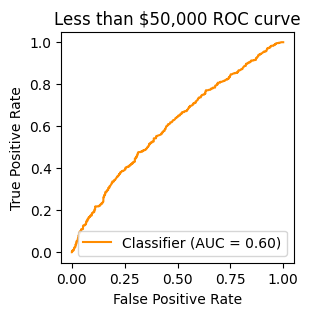

$50,000 - $99,999
training with 5376 samples; test with 1344 samples
AUROC: 0.5378


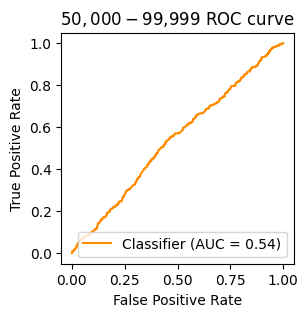

$100,000 or more
training with 5376 samples; test with 1344 samples
AUROC: 0.5832


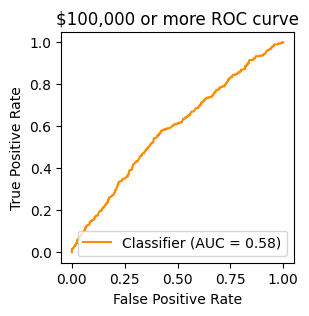


--------------------
Subsample with 0.9 of data

k=100
X shape: (7560, 78)
Male
training with 6048 samples; test with 1512 samples
AUROC: 0.6551


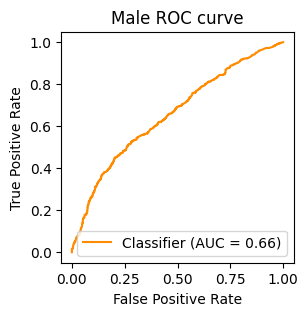

Female
training with 6048 samples; test with 1512 samples
AUROC: 0.6793


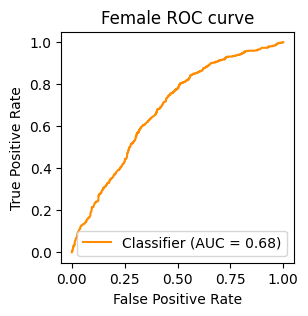

18 - 34 years
training with 6048 samples; test with 1512 samples
AUROC: 0.6359


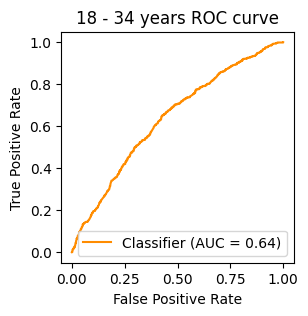

35 - 54 years
training with 6048 samples; test with 1512 samples
AUROC: 0.5808


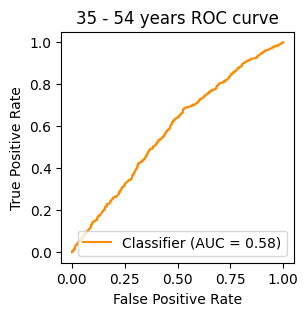

55 or older
training with 6048 samples; test with 1512 samples
AUROC: 0.6572


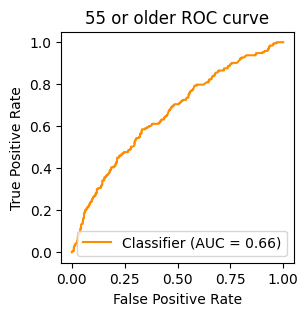

Yes
training with 6048 samples; test with 1512 samples
AUROC: 0.5905


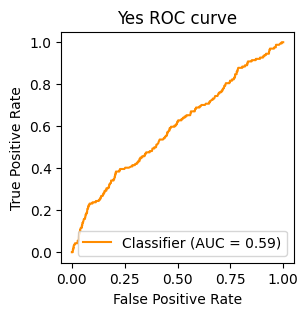

No
training with 6048 samples; test with 1512 samples
AUROC: 0.6267


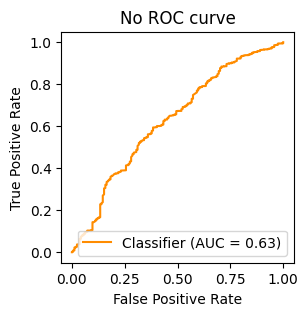

White
training with 6048 samples; test with 1512 samples
AUROC: 0.5860


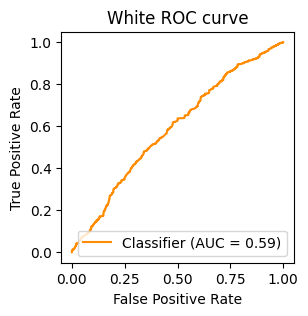

Black
training with 6048 samples; test with 1512 samples
AUROC: 0.6619


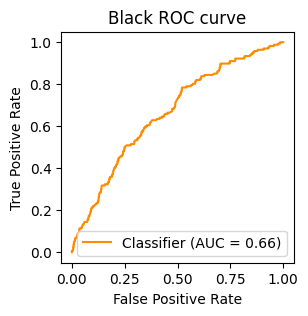

Asian
training with 6048 samples; test with 1512 samples
AUROC: 0.6903


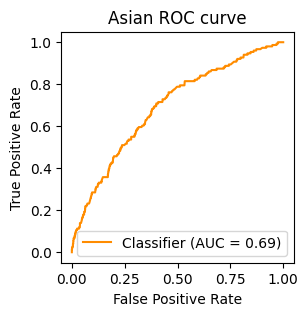

Other or mixed
training with 6048 samples; test with 1512 samples
AUROC: 0.5960


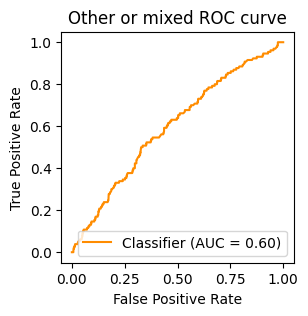

Less than $50,000
training with 6048 samples; test with 1512 samples
AUROC: 0.6035


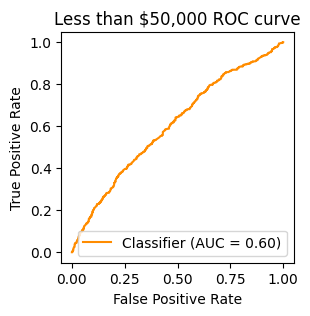

$50,000 - $99,999
training with 6048 samples; test with 1512 samples
AUROC: 0.5195


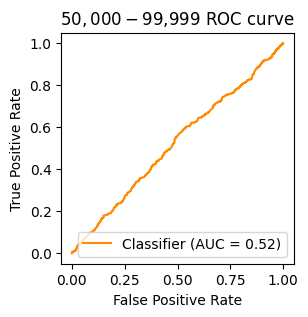

$100,000 or more
training with 6048 samples; test with 1512 samples
AUROC: 0.6088


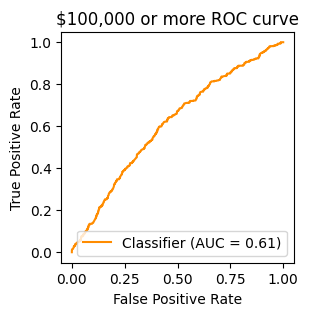


--------------------
Subsample with 1.0 of data

k=100
X shape: (8400, 85)
Male
training with 6720 samples; test with 1680 samples
AUROC: 0.6704


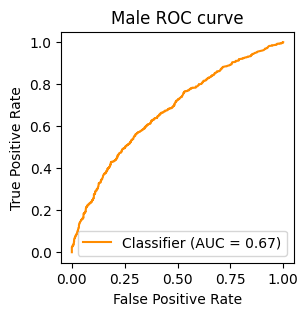

Female
training with 6720 samples; test with 1680 samples
AUROC: 0.6641


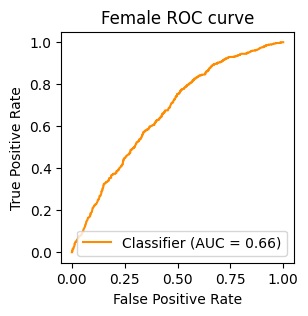

18 - 34 years
training with 6720 samples; test with 1680 samples
AUROC: 0.6505


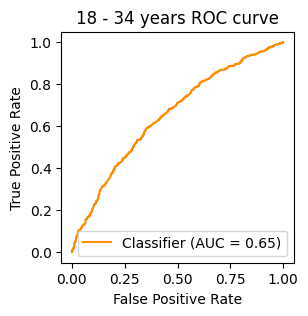

35 - 54 years
training with 6720 samples; test with 1680 samples
AUROC: 0.5690


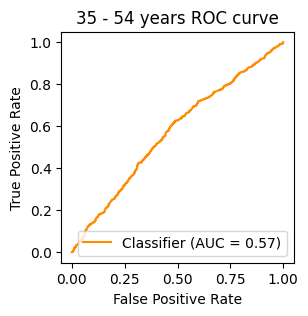

55 or older
training with 6720 samples; test with 1680 samples
AUROC: 0.6909


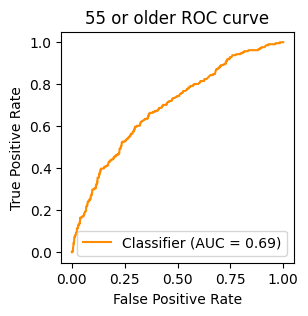

Yes
training with 6720 samples; test with 1680 samples
AUROC: 0.6158


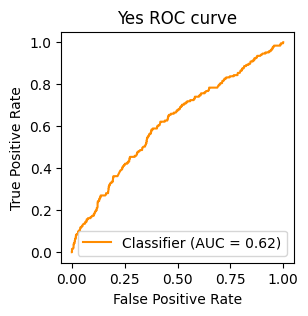

No
training with 6720 samples; test with 1680 samples
AUROC: 0.5964


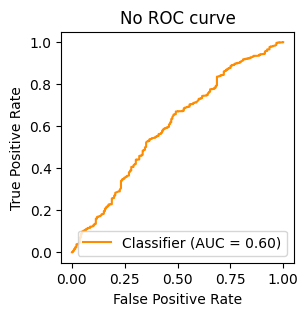

White
training with 6720 samples; test with 1680 samples
AUROC: 0.6061


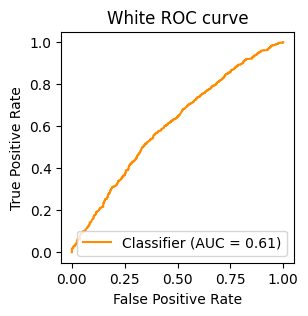

Black
training with 6720 samples; test with 1680 samples
AUROC: 0.6689


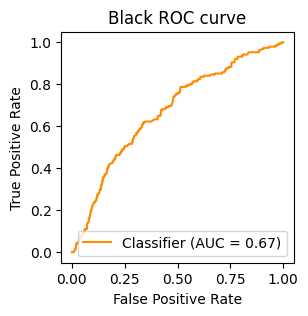

Asian
training with 6720 samples; test with 1680 samples
AUROC: 0.6848


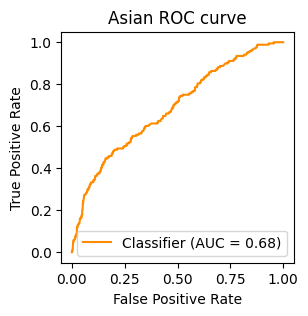

Other or mixed
training with 6720 samples; test with 1680 samples
AUROC: 0.5815


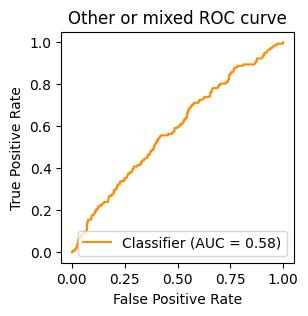

Less than $50,000
training with 6720 samples; test with 1680 samples
AUROC: 0.5932


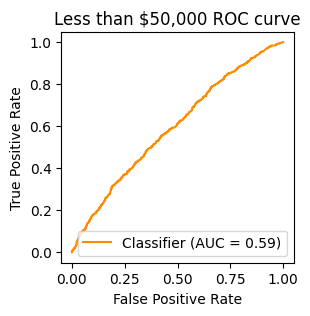

$50,000 - $99,999
training with 6720 samples; test with 1680 samples
AUROC: 0.5060


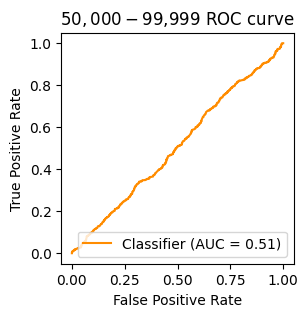

$100,000 or more
training with 6720 samples; test with 1680 samples
AUROC: 0.6160


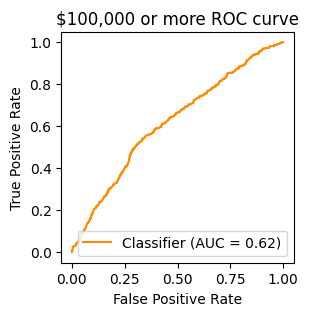


--------------------
Subsample with 0.2 of data

k=150
X shape: (1680, 30)
Male
training with 1344 samples; test with 336 samples
AUROC: 0.6980


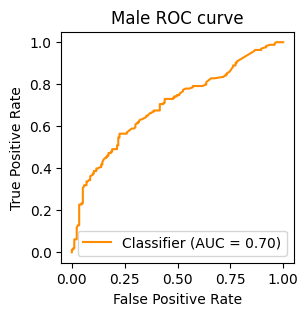

Female
training with 1344 samples; test with 336 samples
AUROC: 0.7010


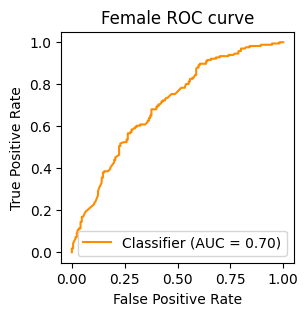

18 - 34 years
training with 1344 samples; test with 336 samples
AUROC: 0.6725


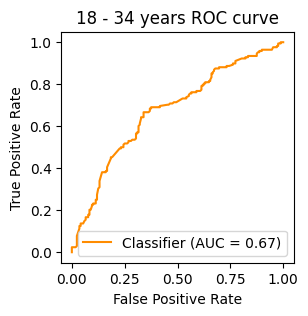

35 - 54 years
training with 1344 samples; test with 336 samples
AUROC: 0.5759


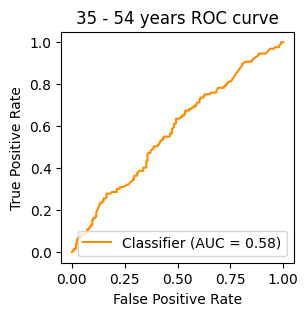

55 or older
training with 1344 samples; test with 336 samples
AUROC: 0.6456


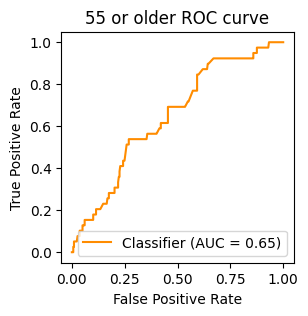

Yes
training with 1344 samples; test with 336 samples
AUROC: 0.6663


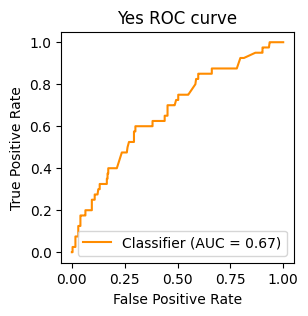

No
training with 1344 samples; test with 336 samples
AUROC: 0.6137


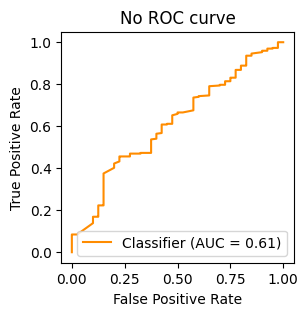

White
training with 1344 samples; test with 336 samples
AUROC: 0.5398


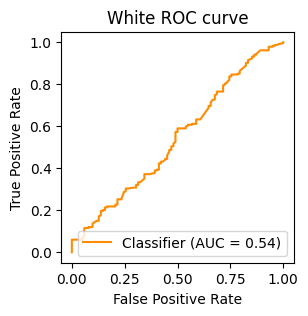

Black
training with 1344 samples; test with 336 samples
AUROC: 0.5786


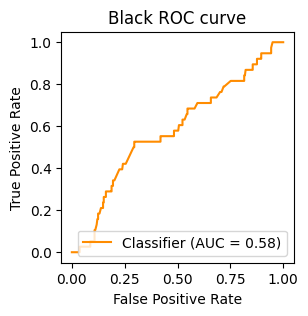

Asian
training with 1344 samples; test with 336 samples
AUROC: 0.6935


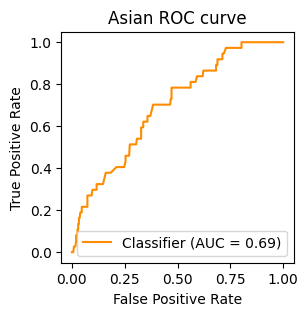

Other or mixed
training with 1344 samples; test with 336 samples
AUROC: 0.6197


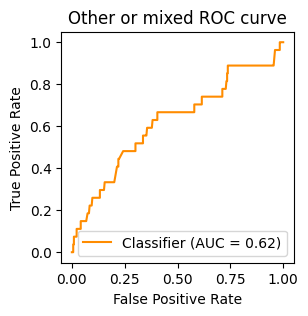

Less than $50,000
training with 1344 samples; test with 336 samples
AUROC: 0.5692


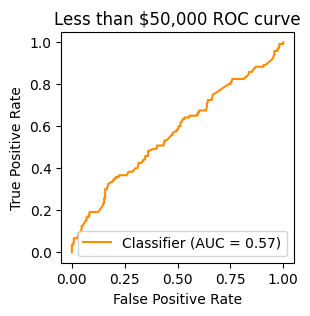

$50,000 - $99,999
training with 1344 samples; test with 336 samples
AUROC: 0.4601


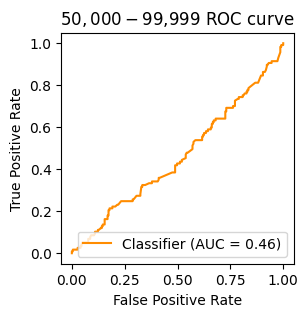

$100,000 or more
training with 1344 samples; test with 336 samples
AUROC: 0.5407


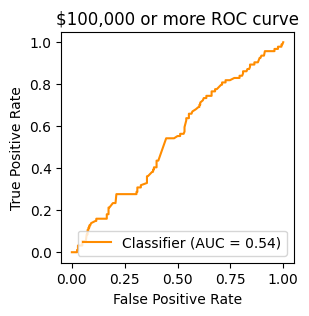


--------------------
Subsample with 0.3 of data

k=150
X shape: (2520, 39)
Male
training with 2016 samples; test with 504 samples
AUROC: 0.6356


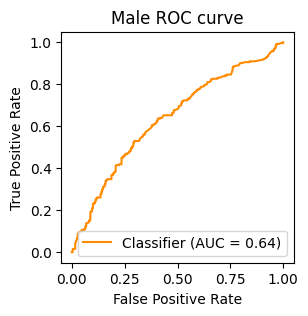

Female
training with 2016 samples; test with 504 samples
AUROC: 0.6462


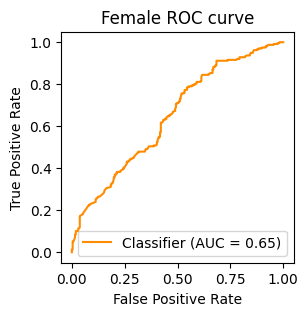

18 - 34 years
training with 2016 samples; test with 504 samples
AUROC: 0.5997


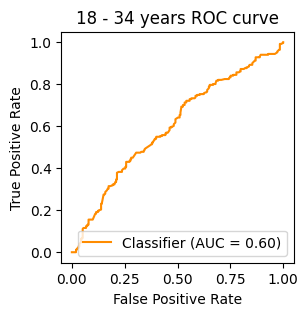

35 - 54 years
training with 2016 samples; test with 504 samples
AUROC: 0.5381


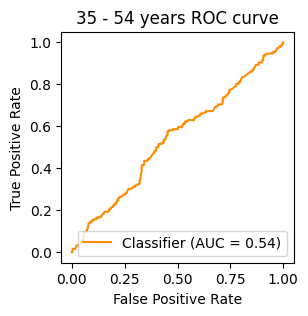

55 or older
training with 2016 samples; test with 504 samples
AUROC: 0.6650


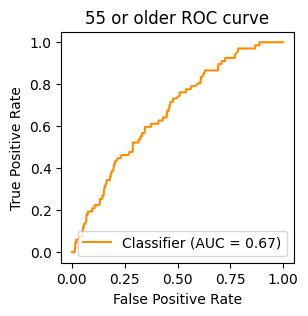

Yes
training with 2016 samples; test with 504 samples
AUROC: 0.6583


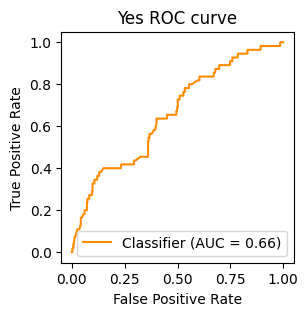

No
training with 2016 samples; test with 504 samples
AUROC: 0.6526


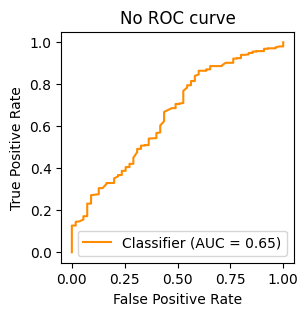

White
training with 2016 samples; test with 504 samples
AUROC: 0.5803


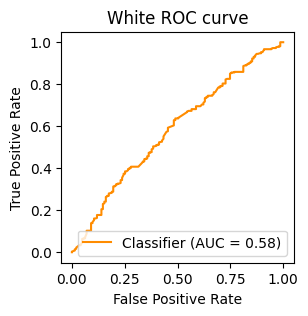

Black
training with 2016 samples; test with 504 samples
AUROC: 0.5871


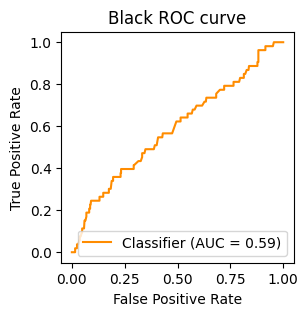

Asian
training with 2016 samples; test with 504 samples
AUROC: 0.6602


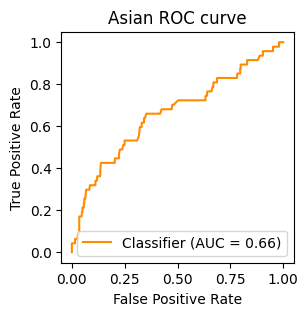

Other or mixed
training with 2016 samples; test with 504 samples
AUROC: 0.4643


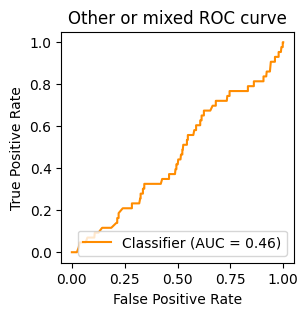

Less than $50,000
training with 2016 samples; test with 504 samples
AUROC: 0.5608


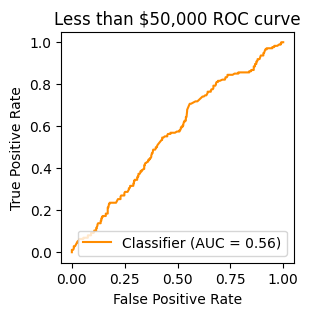

$50,000 - $99,999
training with 2016 samples; test with 504 samples
AUROC: 0.5083


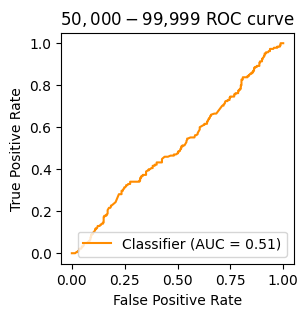

$100,000 or more
training with 2016 samples; test with 504 samples
AUROC: 0.6501


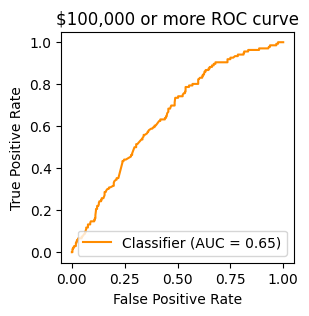


--------------------
Subsample with 0.4 of data

k=150
X shape: (3360, 44)
Male
training with 2688 samples; test with 672 samples
AUROC: 0.6750


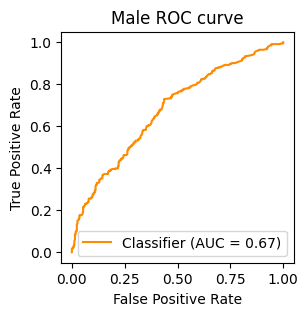

Female
training with 2688 samples; test with 672 samples
AUROC: 0.6696


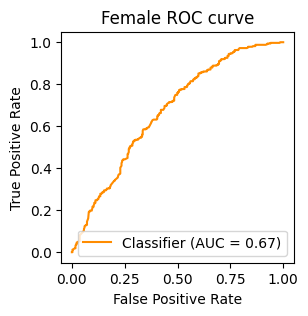

18 - 34 years
training with 2688 samples; test with 672 samples
AUROC: 0.6539


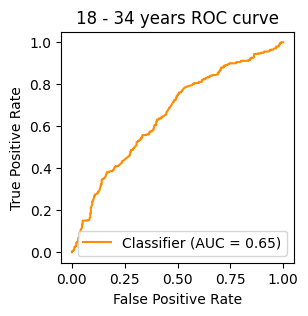

35 - 54 years
training with 2688 samples; test with 672 samples
AUROC: 0.5920


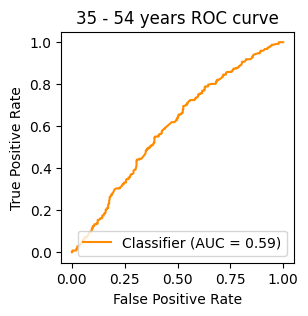

55 or older
training with 2688 samples; test with 672 samples
AUROC: 0.6549


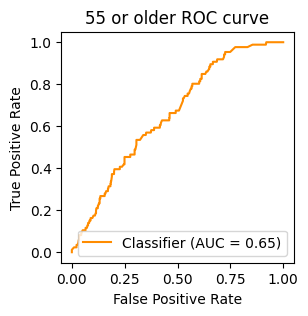

Yes
training with 2688 samples; test with 672 samples
AUROC: 0.5965


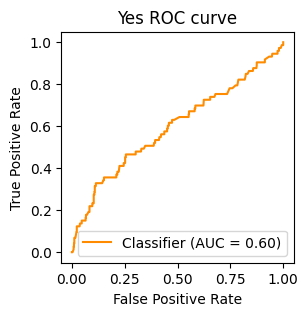

No
training with 2688 samples; test with 672 samples
AUROC: 0.5724


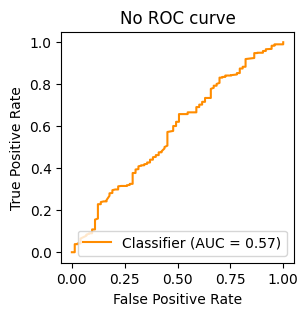

White
training with 2688 samples; test with 672 samples
AUROC: 0.5391


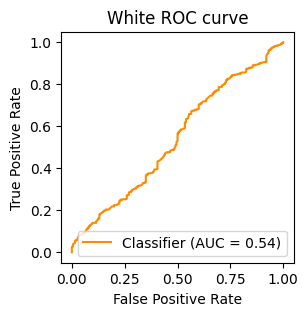

Black
training with 2688 samples; test with 672 samples
AUROC: 0.6524


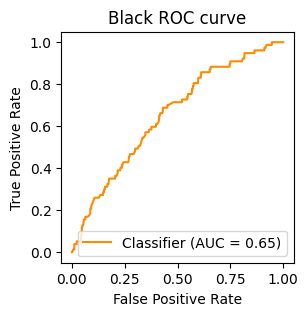

Asian
training with 2688 samples; test with 672 samples
AUROC: 0.7077


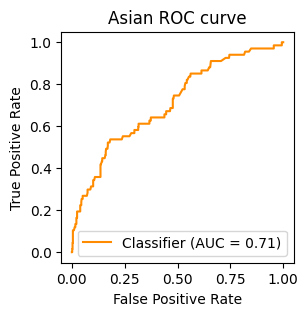

Other or mixed
training with 2688 samples; test with 672 samples
AUROC: 0.5498


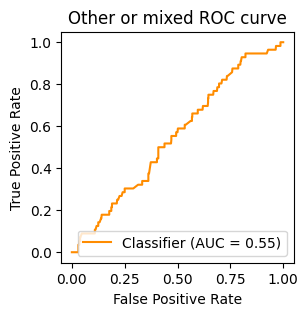

Less than $50,000
training with 2688 samples; test with 672 samples
AUROC: 0.6214


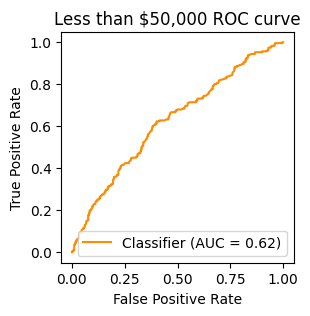

$50,000 - $99,999
training with 2688 samples; test with 672 samples
AUROC: 0.4857


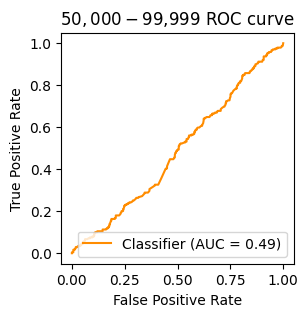

$100,000 or more
training with 2688 samples; test with 672 samples
AUROC: 0.5528


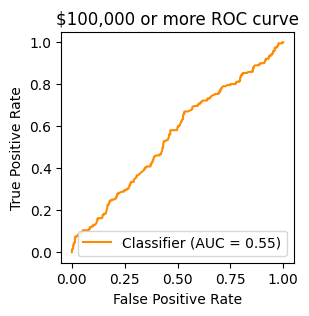


--------------------
Subsample with 0.5 of data

k=150
X shape: (4200, 49)
Male
training with 3360 samples; test with 840 samples
AUROC: 0.6381


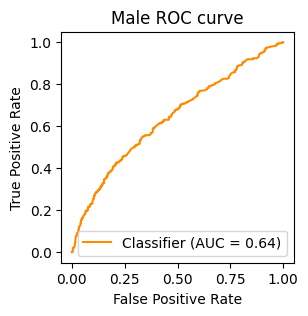

Female
training with 3360 samples; test with 840 samples
AUROC: 0.6580


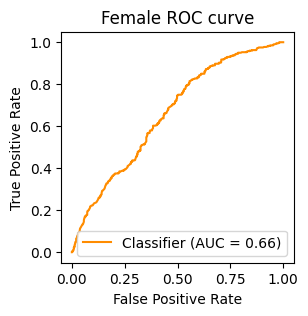

18 - 34 years
training with 3360 samples; test with 840 samples
AUROC: 0.6429


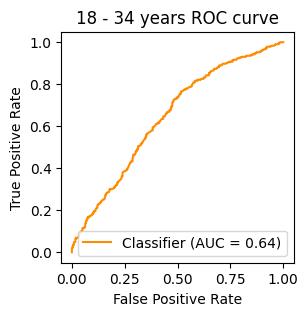

35 - 54 years
training with 3360 samples; test with 840 samples
AUROC: 0.5877


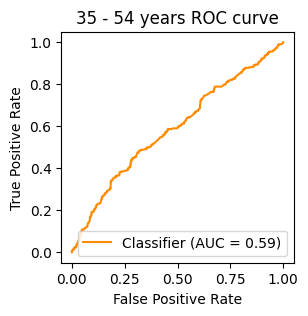

55 or older
training with 3360 samples; test with 840 samples
AUROC: 0.6123


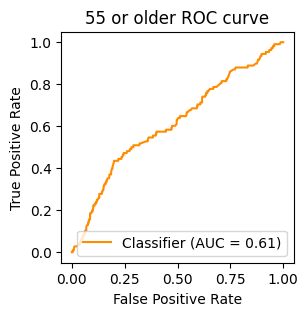

Yes
training with 3360 samples; test with 840 samples
AUROC: 0.5522


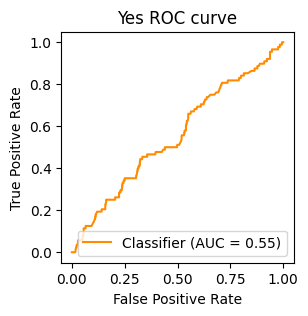

No
training with 3360 samples; test with 840 samples
AUROC: 0.6178


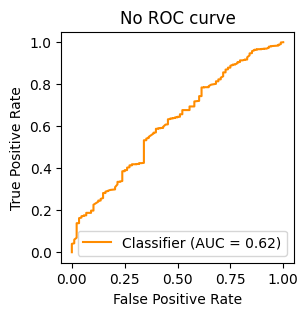

White
training with 3360 samples; test with 840 samples
AUROC: 0.5824


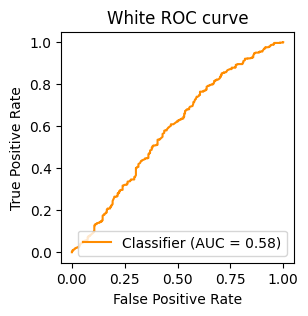

Black
training with 3360 samples; test with 840 samples
AUROC: 0.6344


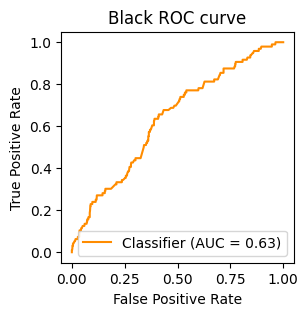

Asian
training with 3360 samples; test with 840 samples
AUROC: 0.7322


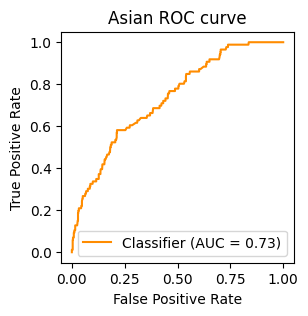

Other or mixed
training with 3360 samples; test with 840 samples
AUROC: 0.5392


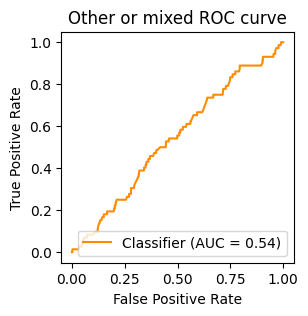

Less than $50,000
training with 3360 samples; test with 840 samples
AUROC: 0.5966


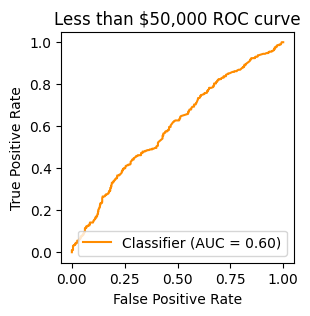

$50,000 - $99,999
training with 3360 samples; test with 840 samples
AUROC: 0.5112


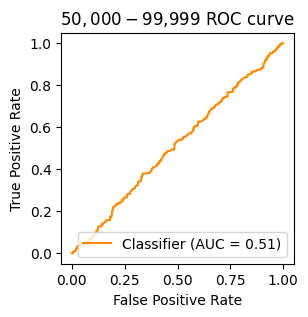

$100,000 or more
training with 3360 samples; test with 840 samples
AUROC: 0.6134


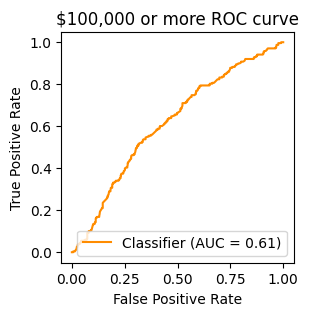


--------------------
Subsample with 0.6 of data

k=150
X shape: (5040, 54)
Male
training with 4032 samples; test with 1008 samples
AUROC: 0.6449


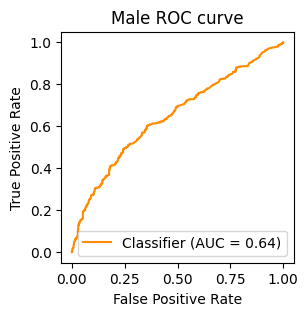

Female
training with 4032 samples; test with 1008 samples
AUROC: 0.6624


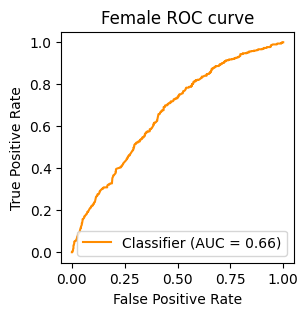

18 - 34 years
training with 4032 samples; test with 1008 samples
AUROC: 0.6520


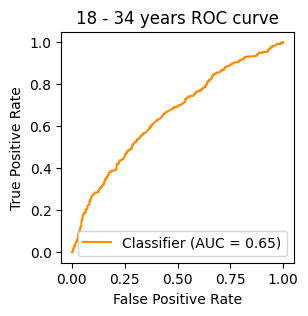

35 - 54 years
training with 4032 samples; test with 1008 samples
AUROC: 0.5790


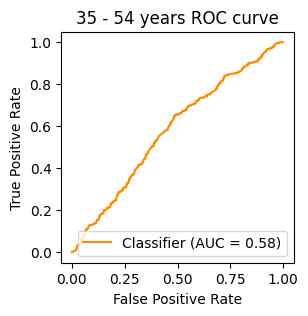

55 or older
training with 4032 samples; test with 1008 samples
AUROC: 0.6564


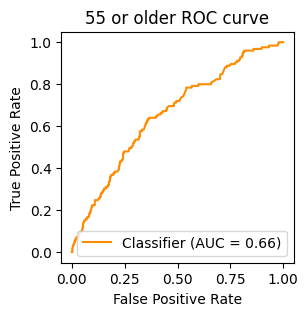

Yes
training with 4032 samples; test with 1008 samples
AUROC: 0.5878


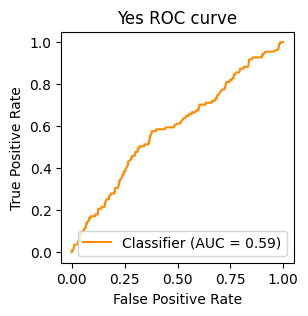

No
training with 4032 samples; test with 1008 samples
AUROC: 0.6126


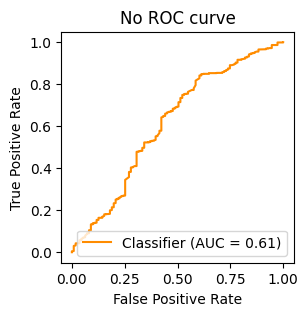

White
training with 4032 samples; test with 1008 samples
AUROC: 0.5689


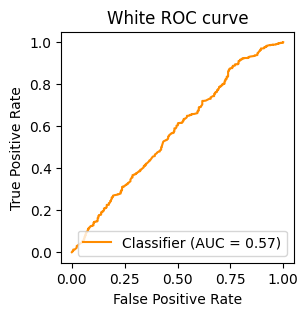

Black
training with 4032 samples; test with 1008 samples
AUROC: 0.6375


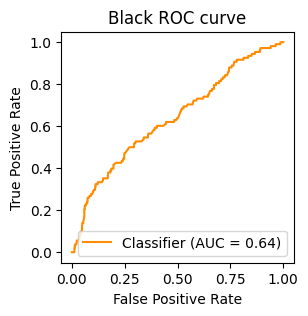

Asian
training with 4032 samples; test with 1008 samples
AUROC: 0.7150


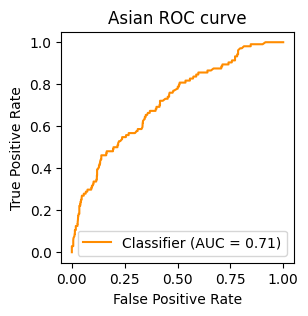

Other or mixed
training with 4032 samples; test with 1008 samples
AUROC: 0.6029


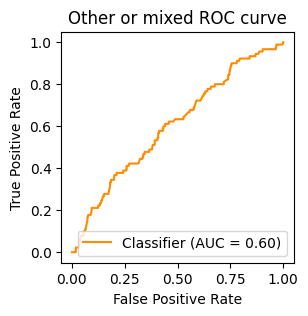

Less than $50,000
training with 4032 samples; test with 1008 samples
AUROC: 0.6051


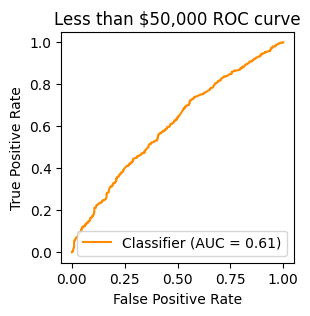

$50,000 - $99,999
training with 4032 samples; test with 1008 samples
AUROC: 0.4856


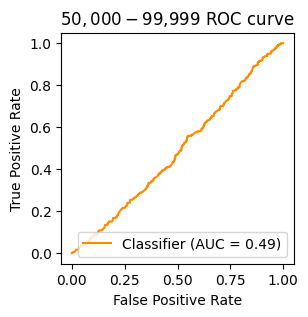

$100,000 or more
training with 4032 samples; test with 1008 samples
AUROC: 0.5930


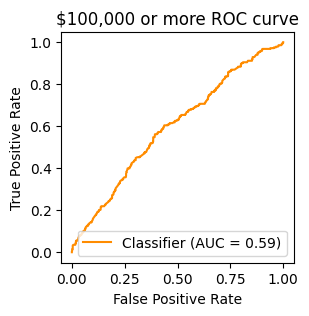


--------------------
Subsample with 0.7 of data

k=150
X shape: (5880, 56)
Male
training with 4704 samples; test with 1176 samples
AUROC: 0.6743


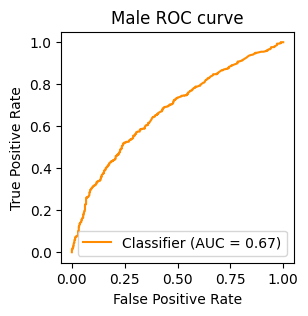

Female
training with 4704 samples; test with 1176 samples
AUROC: 0.6384


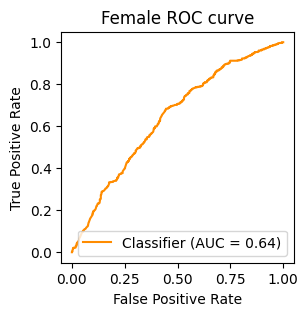

18 - 34 years
training with 4704 samples; test with 1176 samples
AUROC: 0.6495


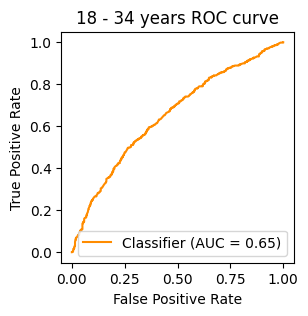

35 - 54 years
training with 4704 samples; test with 1176 samples
AUROC: 0.5816


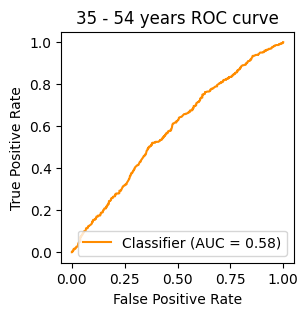

55 or older
training with 4704 samples; test with 1176 samples
AUROC: 0.6666


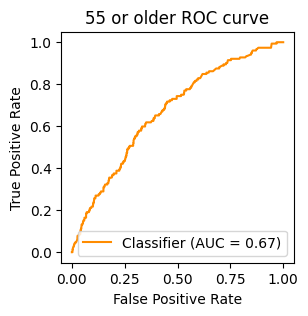

Yes
training with 4704 samples; test with 1176 samples
AUROC: 0.5615


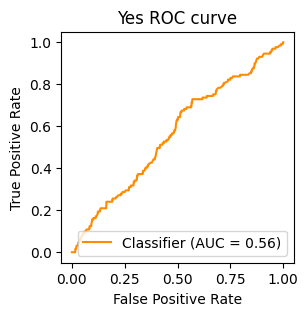

No
training with 4704 samples; test with 1176 samples
AUROC: 0.5807


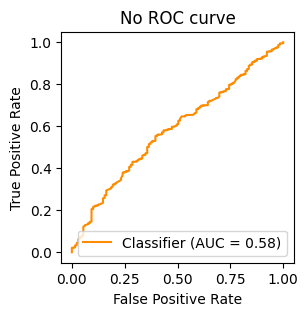

White
training with 4704 samples; test with 1176 samples
AUROC: 0.5734


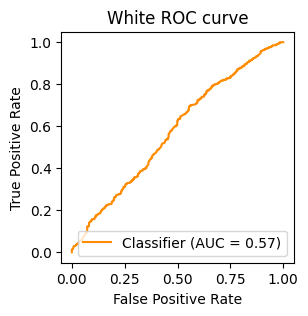

Black
training with 4704 samples; test with 1176 samples
AUROC: 0.6464


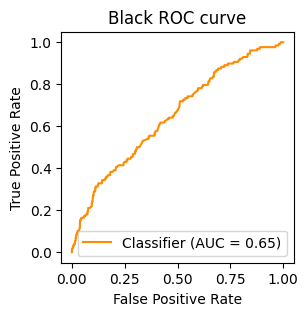

Asian
training with 4704 samples; test with 1176 samples
AUROC: 0.6912


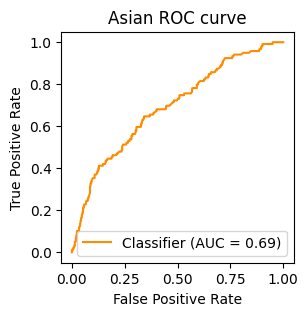

Other or mixed
training with 4704 samples; test with 1176 samples
AUROC: 0.6128


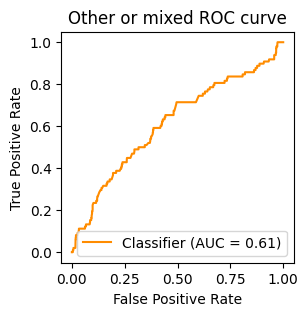

Less than $50,000
training with 4704 samples; test with 1176 samples
AUROC: 0.5771


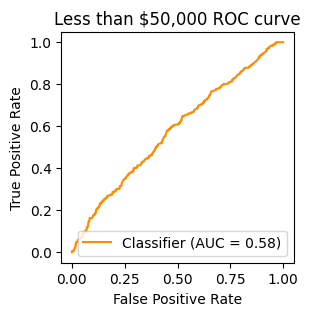

$50,000 - $99,999
training with 4704 samples; test with 1176 samples
AUROC: 0.4458


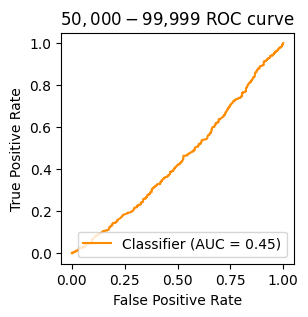

$100,000 or more
training with 4704 samples; test with 1176 samples
AUROC: 0.6017


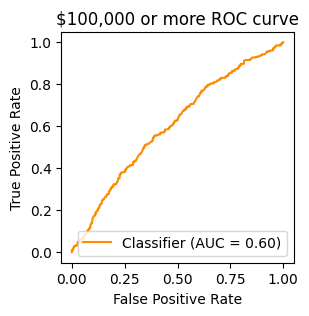


--------------------
Subsample with 0.8 of data

k=150
X shape: (6720, 58)
Male
training with 5376 samples; test with 1344 samples
AUROC: 0.6531


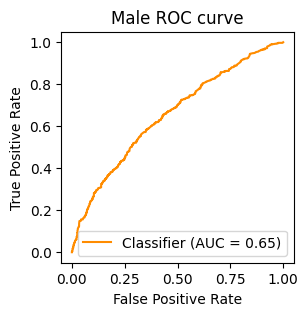

Female
training with 5376 samples; test with 1344 samples
AUROC: 0.6524


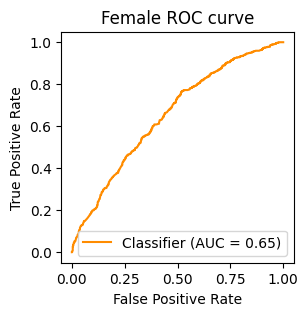

18 - 34 years
training with 5376 samples; test with 1344 samples
AUROC: 0.6453


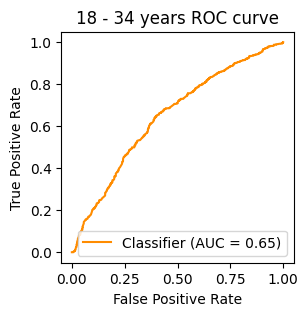

35 - 54 years
training with 5376 samples; test with 1344 samples
AUROC: 0.5901


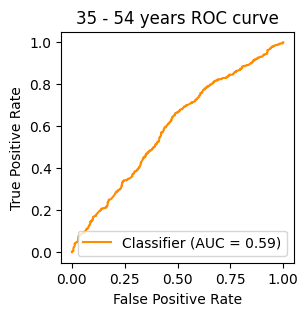

55 or older
training with 5376 samples; test with 1344 samples
AUROC: 0.6749


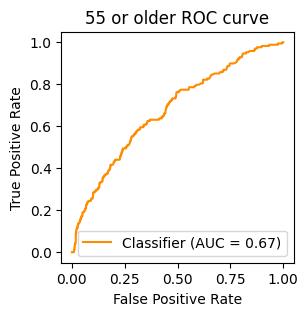

Yes
training with 5376 samples; test with 1344 samples
AUROC: 0.5924


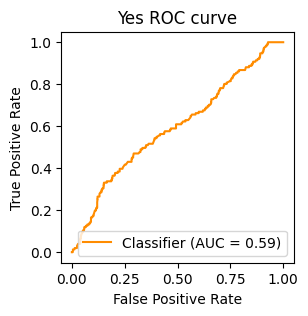

No
training with 5376 samples; test with 1344 samples
AUROC: 0.6098


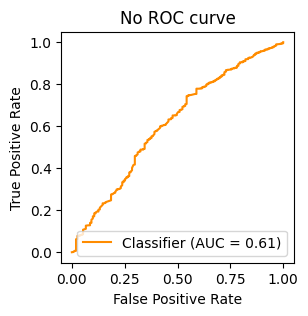

White
training with 5376 samples; test with 1344 samples
AUROC: 0.5967


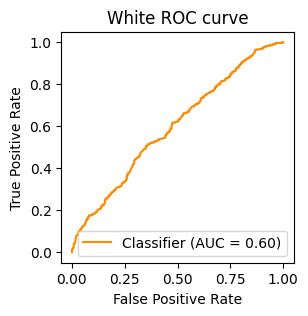

Black
training with 5376 samples; test with 1344 samples
AUROC: 0.6696


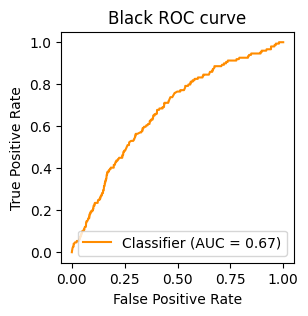

Asian
training with 5376 samples; test with 1344 samples
AUROC: 0.7581


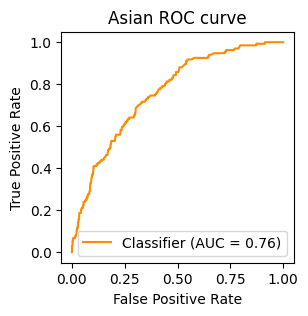

Other or mixed
training with 5376 samples; test with 1344 samples
AUROC: 0.5599


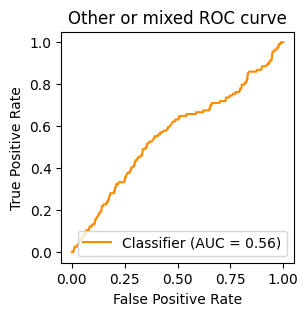

Less than $50,000
training with 5376 samples; test with 1344 samples
AUROC: 0.6133


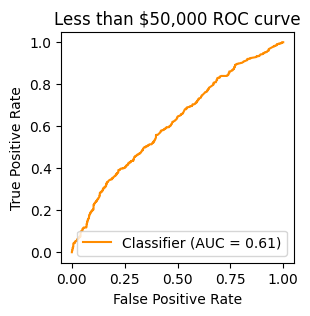

$50,000 - $99,999
training with 5376 samples; test with 1344 samples
AUROC: 0.4999


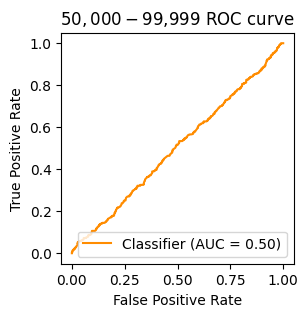

$100,000 or more
training with 5376 samples; test with 1344 samples
AUROC: 0.6022


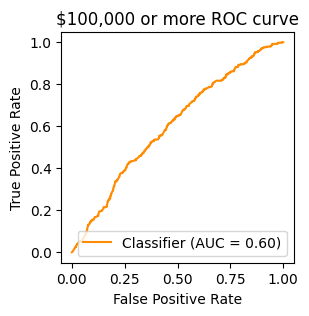


--------------------
Subsample with 0.9 of data

k=150
X shape: (7560, 60)
Male
training with 6048 samples; test with 1512 samples
AUROC: 0.6683


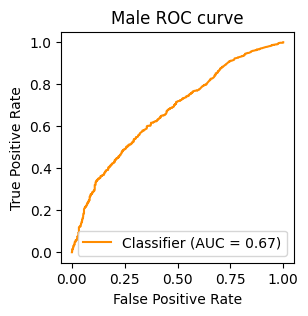

Female
training with 6048 samples; test with 1512 samples
AUROC: 0.6770


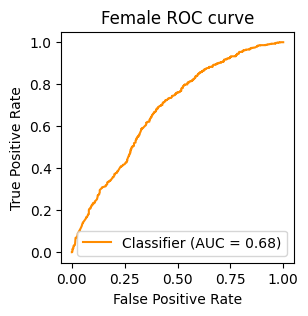

18 - 34 years
training with 6048 samples; test with 1512 samples
AUROC: 0.6475


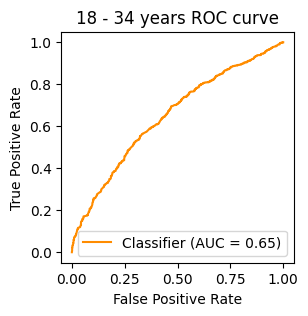

35 - 54 years
training with 6048 samples; test with 1512 samples
AUROC: 0.5763


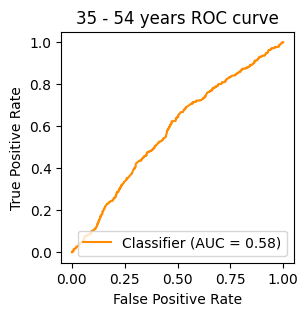

55 or older
training with 6048 samples; test with 1512 samples
AUROC: 0.6570


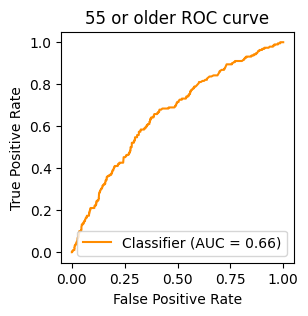

Yes
training with 6048 samples; test with 1512 samples
AUROC: 0.5883


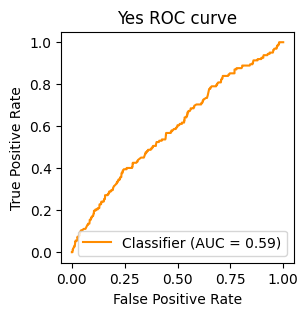

No
training with 6048 samples; test with 1512 samples
AUROC: 0.5843


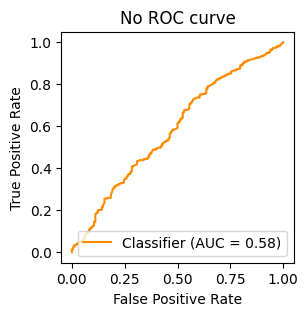

White
training with 6048 samples; test with 1512 samples
AUROC: 0.5753


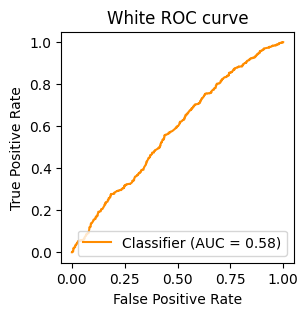

Black
training with 6048 samples; test with 1512 samples
AUROC: 0.6657


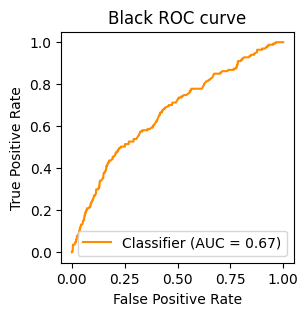

Asian
training with 6048 samples; test with 1512 samples
AUROC: 0.7108


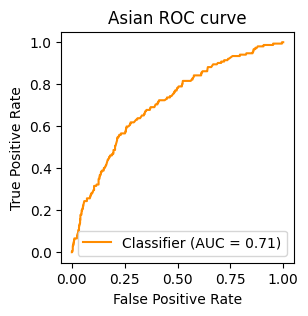

Other or mixed
training with 6048 samples; test with 1512 samples
AUROC: 0.5848


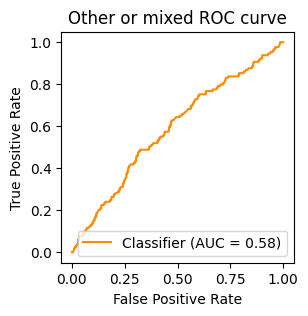

Less than $50,000
training with 6048 samples; test with 1512 samples
AUROC: 0.6200


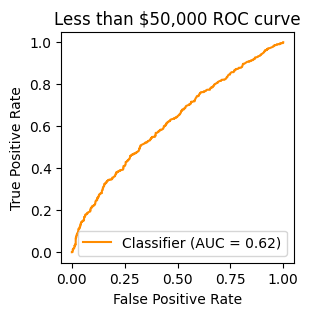

$50,000 - $99,999
training with 6048 samples; test with 1512 samples
AUROC: 0.5013


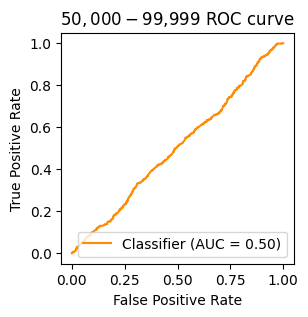

$100,000 or more
training with 6048 samples; test with 1512 samples
AUROC: 0.6125


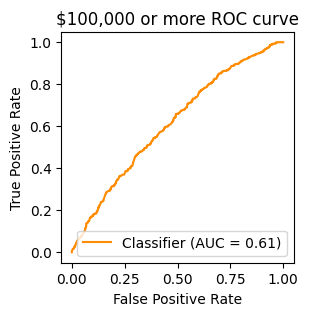


--------------------
Subsample with 1.0 of data

k=150
X shape: (8400, 64)
Male
training with 6720 samples; test with 1680 samples
AUROC: 0.6650


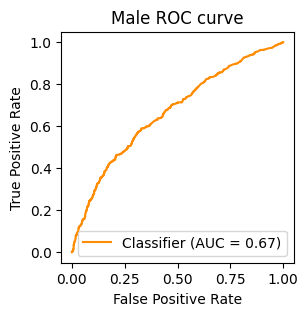

Female
training with 6720 samples; test with 1680 samples
AUROC: 0.6548


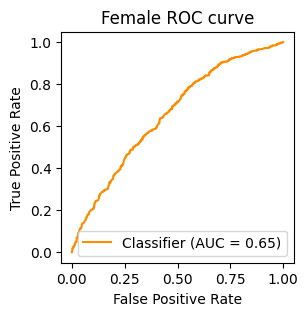

18 - 34 years
training with 6720 samples; test with 1680 samples
AUROC: 0.6495


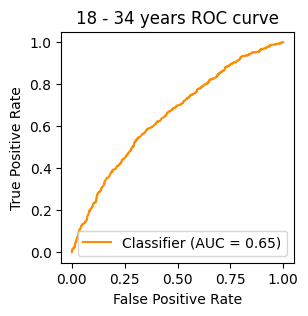

35 - 54 years
training with 6720 samples; test with 1680 samples
AUROC: 0.5757


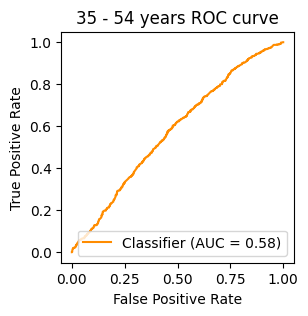

55 or older
training with 6720 samples; test with 1680 samples
AUROC: 0.6682


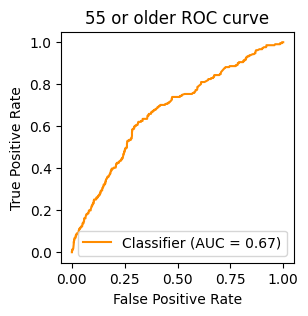

Yes
training with 6720 samples; test with 1680 samples
AUROC: 0.5691


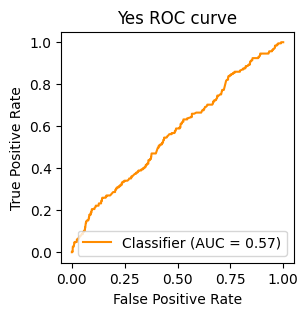

No
training with 6720 samples; test with 1680 samples
AUROC: 0.6070


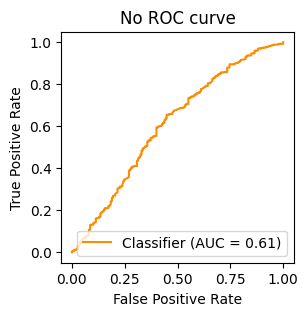

White
training with 6720 samples; test with 1680 samples
AUROC: 0.5605


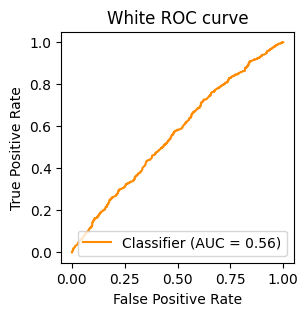

Black
training with 6720 samples; test with 1680 samples
AUROC: 0.6540


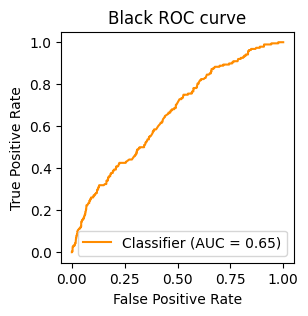

Asian
training with 6720 samples; test with 1680 samples
AUROC: 0.7143


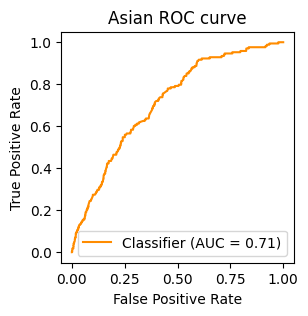

Other or mixed
training with 6720 samples; test with 1680 samples
AUROC: 0.5713


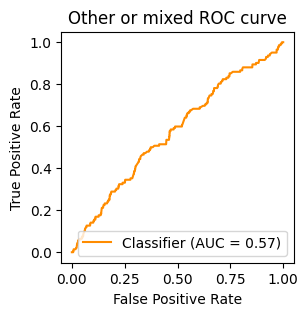

Less than $50,000
training with 6720 samples; test with 1680 samples
AUROC: 0.5912


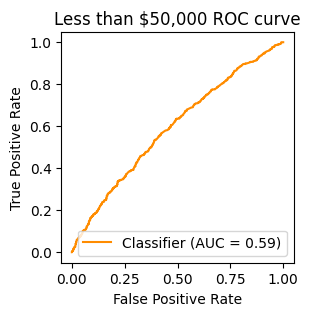

$50,000 - $99,999
training with 6720 samples; test with 1680 samples
AUROC: 0.5168


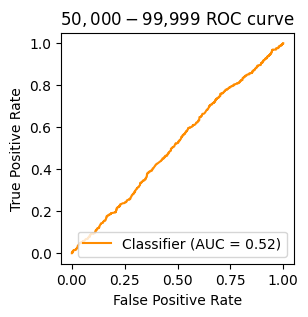

$100,000 or more
training with 6720 samples; test with 1680 samples
AUROC: 0.5999


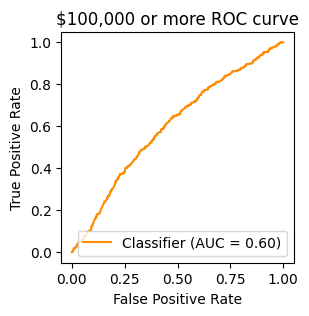


--------------------
Subsample with 0.2 of data

k=200
X shape: (1680, 25)
Male
training with 1344 samples; test with 336 samples
AUROC: 0.6108


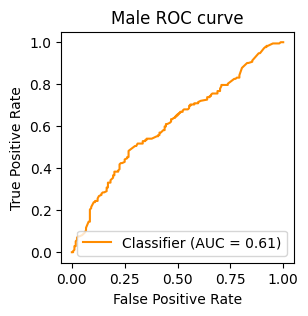

Female
training with 1344 samples; test with 336 samples
AUROC: 0.5606


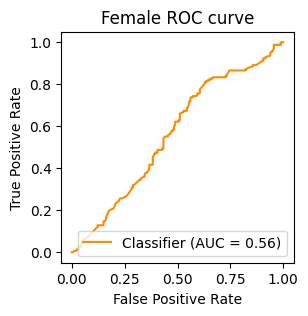

18 - 34 years
training with 1344 samples; test with 336 samples
AUROC: 0.5836


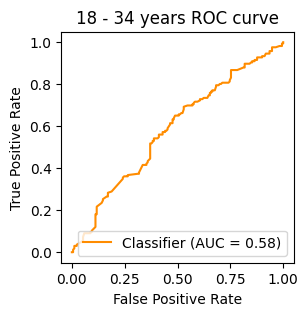

35 - 54 years
training with 1344 samples; test with 336 samples
AUROC: 0.5512


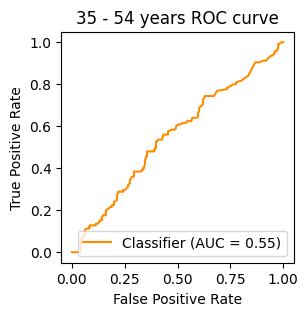

55 or older
training with 1344 samples; test with 336 samples
AUROC: 0.5369


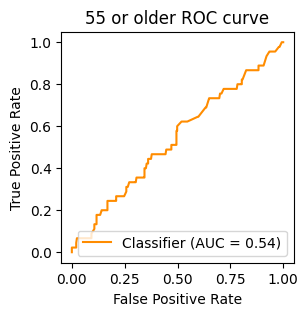

Yes
training with 1344 samples; test with 336 samples
AUROC: 0.6222


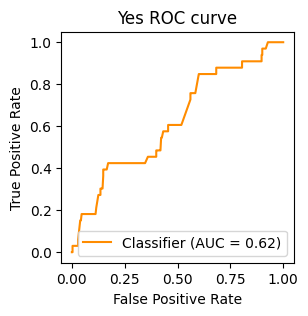

No
training with 1344 samples; test with 336 samples
AUROC: 0.5861


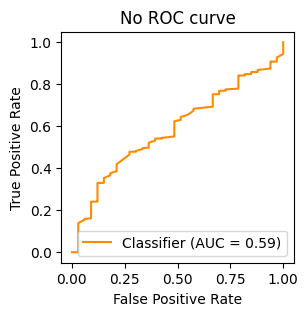

White
training with 1344 samples; test with 336 samples
AUROC: 0.5715


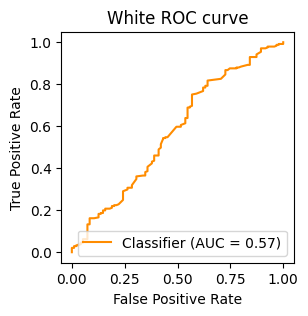

Black
training with 1344 samples; test with 336 samples
AUROC: 0.6377


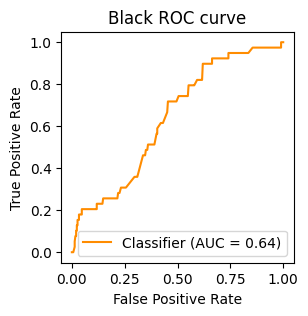

Asian
training with 1344 samples; test with 336 samples
AUROC: 0.7023


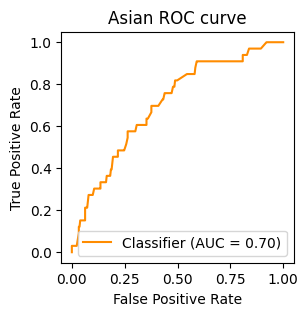

Other or mixed
training with 1344 samples; test with 336 samples
AUROC: 0.3944


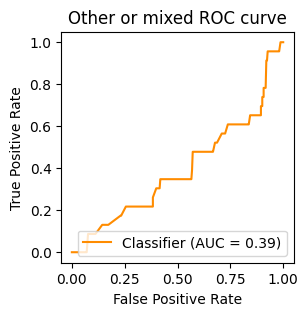

Less than $50,000
training with 1344 samples; test with 336 samples
AUROC: 0.6011


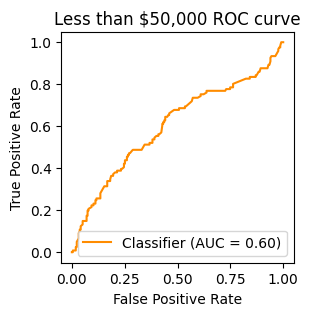

$50,000 - $99,999
training with 1344 samples; test with 336 samples
AUROC: 0.5485


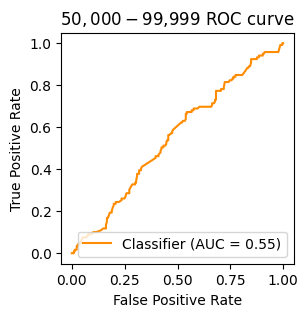

$100,000 or more
training with 1344 samples; test with 336 samples
AUROC: 0.5898


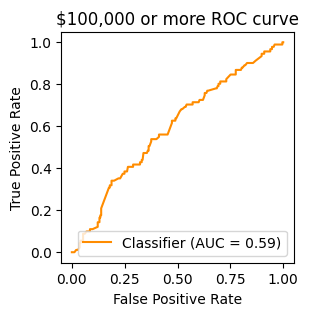


--------------------
Subsample with 0.3 of data

k=200
X shape: (2520, 33)
Male
training with 2016 samples; test with 504 samples
AUROC: 0.5956


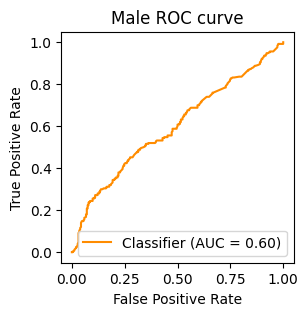

Female
training with 2016 samples; test with 504 samples
AUROC: 0.6447


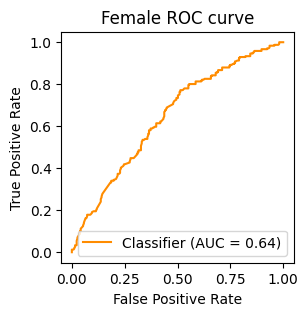

18 - 34 years
training with 2016 samples; test with 504 samples
AUROC: 0.6063


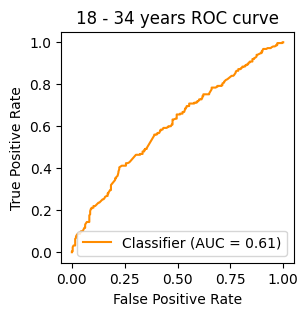

35 - 54 years
training with 2016 samples; test with 504 samples
AUROC: 0.5390


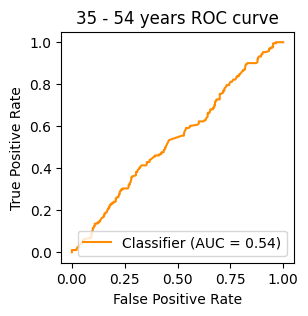

55 or older
training with 2016 samples; test with 504 samples
AUROC: 0.6721


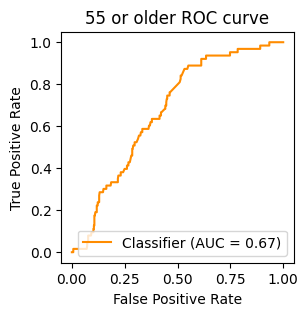

Yes
training with 2016 samples; test with 504 samples
AUROC: 0.5676


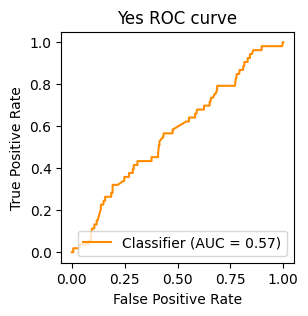

No
training with 2016 samples; test with 504 samples
AUROC: 0.5600


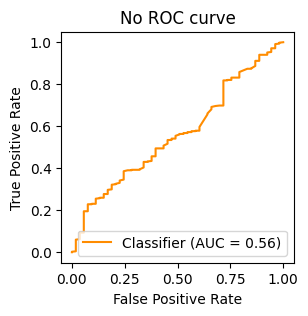

White
training with 2016 samples; test with 504 samples
AUROC: 0.5796


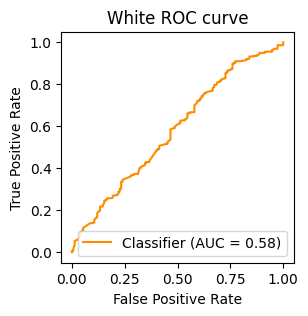

Black
training with 2016 samples; test with 504 samples
AUROC: 0.5784


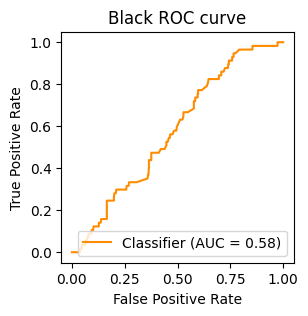

Asian
training with 2016 samples; test with 504 samples
AUROC: 0.6825


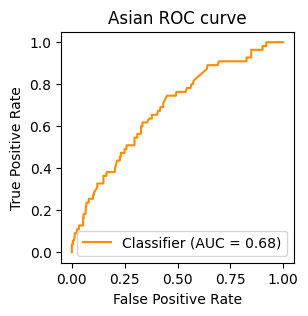

Other or mixed
training with 2016 samples; test with 504 samples
AUROC: 0.6030


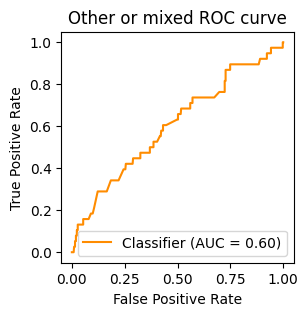

Less than $50,000
training with 2016 samples; test with 504 samples
AUROC: 0.5803


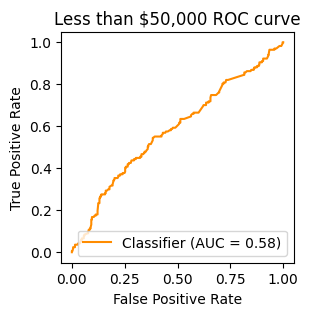

$50,000 - $99,999
training with 2016 samples; test with 504 samples
AUROC: 0.4994


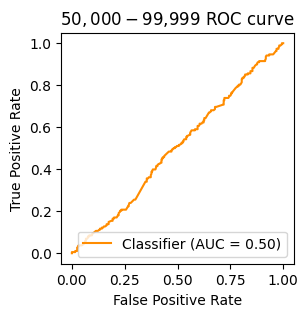

$100,000 or more
training with 2016 samples; test with 504 samples
AUROC: 0.5847


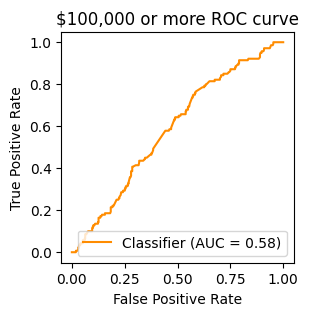


--------------------
Subsample with 0.4 of data

k=200
X shape: (3360, 39)
Male
training with 2688 samples; test with 672 samples
AUROC: 0.6606


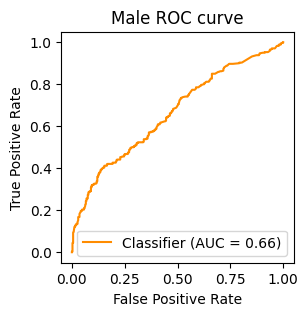

Female
training with 2688 samples; test with 672 samples
AUROC: 0.6602


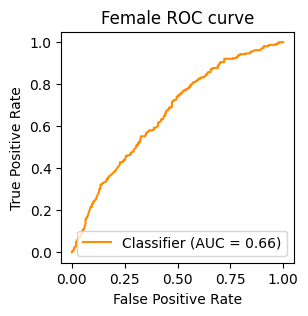

18 - 34 years
training with 2688 samples; test with 672 samples
AUROC: 0.6339


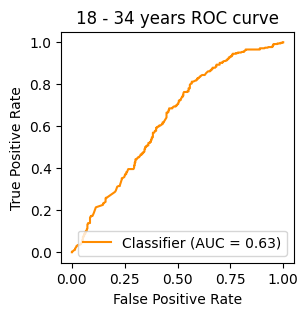

35 - 54 years
training with 2688 samples; test with 672 samples
AUROC: 0.5502


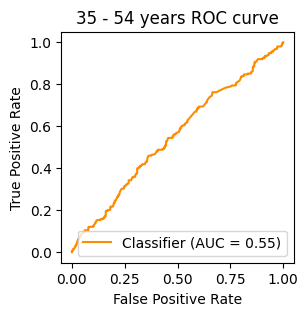

55 or older
training with 2688 samples; test with 672 samples
AUROC: 0.5834


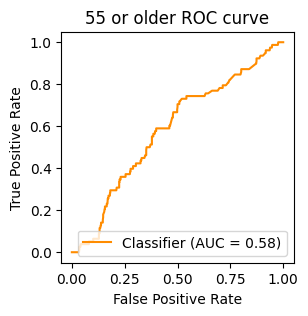

Yes
training with 2688 samples; test with 672 samples
AUROC: 0.6001


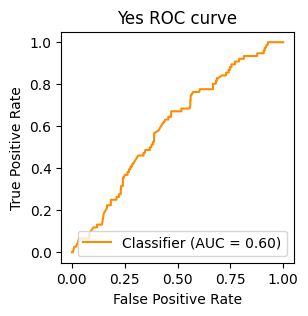

No
training with 2688 samples; test with 672 samples
AUROC: 0.5922


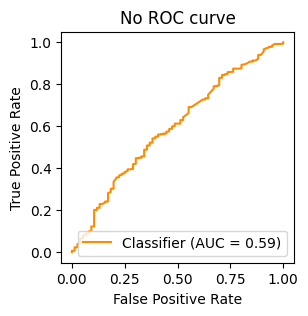

White
training with 2688 samples; test with 672 samples
AUROC: 0.5719


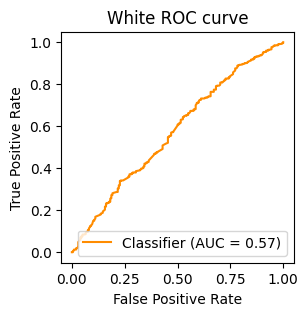

Black
training with 2688 samples; test with 672 samples
AUROC: 0.5625


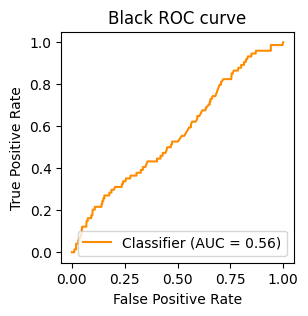

Asian
training with 2688 samples; test with 672 samples
AUROC: 0.6499


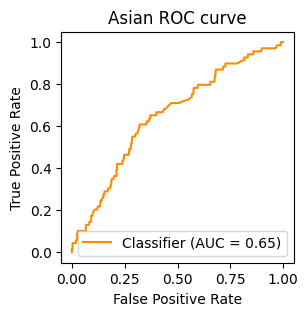

Other or mixed
training with 2688 samples; test with 672 samples
AUROC: 0.6250


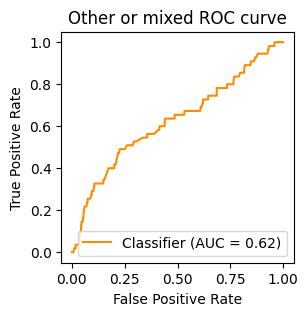

Less than $50,000
training with 2688 samples; test with 672 samples
AUROC: 0.5966


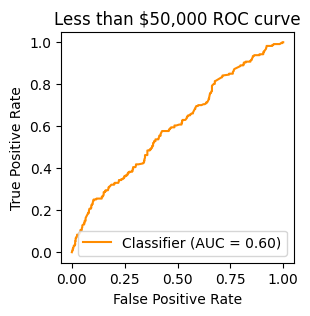

$50,000 - $99,999
training with 2688 samples; test with 672 samples
AUROC: 0.4942


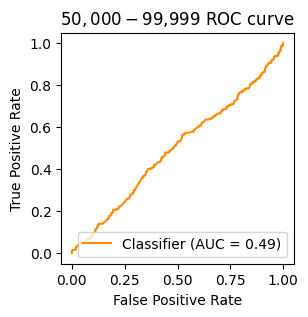

$100,000 or more
training with 2688 samples; test with 672 samples
AUROC: 0.5828


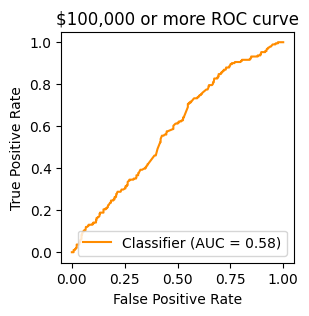


--------------------
Subsample with 0.5 of data

k=200
X shape: (4200, 42)
Male
training with 3360 samples; test with 840 samples
AUROC: 0.6578


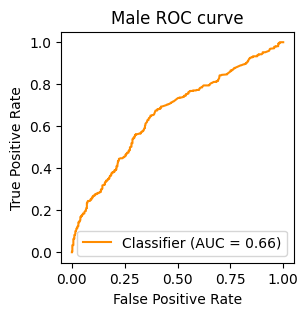

Female
training with 3360 samples; test with 840 samples
AUROC: 0.6677


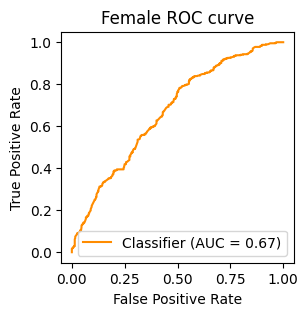

18 - 34 years
training with 3360 samples; test with 840 samples
AUROC: 0.6326


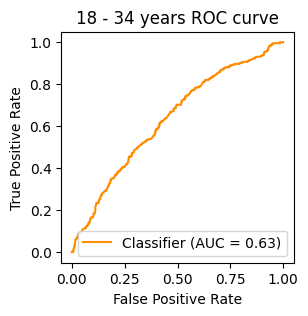

35 - 54 years
training with 3360 samples; test with 840 samples
AUROC: 0.5862


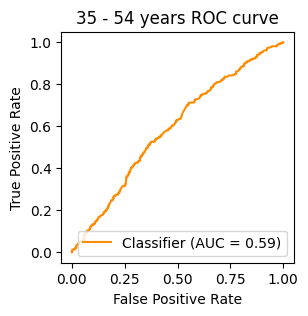

55 or older
training with 3360 samples; test with 840 samples
AUROC: 0.6283


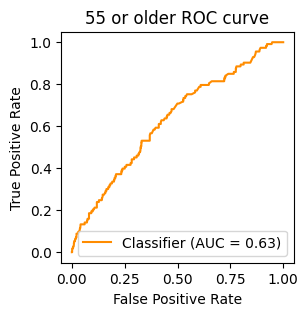

Yes
training with 3360 samples; test with 840 samples
AUROC: 0.6280


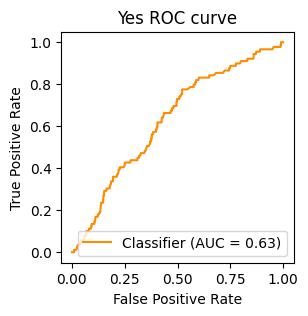

No
training with 3360 samples; test with 840 samples
AUROC: 0.5749


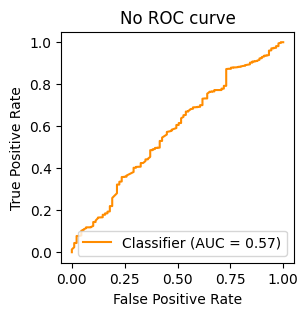

White
training with 3360 samples; test with 840 samples
AUROC: 0.5455


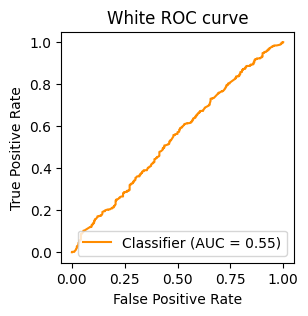

Black
training with 3360 samples; test with 840 samples
AUROC: 0.6236


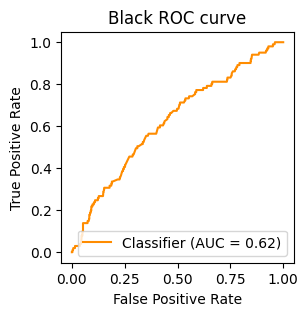

Asian
training with 3360 samples; test with 840 samples
AUROC: 0.6636


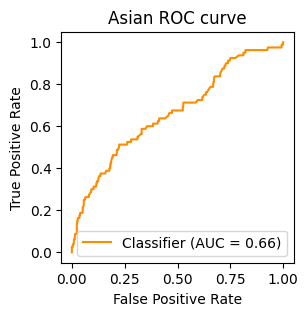

Other or mixed
training with 3360 samples; test with 840 samples
AUROC: 0.5494


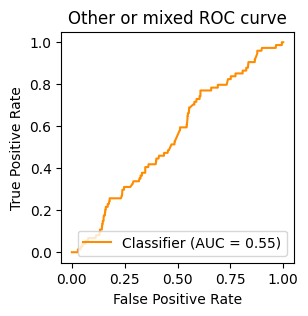

Less than $50,000
training with 3360 samples; test with 840 samples
AUROC: 0.6203


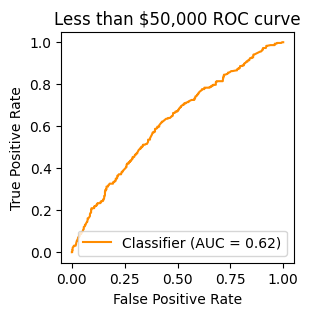

$50,000 - $99,999
training with 3360 samples; test with 840 samples
AUROC: 0.5131


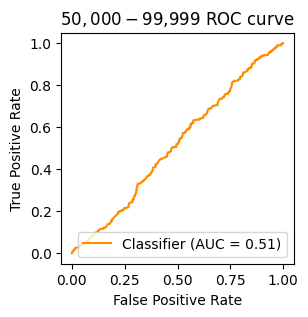

$100,000 or more
training with 3360 samples; test with 840 samples
AUROC: 0.5708


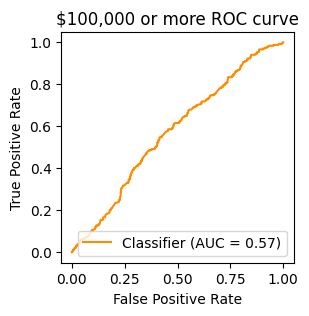


--------------------
Subsample with 0.6 of data

k=200
X shape: (5040, 48)
Male
training with 4032 samples; test with 1008 samples
AUROC: 0.6650


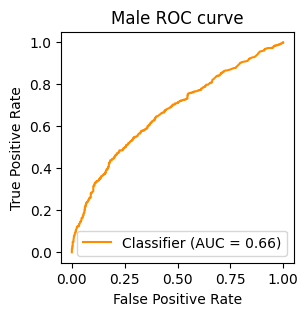

Female
training with 4032 samples; test with 1008 samples
AUROC: 0.6804


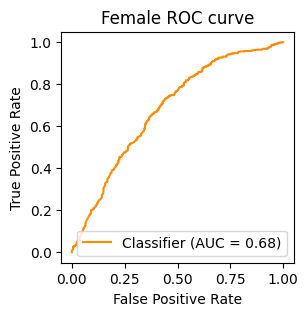

18 - 34 years
training with 4032 samples; test with 1008 samples
AUROC: 0.6448


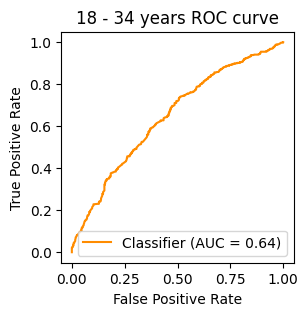

35 - 54 years
training with 4032 samples; test with 1008 samples
AUROC: 0.6039


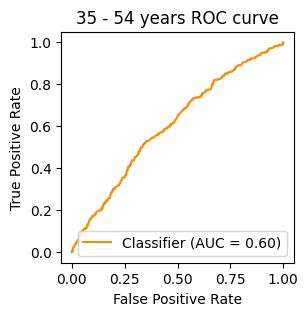

55 or older
training with 4032 samples; test with 1008 samples
AUROC: 0.6567


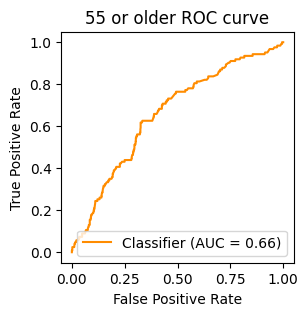

Yes
training with 4032 samples; test with 1008 samples
AUROC: 0.5682


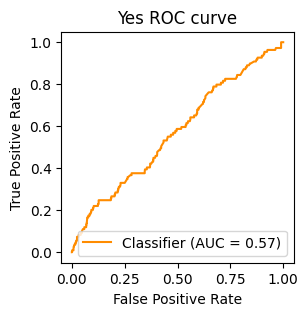

No
training with 4032 samples; test with 1008 samples
AUROC: 0.5980


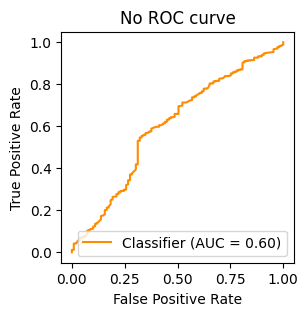

White
training with 4032 samples; test with 1008 samples
AUROC: 0.5878


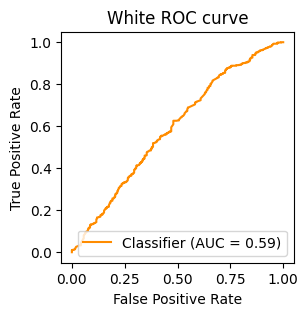

Black
training with 4032 samples; test with 1008 samples
AUROC: 0.6252


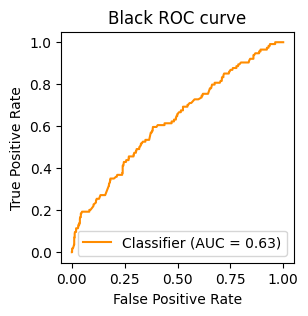

Asian
training with 4032 samples; test with 1008 samples
AUROC: 0.7078


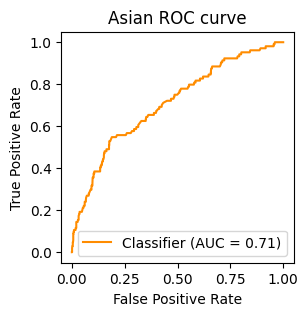

Other or mixed
training with 4032 samples; test with 1008 samples
AUROC: 0.5240


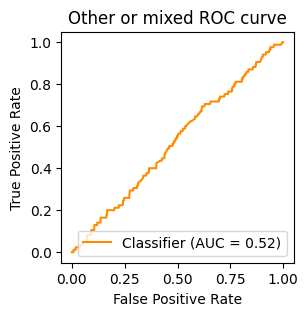

Less than $50,000
training with 4032 samples; test with 1008 samples
AUROC: 0.6097


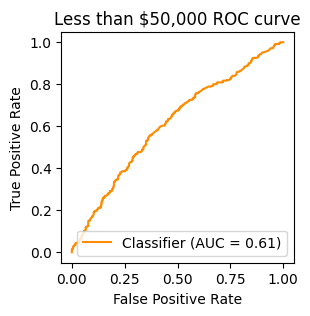

$50,000 - $99,999
training with 4032 samples; test with 1008 samples
AUROC: 0.5251


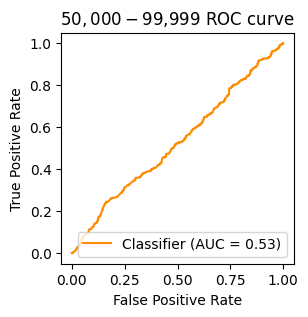

$100,000 or more
training with 4032 samples; test with 1008 samples
AUROC: 0.6103


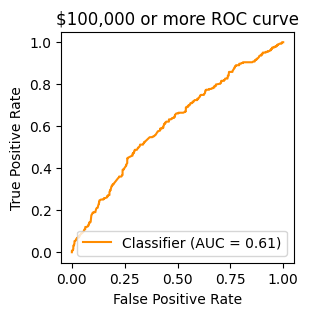


--------------------
Subsample with 0.7 of data

k=200
X shape: (5880, 48)
Male
training with 4704 samples; test with 1176 samples
AUROC: 0.6681


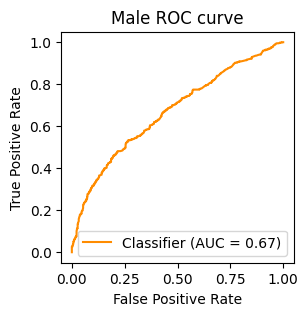

Female
training with 4704 samples; test with 1176 samples
AUROC: 0.6697


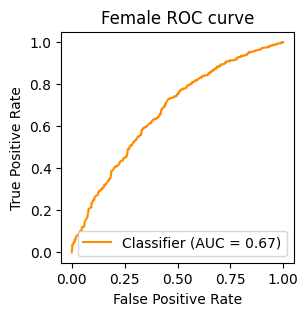

18 - 34 years
training with 4704 samples; test with 1176 samples
AUROC: 0.6432


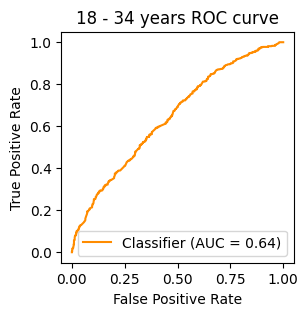

35 - 54 years
training with 4704 samples; test with 1176 samples
AUROC: 0.5658


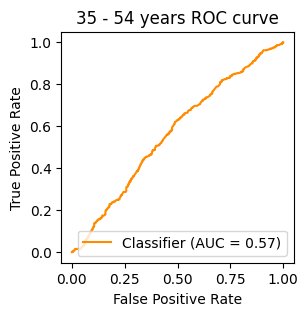

55 or older
training with 4704 samples; test with 1176 samples
AUROC: 0.6394


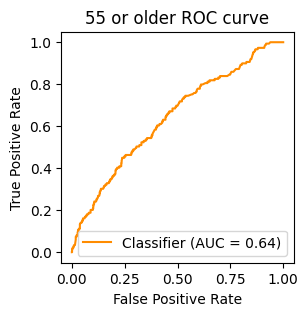

Yes
training with 4704 samples; test with 1176 samples
AUROC: 0.5806


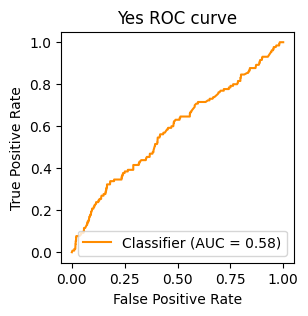

No
training with 4704 samples; test with 1176 samples
AUROC: 0.6059


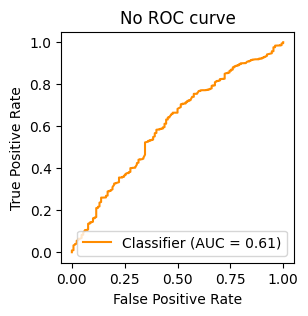

White
training with 4704 samples; test with 1176 samples
AUROC: 0.5670


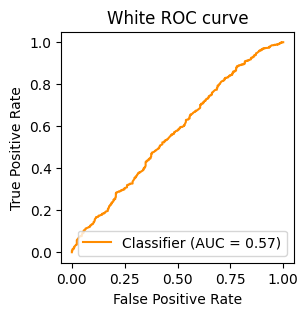

Black
training with 4704 samples; test with 1176 samples
AUROC: 0.6399


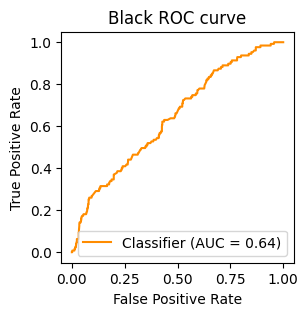

Asian
training with 4704 samples; test with 1176 samples
AUROC: 0.7187


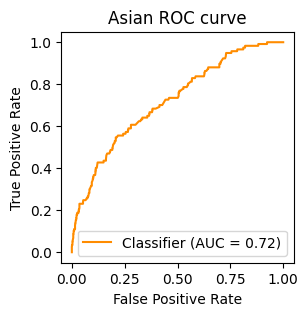

Other or mixed
training with 4704 samples; test with 1176 samples
AUROC: 0.5688


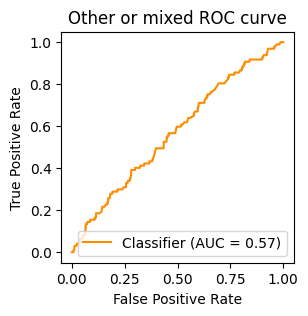

Less than $50,000
training with 4704 samples; test with 1176 samples
AUROC: 0.6085


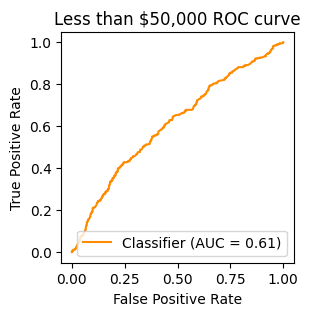

$50,000 - $99,999
training with 4704 samples; test with 1176 samples
AUROC: 0.4925


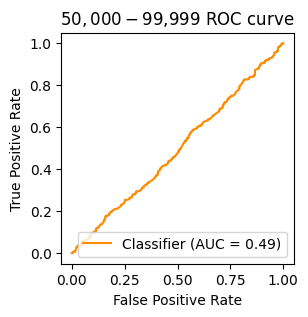

$100,000 or more
training with 4704 samples; test with 1176 samples
AUROC: 0.6011


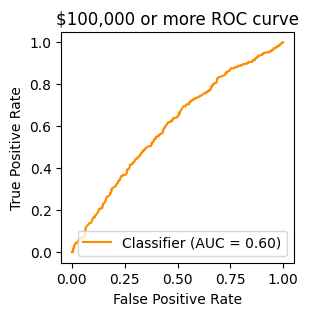


--------------------
Subsample with 0.8 of data

k=200
X shape: (6720, 54)
Male
training with 5376 samples; test with 1344 samples
AUROC: 0.6716


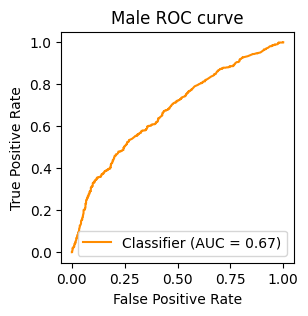

Female
training with 5376 samples; test with 1344 samples
AUROC: 0.6778


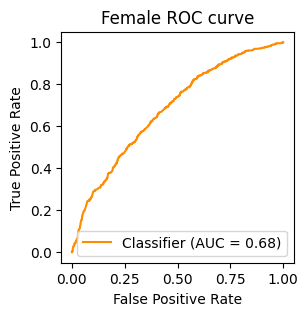

18 - 34 years
training with 5376 samples; test with 1344 samples
AUROC: 0.6227


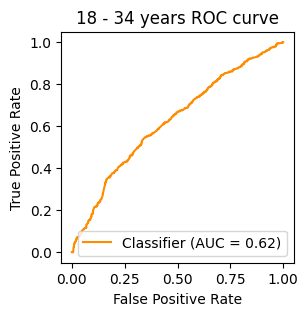

35 - 54 years
training with 5376 samples; test with 1344 samples
AUROC: 0.5684


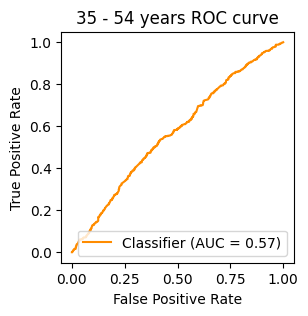

55 or older
training with 5376 samples; test with 1344 samples
AUROC: 0.6715


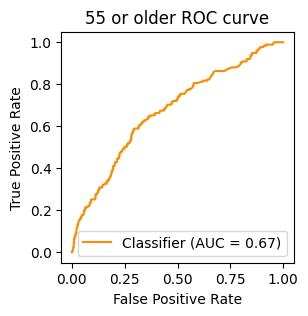

Yes
training with 5376 samples; test with 1344 samples
AUROC: 0.6141


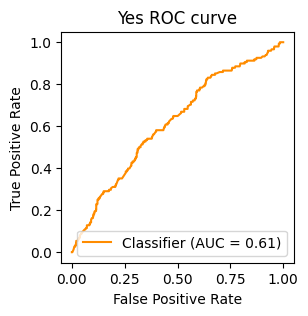

No
training with 5376 samples; test with 1344 samples
AUROC: 0.5861


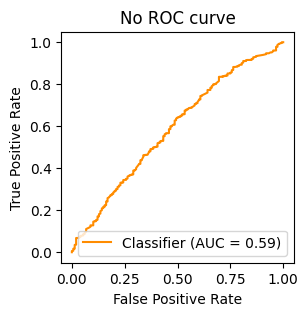

White
training with 5376 samples; test with 1344 samples
AUROC: 0.5706


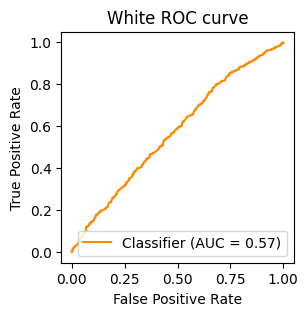

Black
training with 5376 samples; test with 1344 samples
AUROC: 0.6317


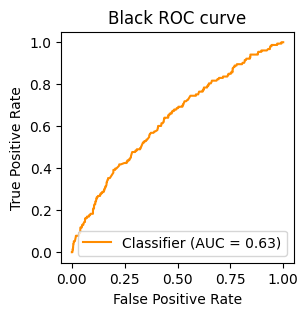

Asian
training with 5376 samples; test with 1344 samples
AUROC: 0.6938


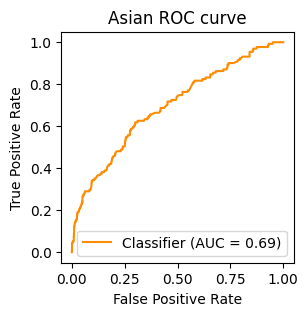

Other or mixed
training with 5376 samples; test with 1344 samples
AUROC: 0.5940


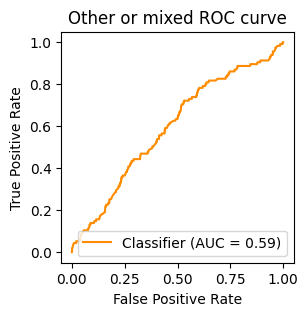

Less than $50,000
training with 5376 samples; test with 1344 samples
AUROC: 0.5905


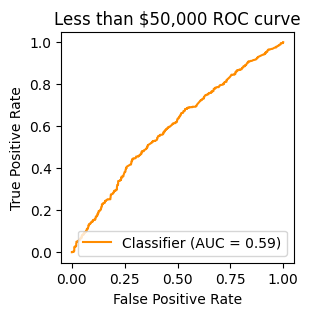

$50,000 - $99,999
training with 5376 samples; test with 1344 samples
AUROC: 0.4709


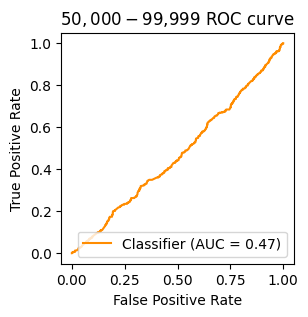

$100,000 or more
training with 5376 samples; test with 1344 samples
AUROC: 0.6041


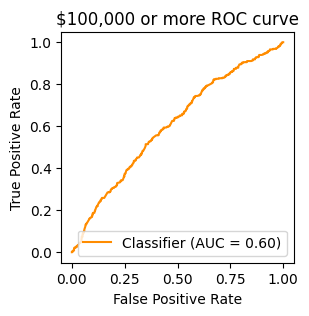


--------------------
Subsample with 0.9 of data

k=200
X shape: (7560, 56)
Male
training with 6048 samples; test with 1512 samples
AUROC: 0.6544


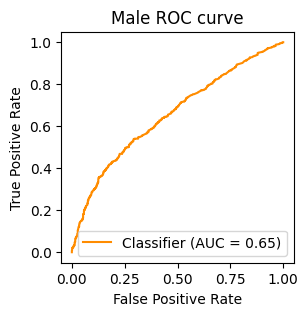

Female
training with 6048 samples; test with 1512 samples
AUROC: 0.6654


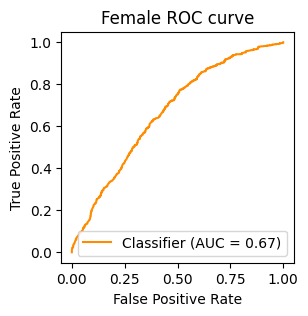

18 - 34 years
training with 6048 samples; test with 1512 samples
AUROC: 0.6442


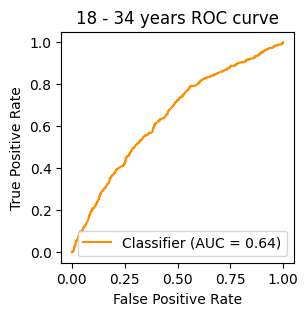

35 - 54 years
training with 6048 samples; test with 1512 samples
AUROC: 0.5704


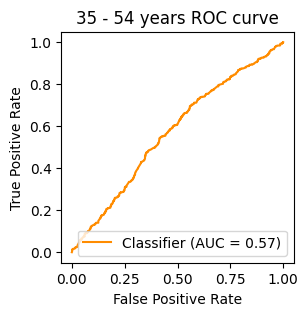

55 or older
training with 6048 samples; test with 1512 samples
AUROC: 0.6719


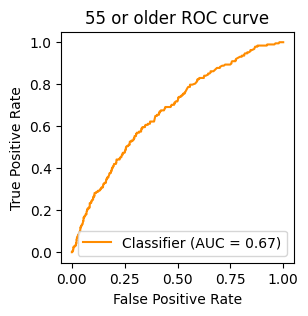

Yes
training with 6048 samples; test with 1512 samples
AUROC: 0.5855


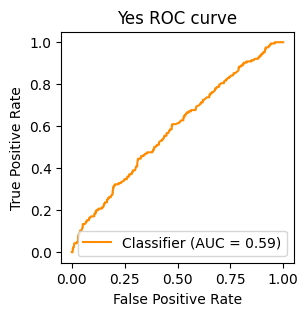

No
training with 6048 samples; test with 1512 samples
AUROC: 0.5942


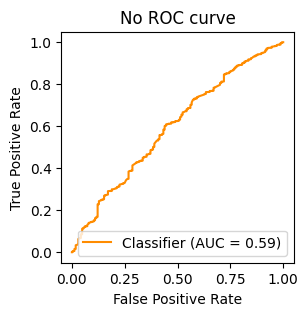

White
training with 6048 samples; test with 1512 samples
AUROC: 0.6135


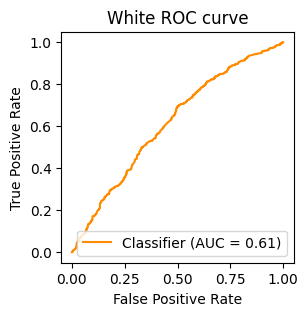

Black
training with 6048 samples; test with 1512 samples
AUROC: 0.6510


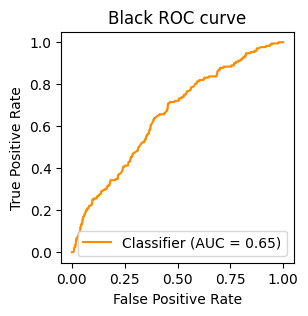

Asian
training with 6048 samples; test with 1512 samples
AUROC: 0.6874


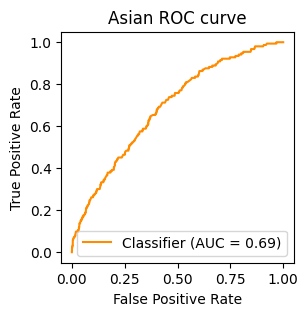

Other or mixed
training with 6048 samples; test with 1512 samples
AUROC: 0.5697


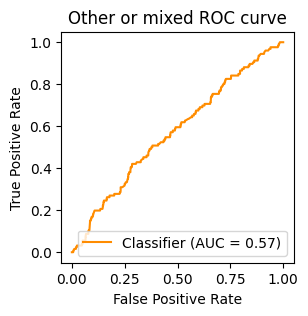

Less than $50,000
training with 6048 samples; test with 1512 samples
AUROC: 0.6067


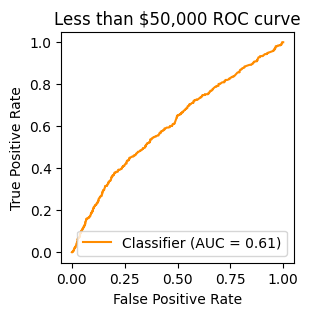

$50,000 - $99,999
training with 6048 samples; test with 1512 samples
AUROC: 0.5160


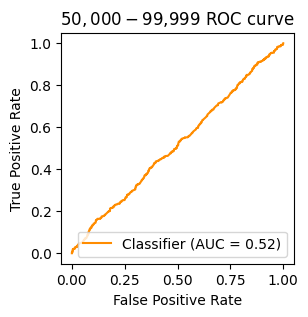

$100,000 or more
training with 6048 samples; test with 1512 samples
AUROC: 0.6022


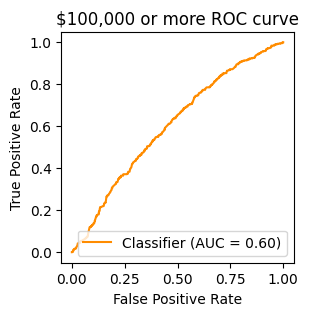


--------------------
Subsample with 1.0 of data

k=200
X shape: (8400, 58)
Male
training with 6720 samples; test with 1680 samples
AUROC: 0.6635


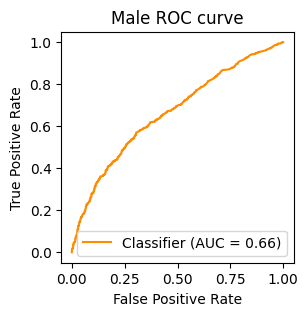

Female
training with 6720 samples; test with 1680 samples
AUROC: 0.6497


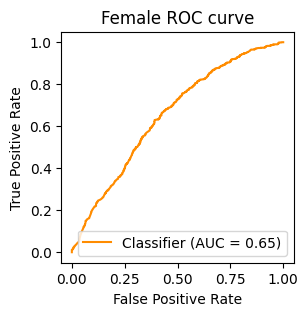

18 - 34 years
training with 6720 samples; test with 1680 samples
AUROC: 0.6368


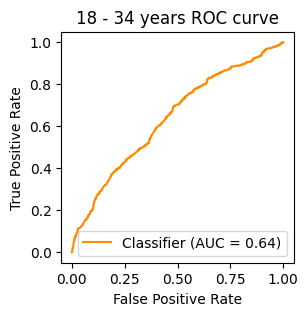

35 - 54 years
training with 6720 samples; test with 1680 samples
AUROC: 0.5783


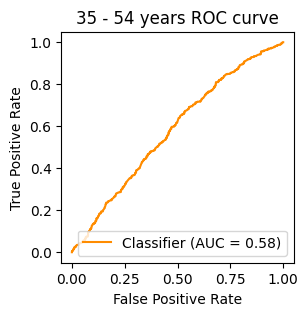

55 or older
training with 6720 samples; test with 1680 samples
AUROC: 0.6474


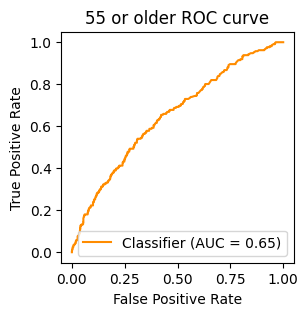

Yes
training with 6720 samples; test with 1680 samples
AUROC: 0.6047


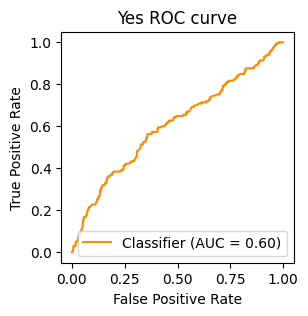

No
training with 6720 samples; test with 1680 samples
AUROC: 0.6155


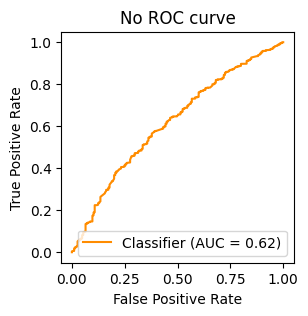

White
training with 6720 samples; test with 1680 samples
AUROC: 0.5585


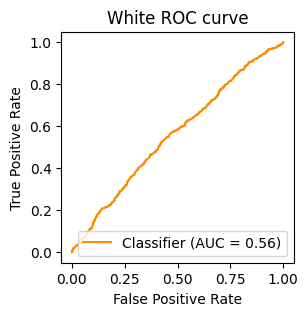

Black
training with 6720 samples; test with 1680 samples
AUROC: 0.6381


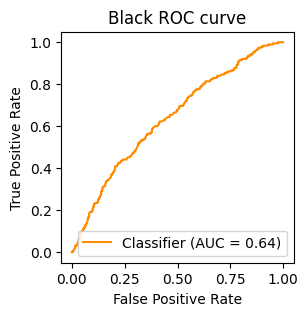

Asian
training with 6720 samples; test with 1680 samples
AUROC: 0.7252


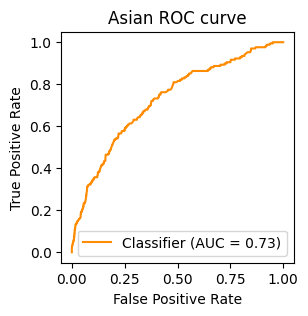

Other or mixed
training with 6720 samples; test with 1680 samples
AUROC: 0.5716


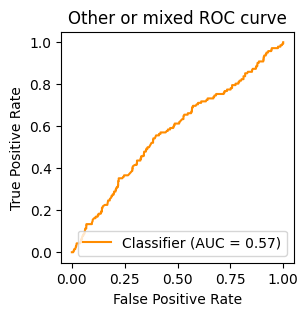

Less than $50,000
training with 6720 samples; test with 1680 samples
AUROC: 0.6024


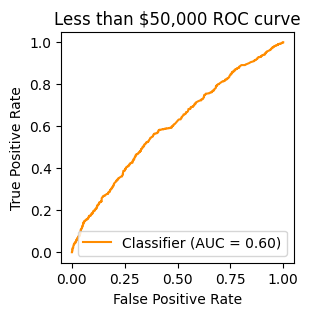

$50,000 - $99,999
training with 6720 samples; test with 1680 samples
AUROC: 0.5246


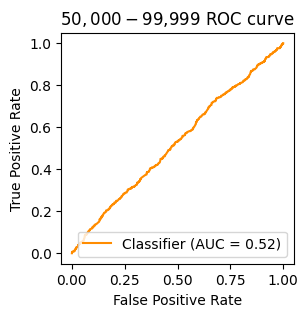

$100,000 or more
training with 6720 samples; test with 1680 samples
AUROC: 0.6152


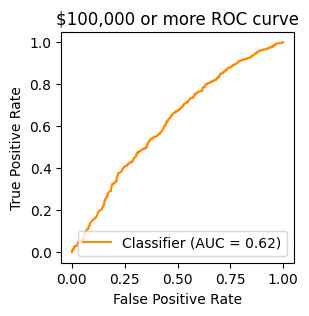

In [ ]:
"""
Make a dictionary with varying k: [1, 50, 100, 150, 200]

{
k: {
  (float) frac: {
    X: X data at the subsampled data
    demos_data: all the demos data set up with subsampled X
    model_results: {AUC: AUC on test data, clf: <trained classifier>}
  }
}
"""
k_list = [1, 50, 100, 150, 200]
k_subsample_data_model_results = {}
fracs = [round(0.1*i,1) for i in range(2,11)]
for k in k_list:
  subsample_data_model_results = {}
  for frac in fracs:
    print('\n--------------------\nSubsample with %s of data\n' % frac)
    subsample_df = sba_df.sample(frac=frac, replace=False)
    subsample_X = get_X(df=subsample_df, k=k)
    subsample_demos_data = setup_demos_data(subsample_X)
    model_results = demo_model_results_dict = get_trained_demo_model_results(subsample_demos_data)
    subsample_data_model_results[frac] = {
      'X': subsample_X,
      'demos_data': subsample_demos_data,
      'model_results': model_results,
    }
  k_subsample_data_model_results[k] = subsample_data_model_results

In [ ]:
k_results_dfs = {}
for k, subsample_dict in k_subsample_data_model_results.items():
  print('k=%s'%k)
  df = pd.DataFrame(
    {'AUROC@%s'%frac: [demo_dict['AUROC'] for demo_dict in subsample_dict[frac]['model_results'].values()] for frac in fracs},
  index=list(demo_model_results_dict.keys()))
  display(df)
  k_results_dfs[k] = df

k=1


,AUROC@0.2,AUROC@0.3,AUROC@0.4,AUROC@0.5,AUROC@0.6,AUROC@0.7,AUROC@0.8,AUROC@0.9,AUROC@1.0
Male,0.579734,0.635393,0.602901,0.646174,0.613479,0.622292,0.637859,0.640820,0.616623
Female,0.535166,0.637394,0.623338,0.627392,0.596196,0.604389,0.635295,0.642943,0.634848
18 - 34 years,0.560347,0.612797,0.605862,0.606521,0.608941,0.622931,0.607981,0.618413,0.627495
35 - 54 years,0.541939,0.493941,0.523531,0.511913,0.512937,0.564083,0.522593,0.521665,0.541112
55 or older,0.545918,0.541892,0.556579,0.589032,0.608203,0.623957,0.613731,0.642371,0.591712
Yes,0.639358,0.594898,0.603715,0.620532,0.578519,0.559910,0.632305,0.584394,0.592575
No,0.604772,0.528548,0.554398,0.572004,0.599684,0.595058,0.575155,0.574311,0.579127
White,0.577341,0.559369,0.536589,0.560413,0.553881,0.554912,0.551912,0.574643,0.566496
Black,0.667537,0.540067,0.634405,0.589614,0.588418,0.617613,0.621345,0.637239,0.618287
Asian,0.603037,0.663826,0.538027,0.575211,0.637114,0.636058,0.695840,0.658106,0.624364


k=50


,AUROC@0.2,AUROC@0.3,AUROC@0.4,AUROC@0.5,AUROC@0.6,AUROC@0.7,AUROC@0.8,AUROC@0.9,AUROC@1.0
Male,0.670872,0.662533,0.660144,0.652072,0.652859,0.664174,0.653378,0.634713,0.669518
Female,0.637762,0.675969,0.662307,0.659128,0.666573,0.652279,0.645608,0.661438,0.666684
18 - 34 years,0.616233,0.663236,0.639084,0.670018,0.634567,0.640582,0.625958,0.630169,0.645173
35 - 54 years,0.573598,0.541341,0.573347,0.599154,0.546521,0.573330,0.581915,0.592275,0.568734
55 or older,0.593050,0.669463,0.677753,0.621577,0.649605,0.695926,0.661185,0.644796,0.634713
Yes,0.514011,0.537119,0.667178,0.606501,0.632579,0.609167,0.592688,0.566541,0.607116
No,0.612131,0.567428,0.644538,0.577002,0.585907,0.632650,0.574735,0.598595,0.597946
White,0.546198,0.526516,0.548332,0.583786,0.575064,0.572629,0.577769,0.559821,0.567072
Black,0.554462,0.616727,0.539241,0.599840,0.649656,0.681382,0.653812,0.697259,0.669972
Asian,0.665563,0.689123,0.707526,0.618381,0.704793,0.733896,0.713948,0.702709,0.714199


k=100


,AUROC@0.2,AUROC@0.3,AUROC@0.4,AUROC@0.5,AUROC@0.6,AUROC@0.7,AUROC@0.8,AUROC@0.9,AUROC@1.0
Male,0.671527,0.649654,0.662757,0.662848,0.655274,0.662004,0.666813,0.655138,0.670406
Female,0.653398,0.689170,0.636637,0.683038,0.674996,0.661039,0.654602,0.679302,0.664141
18 - 34 years,0.634774,0.642678,0.644160,0.655453,0.647469,0.651080,0.639718,0.635875,0.650547
35 - 54 years,0.570998,0.576555,0.593132,0.602129,0.602754,0.587379,0.575719,0.580800,0.569013
55 or older,0.638740,0.654373,0.652606,0.656105,0.670431,0.619374,0.666166,0.657153,0.690908
Yes,0.555105,0.634489,0.551111,0.557160,0.566517,0.616346,0.628288,0.590473,0.615766
No,0.576147,0.594858,0.622755,0.588471,0.561121,0.597625,0.602927,0.626694,0.596397
White,0.541800,0.583881,0.570591,0.593403,0.569434,0.577492,0.577717,0.585970,0.606085
Black,0.662663,0.586168,0.640726,0.634465,0.659045,0.648910,0.642138,0.661944,0.668903
Asian,0.609851,0.675018,0.639826,0.750561,0.718591,0.718083,0.706618,0.690340,0.684764


k=150


,AUROC@0.2,AUROC@0.3,AUROC@0.4,AUROC@0.5,AUROC@0.6,AUROC@0.7,AUROC@0.8,AUROC@0.9,AUROC@1.0
Male,0.697950,0.635647,0.674963,0.638101,0.644924,0.674287,0.653131,0.668260,0.665050
Female,0.700957,0.646190,0.669609,0.658003,0.662353,0.638369,0.652350,0.677043,0.654767
18 - 34 years,0.672460,0.599696,0.653893,0.642934,0.652040,0.649514,0.645317,0.647458,0.649512
35 - 54 years,0.575872,0.538116,0.592012,0.587668,0.578950,0.581637,0.590054,0.576259,0.575719
55 or older,0.645558,0.665033,0.654923,0.612313,0.656371,0.666636,0.674894,0.657019,0.668213
Yes,0.666258,0.658271,0.596508,0.552224,0.587785,0.561542,0.592429,0.588288,0.569122
No,0.613682,0.652561,0.572381,0.617815,0.612643,0.580651,0.609849,0.584271,0.607022
White,0.539760,0.580313,0.539062,0.582449,0.568914,0.573386,0.596682,0.575307,0.560481
Black,0.578638,0.587060,0.652385,0.634353,0.637505,0.646421,0.669616,0.665655,0.654018
Asian,0.693483,0.660203,0.707709,0.732242,0.714995,0.691222,0.758070,0.710817,0.714276


k=200


,AUROC@0.2,AUROC@0.3,AUROC@0.4,AUROC@0.5,AUROC@0.6,AUROC@0.7,AUROC@0.8,AUROC@0.9,AUROC@1.0
Male,0.610766,0.595622,0.660578,0.657759,0.664967,0.668080,0.671621,0.654394,0.663488
Female,0.560630,0.644723,0.660243,0.667744,0.680350,0.669652,0.677833,0.665439,0.649701
18 - 34 years,0.583611,0.606346,0.633950,0.632572,0.644787,0.643165,0.622688,0.644246,0.636783
35 - 54 years,0.551223,0.538974,0.550180,0.586163,0.603869,0.565778,0.568449,0.570446,0.578278
55 or older,0.536884,0.672120,0.583409,0.628349,0.656663,0.639404,0.671546,0.671888,0.647369
Yes,0.622212,0.567565,0.600108,0.627994,0.568226,0.580571,0.614085,0.585454,0.604709
No,0.586109,0.559992,0.592249,0.574889,0.598009,0.605876,0.586112,0.594180,0.615489
White,0.571478,0.579614,0.571900,0.545541,0.587760,0.567018,0.570616,0.613543,0.558458
Black,0.637745,0.578359,0.562517,0.623582,0.625186,0.639859,0.631655,0.650952,0.638116
Asian,0.702270,0.682486,0.649879,0.663635,0.707752,0.718724,0.693760,0.687383,0.725220


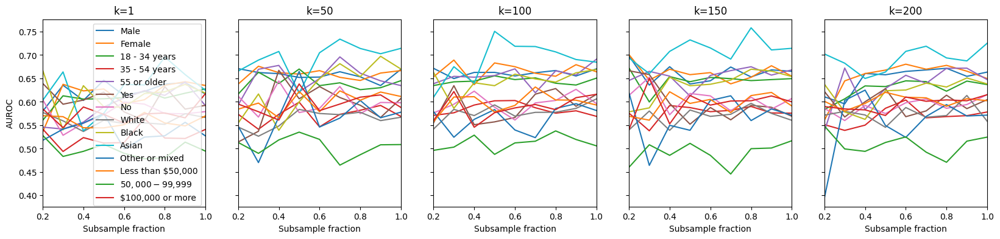

In [ ]:
fig, axes = plt.subplots(1,len(k_results_dfs),figsize=(4*len(k_results_dfs),4), sharex=True, sharey=True)
for i, (k, results_df) in enumerate(k_results_dfs.items()):
  #display(results_df.transpose())
  ax = axes[i]
  ax.set_xlim(0.2, 1.0)
  for demo in demos_data.keys():
    ax.plot(fracs, results_df.transpose()[demo], label=demo)
  ax.set_title('k=%s'%k)
  ax.set_xlabel('Subsample fraction')
axes[0].legend()
axes[0].set_ylabel('AUROC')
plt.show()